In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
pip install yacs

In [ ]:
import os
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


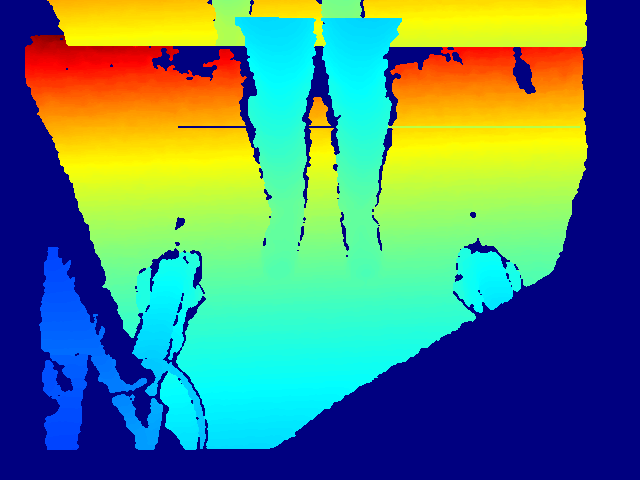

In [ ]:
def convert_depth_to_image(depth_frame):
    # Normalize depth values
    depth_frame_normalized = cv2.normalize(depth_frame, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    # Apply a colormap for better visualization
    depth_image_colored = cv2.applyColorMap(depth_frame_normalized, cv2.COLORMAP_JET)
    return depth_image_colored

# Load depth image from file
depth_frame = cv2.imread('/content/drive/MyDrive/Project/Copy of gait_depth_registered_00000_1594737803_858384125.png', cv2.IMREAD_UNCHANGED)  # Replace 'path_to_depth_image.png' with your actual file path

# Check if the image was loaded successfully
if depth_frame is None:
    print("Error: Unable to load depth image.")
else:
    # Convert depth image to colored image
    depth_image = convert_depth_to_image(depth_frame)

    # Display the resulting depth image
    cv2_imshow(depth_image)


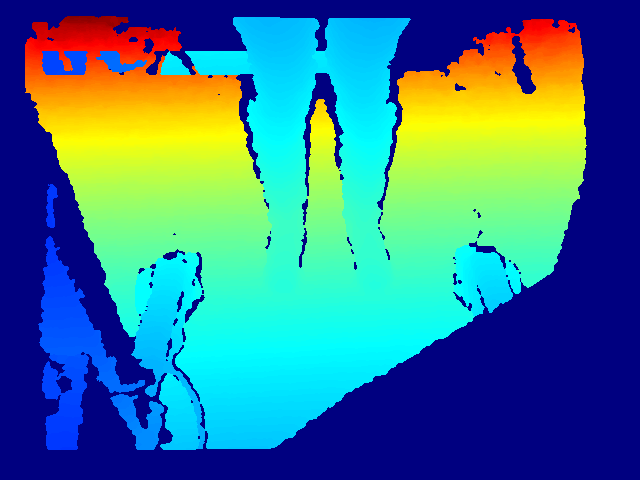

In [ ]:
def convert_depth_to_image(depth_frame):
    # Normalize depth values
    depth_frame_normalized = cv2.normalize(depth_frame, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    # Apply a colormap for better visualization
    depth_image_colored = cv2.applyColorMap(depth_frame_normalized, cv2.COLORMAP_JET)
    return depth_image_colored

# Load depth image from file
depth_frame = cv2.imread('/content/drive/MyDrive/Project/gait_depth_registered_00000_1594737348_334172956.png', cv2.IMREAD_UNCHANGED)  # Replace 'path_to_depth_image.png' with your actual file path

# Check if the image was loaded successfully
if depth_frame is None:
    print("Error: Unable to load depth image.")
else:
    # Convert depth image to colored image
    depth_image = convert_depth_to_image(depth_frame)

    # Display the resulting depth image
    cv2_imshow(depth_image)


In [ ]:
# Define the COCO keypoints indexes for the legs
COCO_LEG_KEYPOINT_INDEXES = [0,1, 2, 3, 4, 5]

In [ ]:
def extract_leg_keypoints(all_keypoints):
    """
    Extract keypoints related to the legs from the full body keypoints.
    """
    leg_keypoints = []
    for idx in COCO_LEG_KEYPOINT_INDEXES:
        if idx < len(all_keypoints):
            leg_keypoints.append(all_keypoints[idx])
        else:
            leg_keypoints.append(None)
    return leg_keypoints

In [ ]:
def visualize_leg_movements(image, leg_keypoints):
    if len(leg_keypoints) < 6:
        print("Not enough keypoints to visualize leg movements.")
        return

    # Define the skeleton for legs
    LEG_SKELETON = [
        [0, 1], [1, 2], [2, 3], [3, 4], [4, 5]
    ]

    # Draw skeleton lines between leg keypoints
    for i in range(len(LEG_SKELETON)):
        kpt_a, kpt_b = LEG_SKELETON[i][0], LEG_SKELETON[i][1]
        if kpt_a < len(leg_keypoints) and kpt_b < len(leg_keypoints):
            if leg_keypoints[kpt_a] is not None and leg_keypoints[kpt_b] is not None:
                x_a, y_a = leg_keypoints[kpt_a]
                x_b, y_b = leg_keypoints[kpt_b]
                cv2.circle(image, (int(x_a), int(y_a)), 6, (255, 0, 0), -1)
                cv2.circle(image, (int(x_b), int(y_b)), 6, (255, 0, 0), -1)
                cv2.line(image, (int(x_a), int(y_a)), (int(x_b), int(y_b)), (255, 0, 0), 2)
    # Display the image with leg movements
    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.title("Leg Movements")
    plt.axis('off')
    plt.show()

Using cache found in /root/.cache/torch/hub/yangsenius_TransPose_main


>>Load pretrained weights from url: https://github.com/yangsenius/TransPose/releases/download/Hub/tp_h_48_256x192_enc4_d96_h192_mh1.pth
Successfully loaded model  (on cpu) with pretrained weights!
Leg keypoints for frame 1: [array([59., 22.], dtype=float32), array([61., 22.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([28., 20.], dtype=float32), array([28., 20.], dtype=float32)]
Leg keypoints for frame 2: [array([36., 11.], dtype=float32), array([37., 12.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([34., 18.], dtype=float32), array([ 3., 19.], dtype=float32)]
Leg keypoints for frame 3: [array([40., 11.], dtype=float32), array([33., 12.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([ 2., 34.], dtype=float32), array([ 2., 37.], dtype=float32)]
Leg keypoints for frame 4: [array([59., 31.], dtype=float32), array([59., 28.], dtype=float32), array([60.,

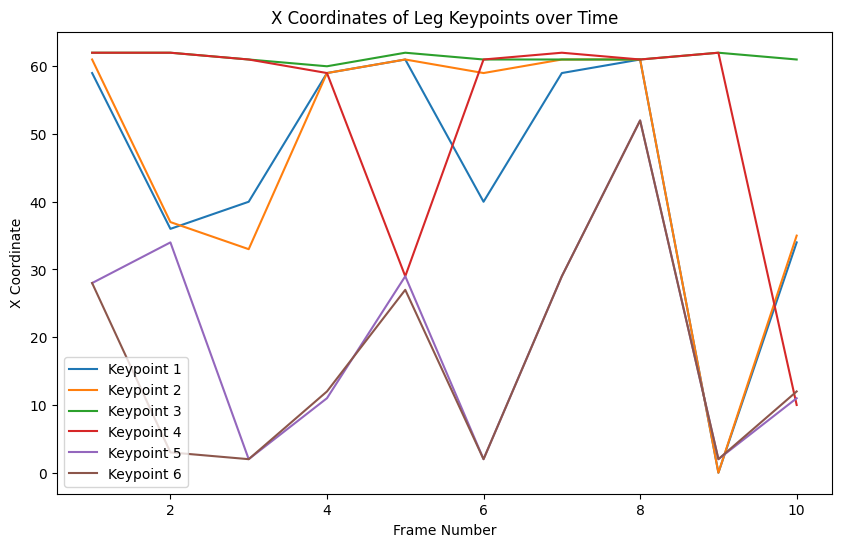

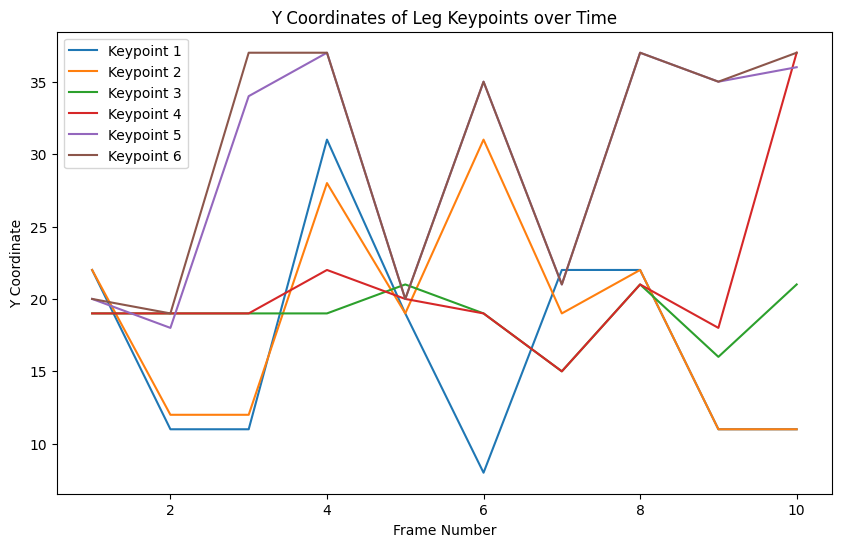

Leg keypoints for frame 11: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 21.], dtype=float32), array([62., 19.], dtype=float32), array([12., 37.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 12: [array([61., 15.], dtype=float32), array([ 0., 10.], dtype=float32), array([61., 17.], dtype=float32), array([12., 35.], dtype=float32), array([61., 15.], dtype=float32), array([61., 15.], dtype=float32)]
Leg keypoints for frame 13: [array([57., 22.], dtype=float32), array([57., 34.], dtype=float32), array([61., 22.], dtype=float32), array([58., 22.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 14: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([12., 35.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 15: [array([ 3., 19.], dtype=float32), array

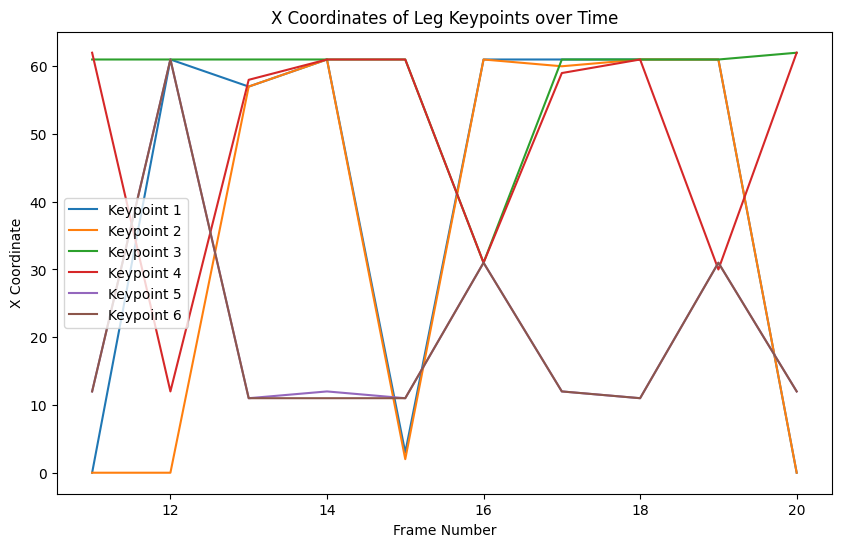

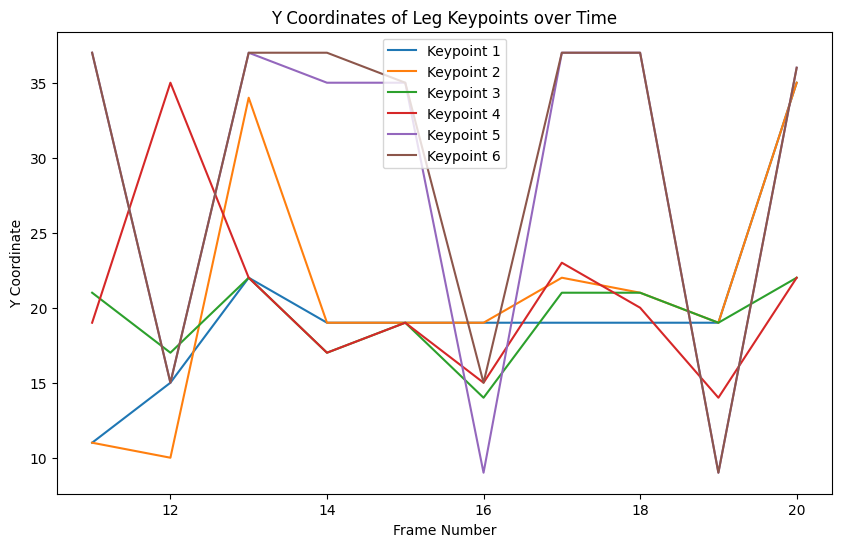

Leg keypoints for frame 21: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([61., 19.], dtype=float32), array([ 2., 35.], dtype=float32), array([ 2., 35.], dtype=float32)]
Leg keypoints for frame 22: [array([38.,  9.], dtype=float32), array([40.,  8.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([34., 21.], dtype=float32), array([34., 21.], dtype=float32)]
Leg keypoints for frame 23: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([12., 34.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 24: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([35., 21.], dtype=float32), array([ 0., 11.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 25: [array([ 0., 13.], dtype=float32), array

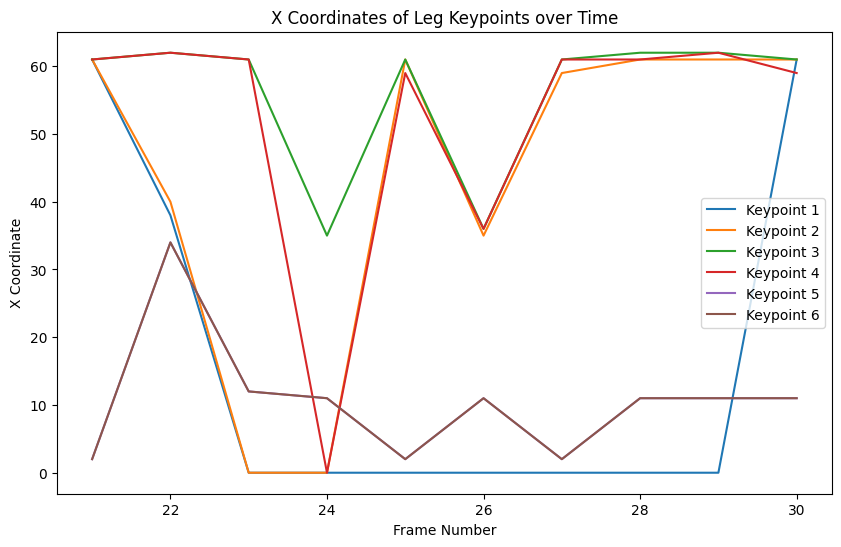

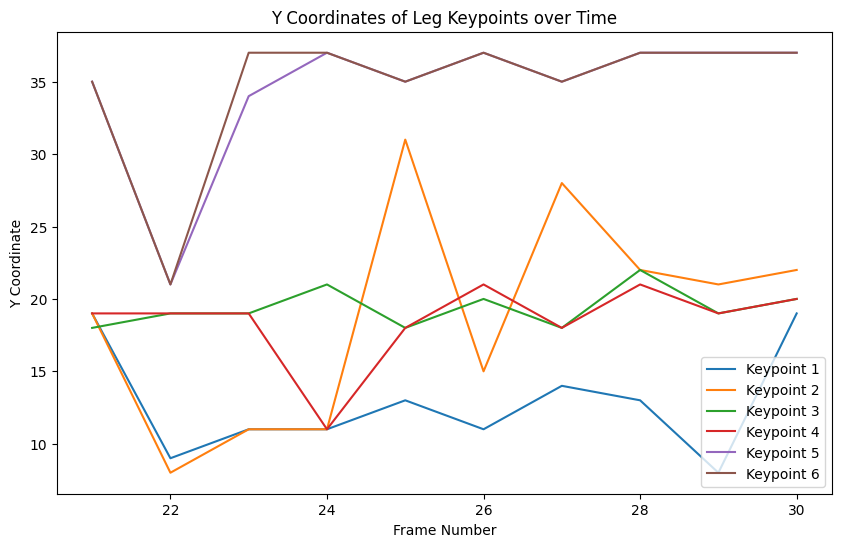

Leg keypoints for frame 31: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([59., 19.], dtype=float32), array([11., 37.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 32: [array([0., 8.], dtype=float32), array([0., 8.], dtype=float32), array([11., 37.], dtype=float32), array([ 4., 37.], dtype=float32), array([11., 36.], dtype=float32), array([13., 37.], dtype=float32)]
Leg keypoints for frame 33: [array([61., 21.], dtype=float32), array([61., 21.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([31., 17.], dtype=float32), array([31., 17.], dtype=float32)]
Leg keypoints for frame 34: [array([ 2., 19.], dtype=float32), array([ 2., 19.], dtype=float32), array([60., 21.], dtype=float32), array([ 4., 42.], dtype=float32), array([11., 36.], dtype=float32), array([11., 36.], dtype=float32)]
Leg keypoints for frame 35: [array([61., 19.], dtype=float32), array([61

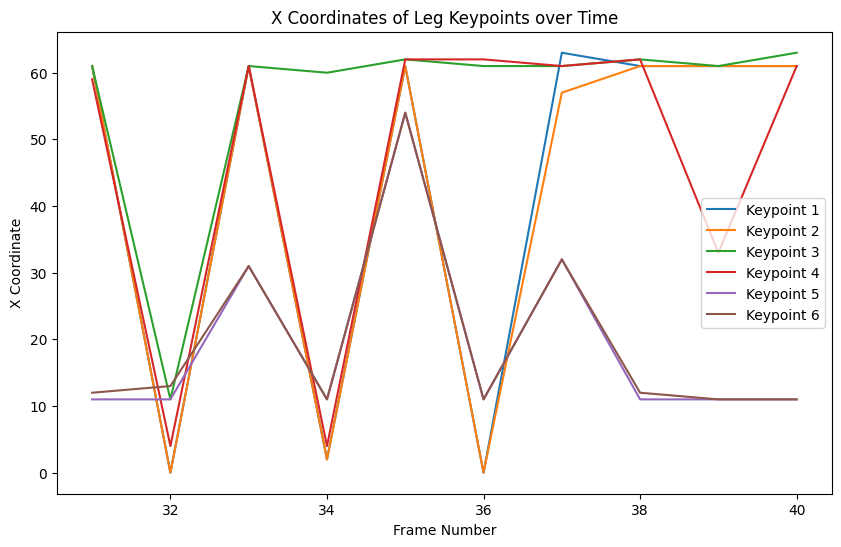

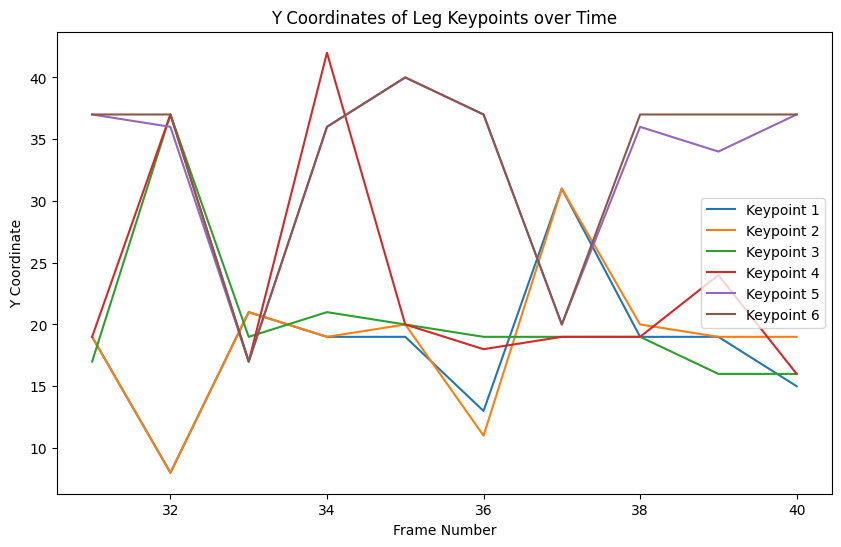

Leg keypoints for frame 41: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 42: [array([60., 33.], dtype=float32), array([ 4., 41.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([56., 34.], dtype=float32), array([56., 34.], dtype=float32)]
Leg keypoints for frame 43: [array([ 0., 14.], dtype=float32), array([ 0., 14.], dtype=float32), array([10., 36.], dtype=float32), array([ 2., 38.], dtype=float32), array([12., 36.], dtype=float32), array([12., 36.], dtype=float32)]
Leg keypoints for frame 44: [array([35., 17.], dtype=float32), array([61., 31.], dtype=float32), array([33., 17.], dtype=float32), array([33., 17.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 45: [array([61., 19.], dtype=float32), array

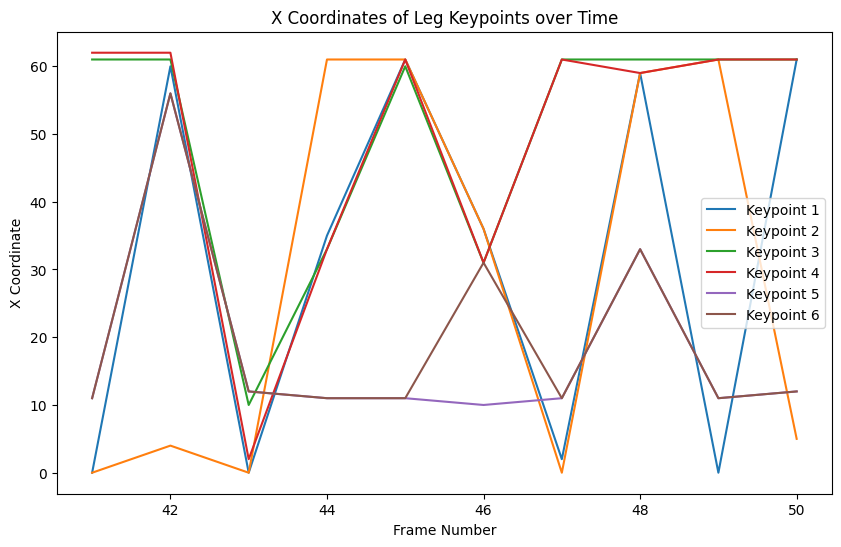

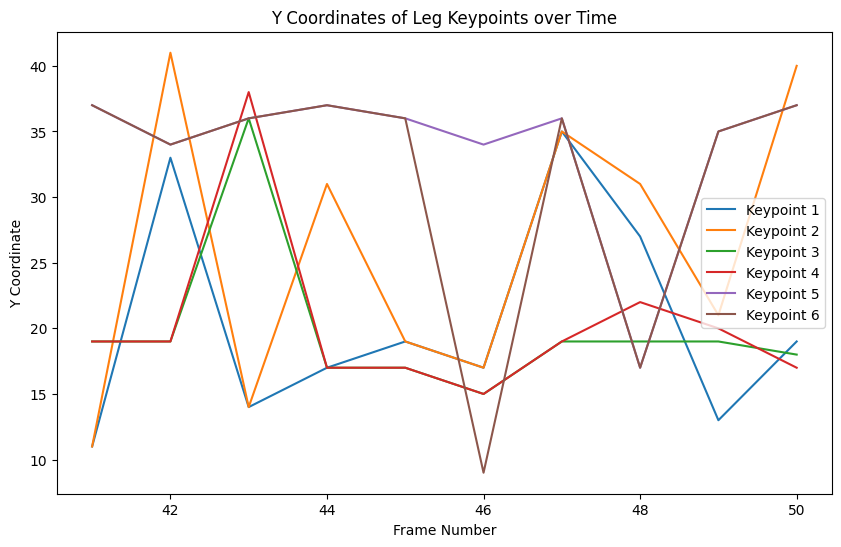

Leg keypoints for frame 51: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([59., 33.], dtype=float32), array([ 4., 37.], dtype=float32), array([ 2., 37.], dtype=float32), array([ 2., 37.], dtype=float32)]
Leg keypoints for frame 52: [array([ 0., 11.], dtype=float32), array([57., 31.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32), array([59., 19.], dtype=float32), array([59., 19.], dtype=float32)]
Leg keypoints for frame 53: [array([59., 27.], dtype=float32), array([59., 31.], dtype=float32), array([36., 12.], dtype=float32), array([59., 25.], dtype=float32), array([35., 24.], dtype=float32), array([35., 24.], dtype=float32)]
Leg keypoints for frame 54: [array([61., 19.], dtype=float32), array([61., 25.], dtype=float32), array([62., 21.], dtype=float32), array([62., 21.], dtype=float32), array([12., 34.], dtype=float32), array([12., 34.], dtype=float32)]
Leg keypoints for frame 55: [array([61., 19.], dtype=float32), array

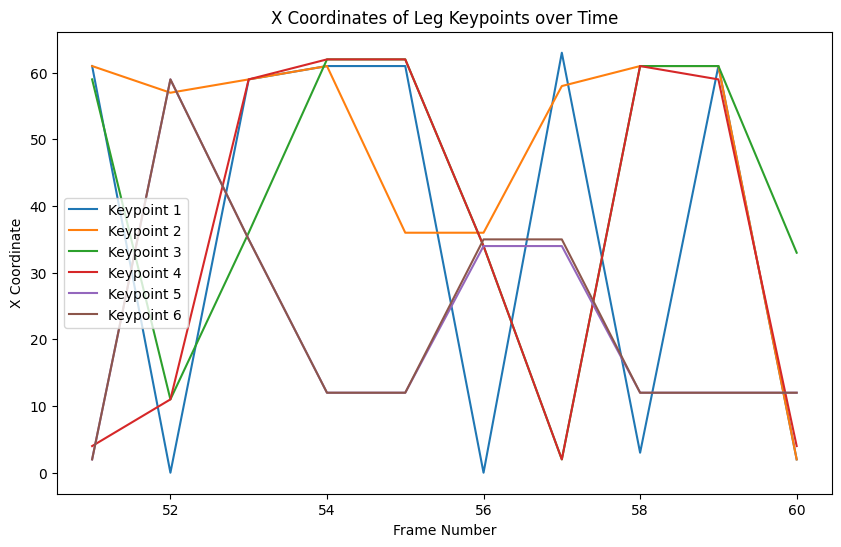

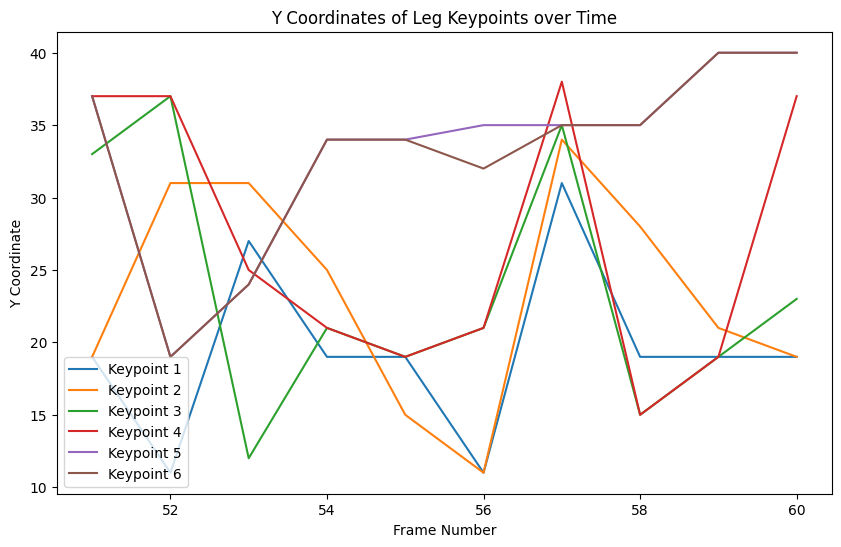

Leg keypoints for frame 61: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([62., 17.], dtype=float32), array([61., 15.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 62: [array([0., 8.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([61., 18.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 63: [array([61., 21.], dtype=float32), array([61., 21.], dtype=float32), array([61., 20.], dtype=float32), array([59., 22.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 64: [array([ 3., 15.], dtype=float32), array([61., 22.], dtype=float32), array([63., 19.], dtype=float32), array([34., 26.], dtype=float32), array([12., 35.], dtype=float32), array([12., 35.], dtype=float32)]
Leg keypoints for frame 65: [array([61., 19.], dtype=float32), array([

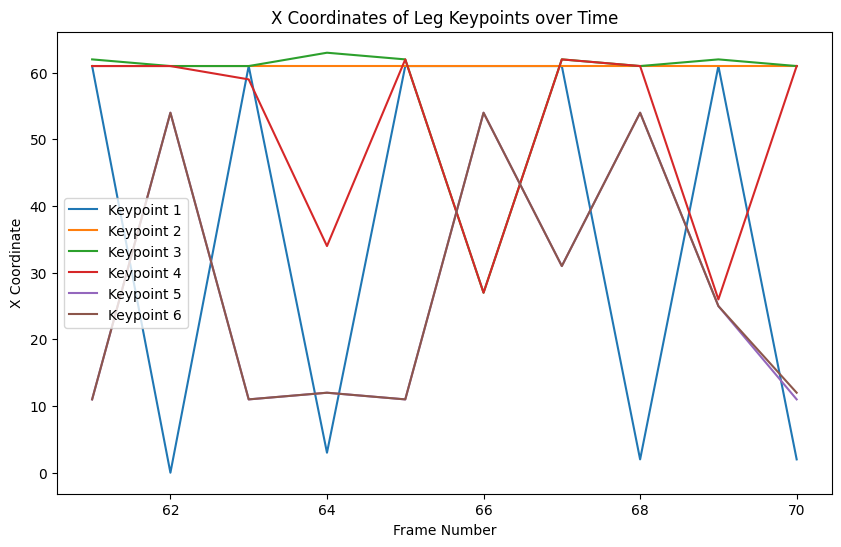

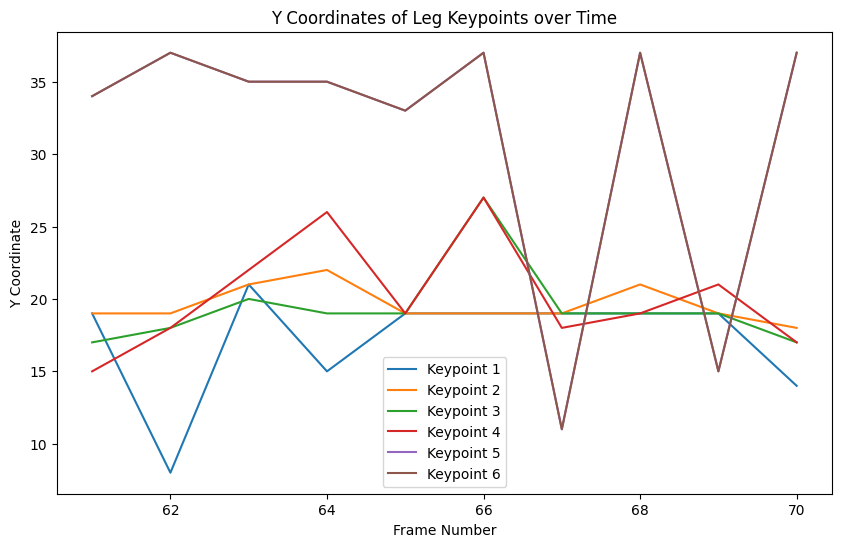

Leg keypoints for frame 71: [array([59., 31.], dtype=float32), array([59., 31.], dtype=float32), array([61., 15.], dtype=float32), array([10., 34.], dtype=float32), array([31., 17.], dtype=float32), array([61., 15.], dtype=float32)]
Leg keypoints for frame 72: [array([35., 15.], dtype=float32), array([36., 15.], dtype=float32), array([33., 23.], dtype=float32), array([33., 23.], dtype=float32), array([12., 37.], dtype=float32), array([35., 32.], dtype=float32)]
Leg keypoints for frame 73: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([27., 23.], dtype=float32), array([27., 23.], dtype=float32), array([11., 36.], dtype=float32), array([11., 36.], dtype=float32)]
Leg keypoints for frame 74: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32), array([12., 36.], dtype=float32), array([12., 36.], dtype=float32)]
Leg keypoints for frame 75: [array([ 0., 11.], dtype=float32), array

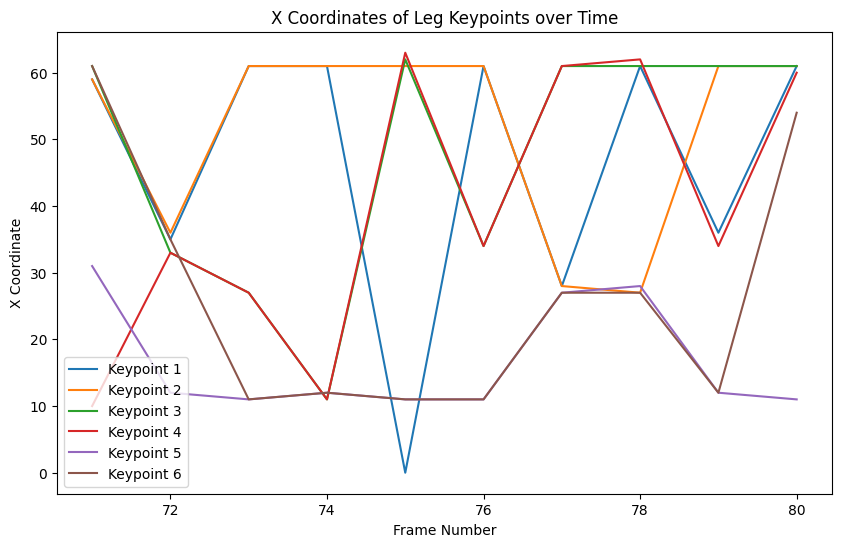

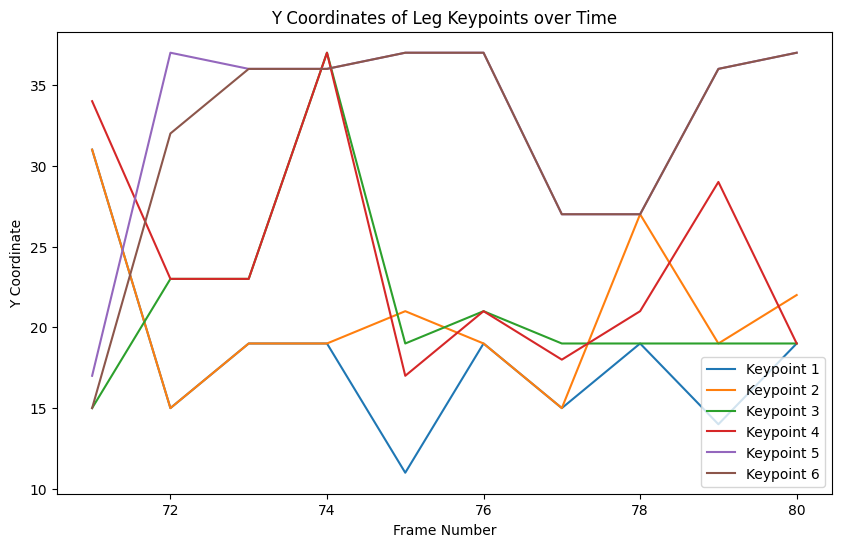

Leg keypoints for frame 81: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([34., 23.], dtype=float32), array([12., 37.], dtype=float32), array([61., 15.], dtype=float32)]
Leg keypoints for frame 82: [array([ 3., 19.], dtype=float32), array([36., 15.], dtype=float32), array([62., 21.], dtype=float32), array([ 2., 38.], dtype=float32), array([61., 15.], dtype=float32), array([61., 19.], dtype=float32)]
Leg keypoints for frame 83: [array([38., 11.], dtype=float32), array([38., 11.], dtype=float32), array([61., 16.], dtype=float32), array([61., 16.], dtype=float32), array([34., 26.], dtype=float32), array([33., 26.], dtype=float32)]
Leg keypoints for frame 84: [array([61., 19.], dtype=float32), array([61., 21.], dtype=float32), array([61., 19.], dtype=float32), array([57., 34.], dtype=float32), array([11., 37.], dtype=float32), array([12., 40.], dtype=float32)]
Leg keypoints for frame 85: [array([ 4., 17.], dtype=float32), array

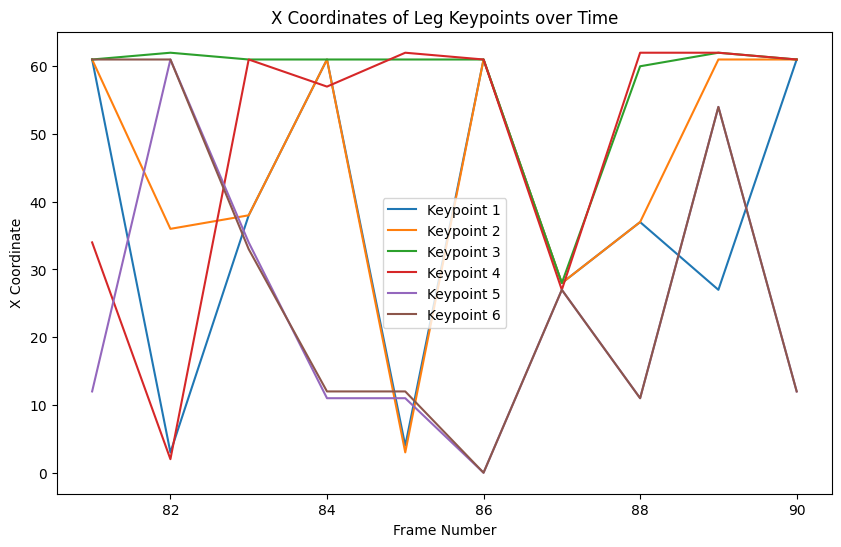

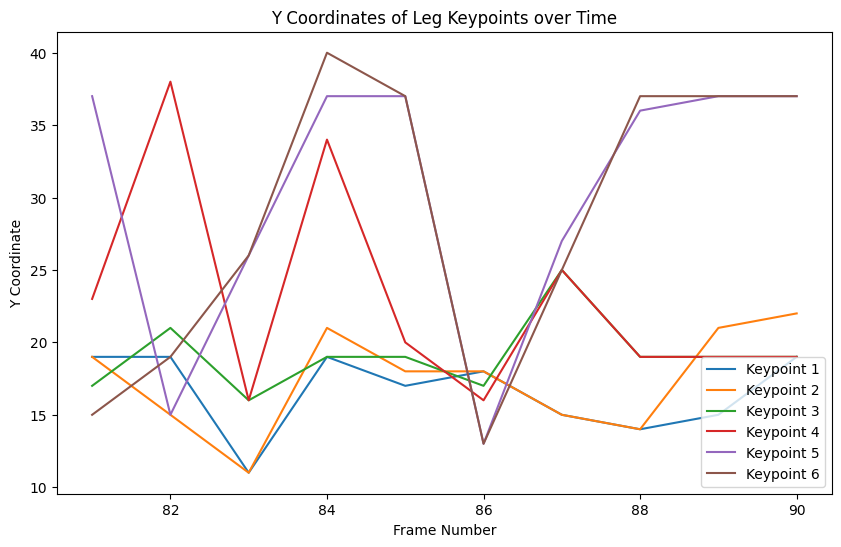

Leg keypoints for frame 91: [array([ 1., 14.], dtype=float32), array([60., 24.], dtype=float32), array([61., 19.], dtype=float32), array([61., 21.], dtype=float32), array([31., 15.], dtype=float32), array([31., 15.], dtype=float32)]
Leg keypoints for frame 92: [array([ 0., 11.], dtype=float32), array([60., 19.], dtype=float32), array([61., 19.], dtype=float32), array([33., 23.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 93: [array([30., 15.], dtype=float32), array([30., 15.], dtype=float32), array([61., 18.], dtype=float32), array([62., 18.], dtype=float32), array([11., 37.], dtype=float32), array([61., 15.], dtype=float32)]
Leg keypoints for frame 94: [array([61., 18.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([61., 16.], dtype=float32), array([12., 35.], dtype=float32), array([34., 32.], dtype=float32)]
Leg keypoints for frame 95: [array([61., 19.], dtype=float32), array

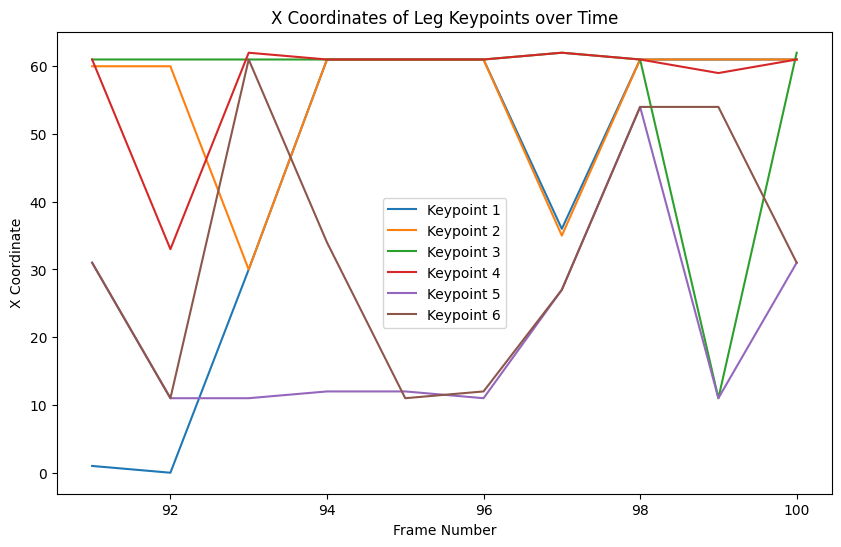

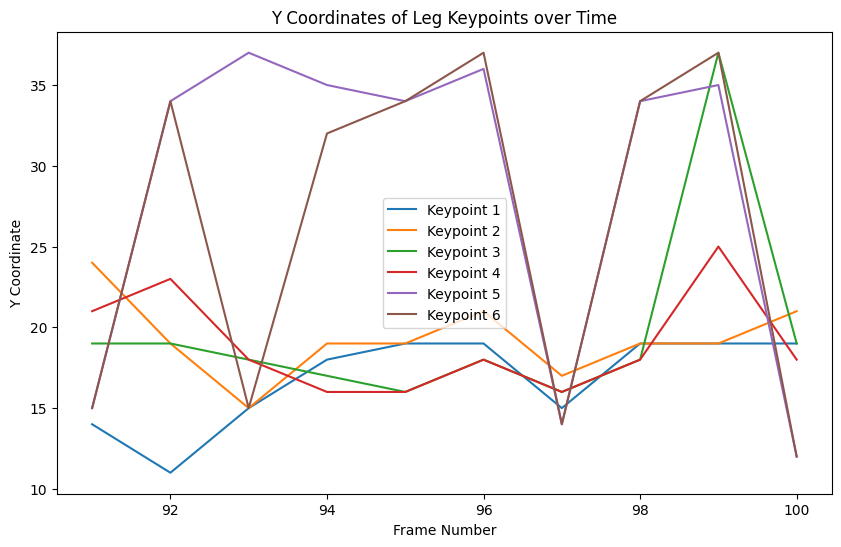

Leg keypoints for frame 101: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([61., 17.], dtype=float32), array([11., 33.], dtype=float32), array([13., 40.], dtype=float32)]
Leg keypoints for frame 102: [array([36., 15.], dtype=float32), array([36., 18.], dtype=float32), array([61., 16.], dtype=float32), array([34., 27.], dtype=float32), array([ 2., 34.], dtype=float32), array([ 2., 34.], dtype=float32)]
Leg keypoints for frame 103: [array([26., 24.], dtype=float32), array([59., 31.], dtype=float32), array([25., 18.], dtype=float32), array([26., 18.], dtype=float32), array([32., 14.], dtype=float32), array([32., 14.], dtype=float32)]
Leg keypoints for frame 104: [array([31., 14.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([31., 15.], dtype=float32), array([31., 15.], dtype=float32)]
Leg keypoints for frame 105: [array([61., 19.], dtype=float32), 

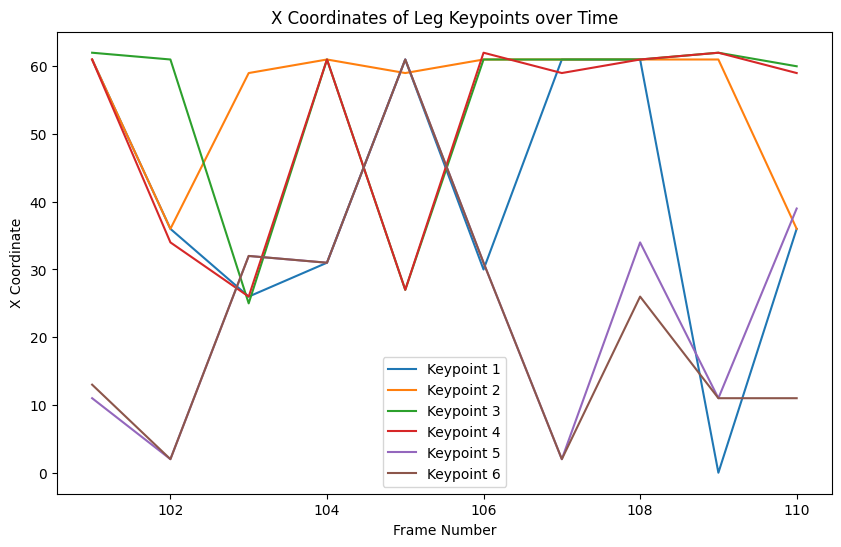

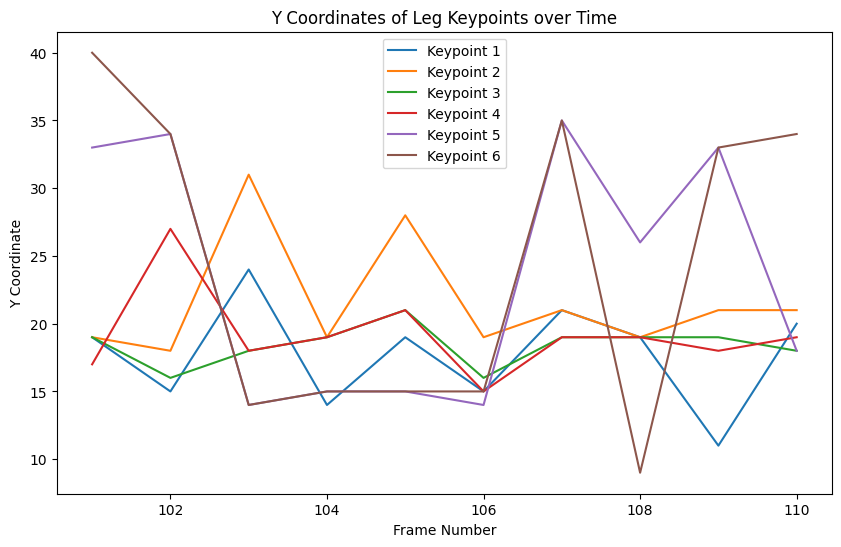

Leg keypoints for frame 111: [array([34., 20.], dtype=float32), array([35., 15.], dtype=float32), array([61., 19.], dtype=float32), array([62., 18.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 112: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([62., 16.], dtype=float32), array([63., 15.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 113: [array([61., 21.], dtype=float32), array([61., 21.], dtype=float32), array([30., 21.], dtype=float32), array([29., 23.], dtype=float32), array([30., 21.], dtype=float32), array([30., 21.], dtype=float32)]
Leg keypoints for frame 114: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 17.], dtype=float32), array([62., 18.], dtype=float32), array([11., 34.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 115: [array([ 0., 11.], dtype=float32), 

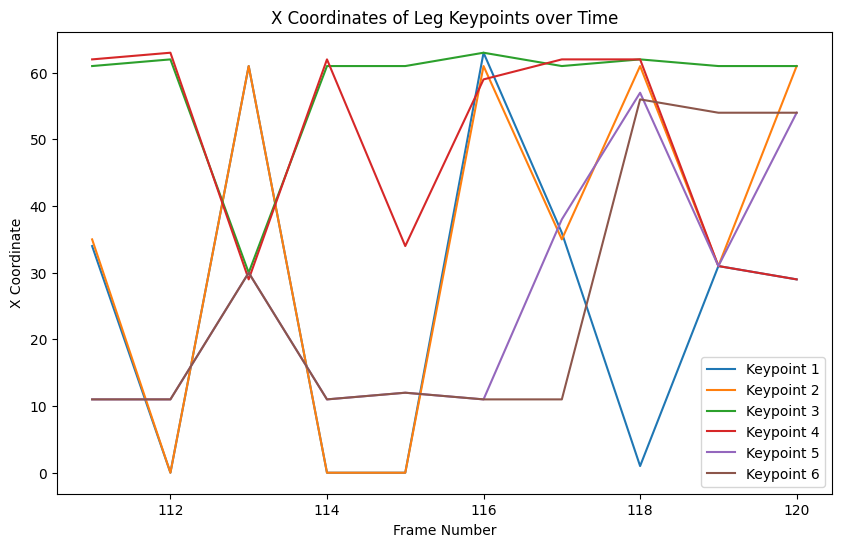

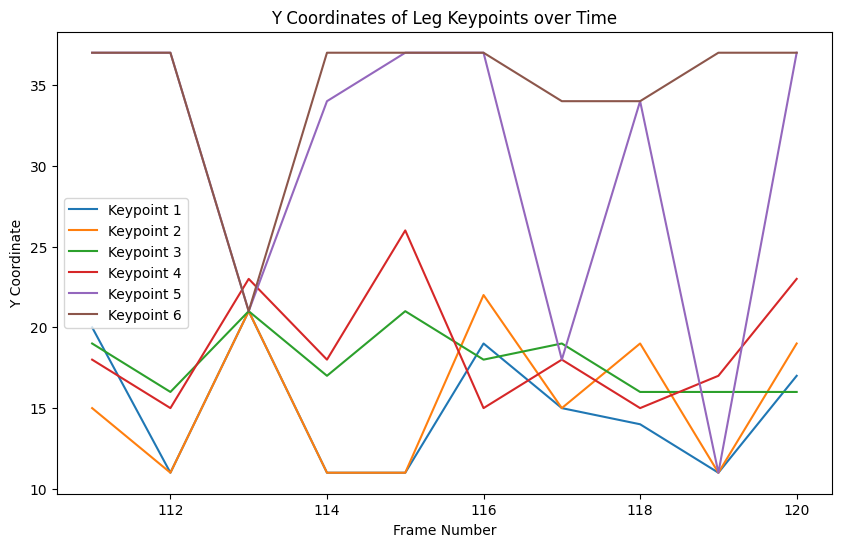

Leg keypoints for frame 121: [array([61., 16.], dtype=float32), array([61., 21.], dtype=float32), array([61., 16.], dtype=float32), array([61., 16.], dtype=float32), array([31., 14.], dtype=float32), array([31., 14.], dtype=float32)]
Leg keypoints for frame 122: [array([61., 19.], dtype=float32), array([61., 22.], dtype=float32), array([62., 21.], dtype=float32), array([59., 19.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 123: [array([61., 19.], dtype=float32), array([61., 25.], dtype=float32), array([62., 21.], dtype=float32), array([59., 21.], dtype=float32), array([ 2., 34.], dtype=float32), array([ 2., 34.], dtype=float32)]
Leg keypoints for frame 124: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([29., 18.], dtype=float32), array([29., 21.], dtype=float32), array([31., 14.], dtype=float32), array([31., 14.], dtype=float32)]
Leg keypoints for frame 125: [array([61., 19.], dtype=float32), 

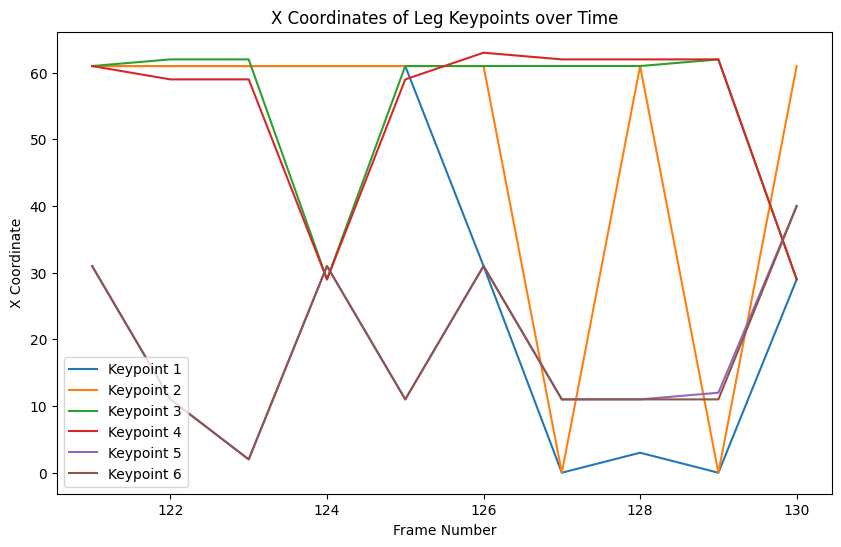

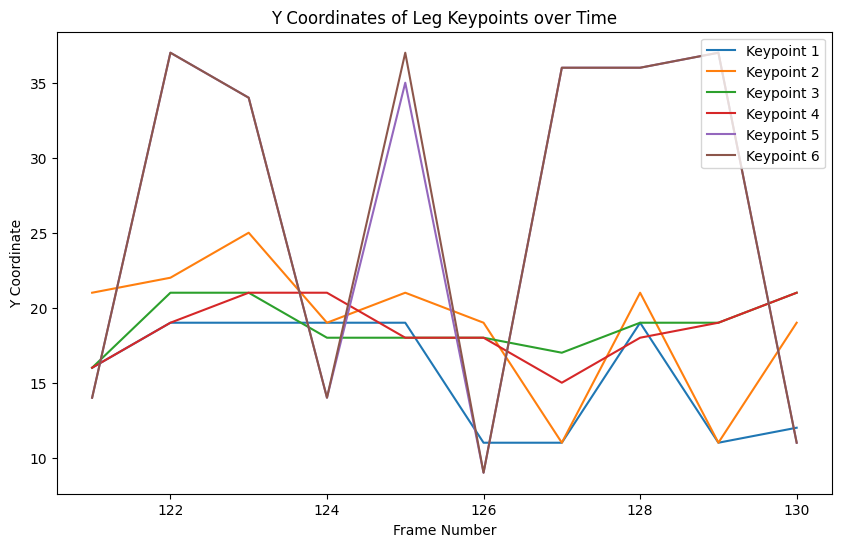

Leg keypoints for frame 131: [array([61., 18.], dtype=float32), array([61., 19.], dtype=float32), array([61., 16.], dtype=float32), array([29., 21.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 132: [array([33., 15.], dtype=float32), array([61., 21.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([31., 14.], dtype=float32), array([31., 15.], dtype=float32)]
Leg keypoints for frame 133: [array([62., 16.], dtype=float32), array([ 0., 32.], dtype=float32), array([61., 16.], dtype=float32), array([29., 21.], dtype=float32), array([61., 15.], dtype=float32), array([31., 21.], dtype=float32)]
Leg keypoints for frame 134: [array([36., 20.], dtype=float32), array([35., 14.], dtype=float32), array([61., 16.], dtype=float32), array([62., 16.], dtype=float32), array([38., 18.], dtype=float32), array([33., 14.], dtype=float32)]
Leg keypoints for frame 135: [array([ 0., 11.], dtype=float32), 

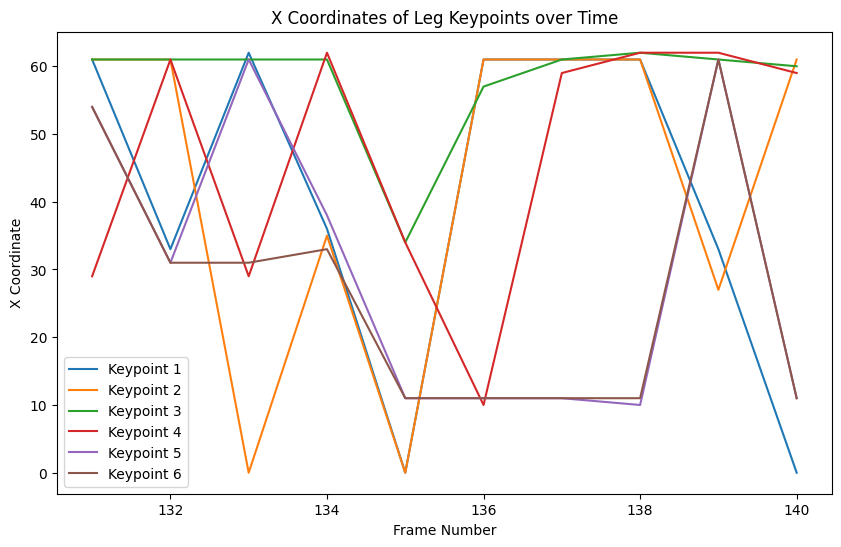

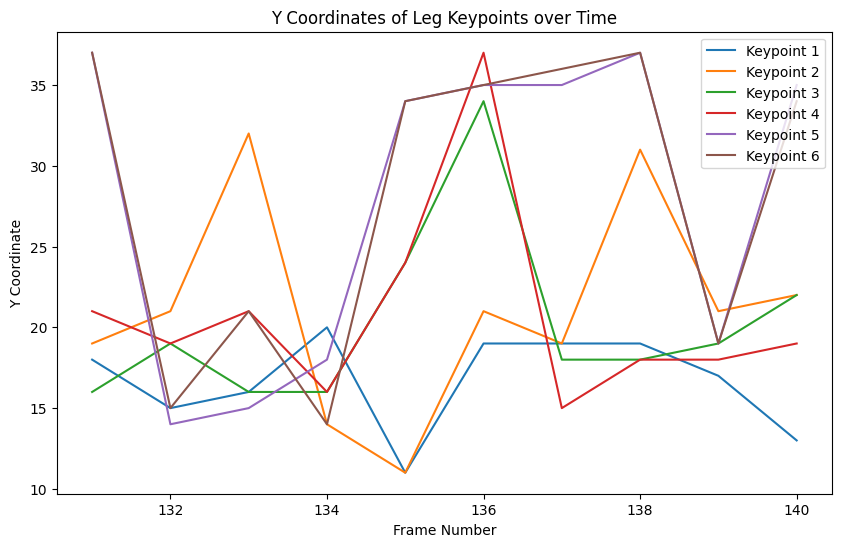

Leg keypoints for frame 141: [array([ 4., 19.], dtype=float32), array([ 2., 19.], dtype=float32), array([61., 19.], dtype=float32), array([62., 18.], dtype=float32), array([14., 40.], dtype=float32), array([13., 40.], dtype=float32)]
Leg keypoints for frame 142: [array([26., 21.], dtype=float32), array([26., 21.], dtype=float32), array([28., 29.], dtype=float32), array([28., 28.], dtype=float32), array([27., 27.], dtype=float32), array([24., 40.], dtype=float32)]
Leg keypoints for frame 143: [array([ 0., 11.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32)]
Leg keypoints for frame 144: [array([32., 14.], dtype=float32), array([51.,  4.], dtype=float32), array([61., 19.], dtype=float32), array([59., 19.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 145: [array([ 2., 19.], dtype=float32), 

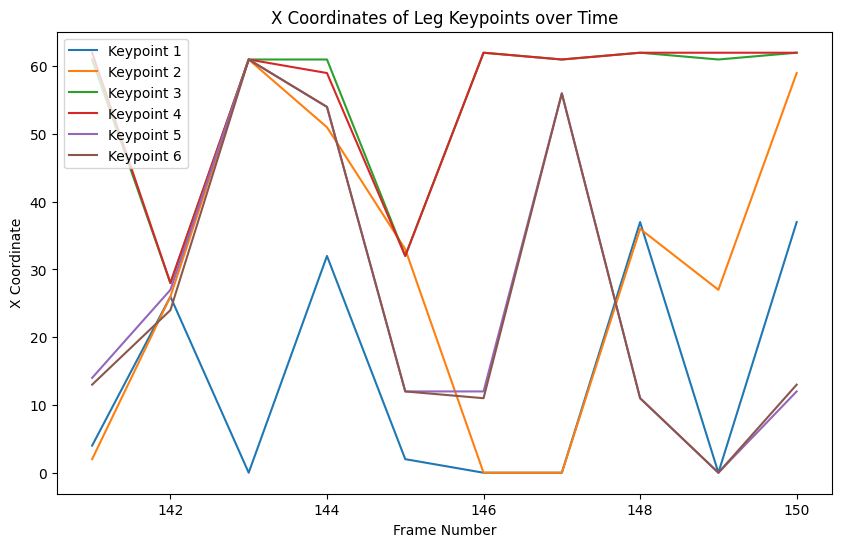

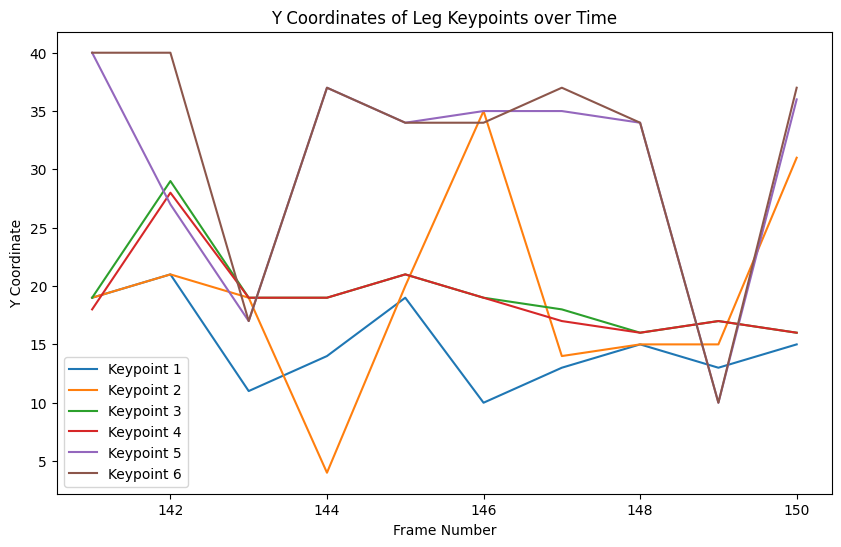

Leg keypoints for frame 151: [array([ 0., 13.], dtype=float32), array([ 0., 11.], dtype=float32), array([62., 18.], dtype=float32), array([62., 16.], dtype=float32), array([11., 34.], dtype=float32), array([11., 33.], dtype=float32)]
Leg keypoints for frame 152: [array([35., 17.], dtype=float32), array([36., 17.], dtype=float32), array([33., 23.], dtype=float32), array([34., 23.], dtype=float32), array([35., 35.], dtype=float32), array([35., 35.], dtype=float32)]
Leg keypoints for frame 153: [array([30., 15.], dtype=float32), array([28., 15.], dtype=float32), array([28., 27.], dtype=float32), array([27., 27.], dtype=float32), array([27., 27.], dtype=float32), array([27., 29.], dtype=float32)]
Leg keypoints for frame 154: [array([33., 15.], dtype=float32), array([33., 15.], dtype=float32), array([34., 23.], dtype=float32), array([34., 23.], dtype=float32), array([35., 35.], dtype=float32), array([35., 35.], dtype=float32)]
Leg keypoints for frame 155: [array([ 0., 11.], dtype=float32), 

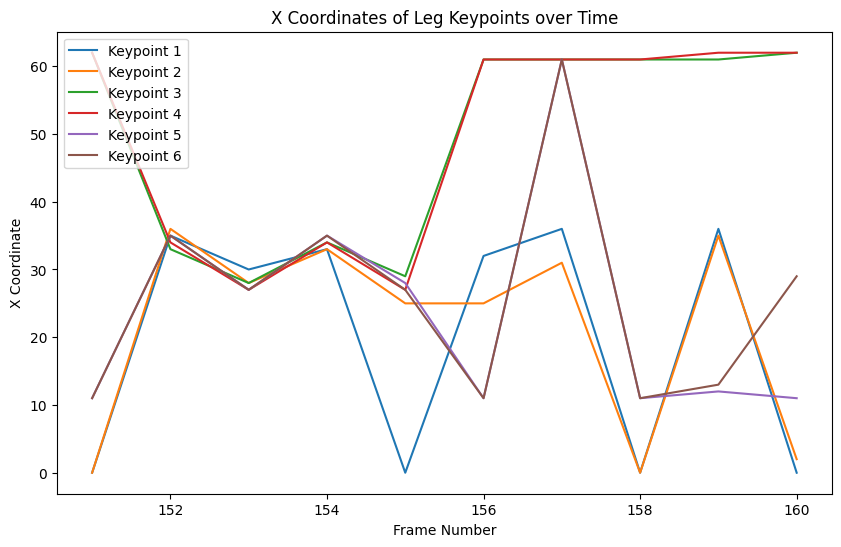

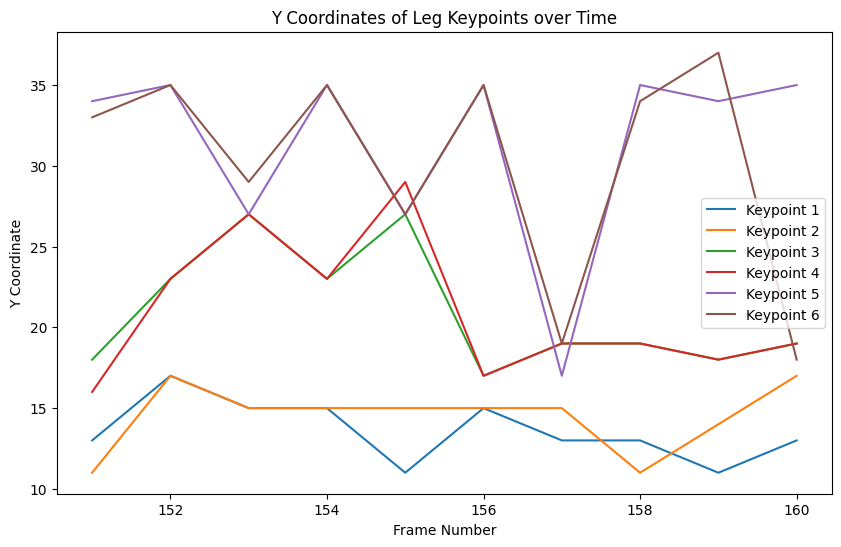

Leg keypoints for frame 161: [array([32., 18.], dtype=float32), array([28., 18.], dtype=float32), array([61., 16.], dtype=float32), array([61., 16.], dtype=float32), array([28., 28.], dtype=float32), array([27., 27.], dtype=float32)]
Leg keypoints for frame 162: [array([28., 20.], dtype=float32), array([26., 18.], dtype=float32), array([62., 19.], dtype=float32), array([26., 17.], dtype=float32), array([29., 27.], dtype=float32), array([29., 27.], dtype=float32)]
Leg keypoints for frame 163: [array([ 2., 19.], dtype=float32), array([ 3., 19.], dtype=float32), array([62., 19.], dtype=float32), array([61., 19.], dtype=float32), array([12., 34.], dtype=float32), array([ 0., 13.], dtype=float32)]
Leg keypoints for frame 164: [array([ 0., 11.], dtype=float32), array([ 0., 13.], dtype=float32), array([62., 19.], dtype=float32), array([27., 23.], dtype=float32), array([12., 34.], dtype=float32), array([12., 34.], dtype=float32)]
Leg keypoints for frame 165: [array([ 0., 10.], dtype=float32), 

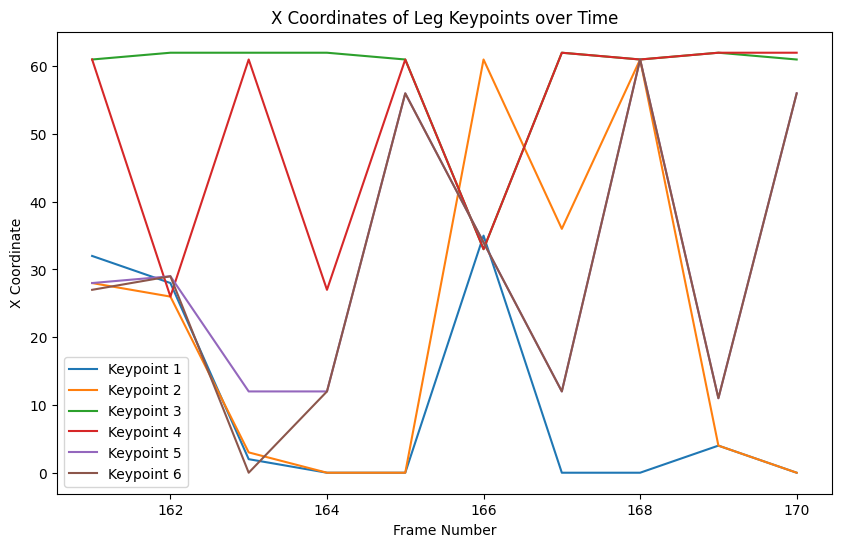

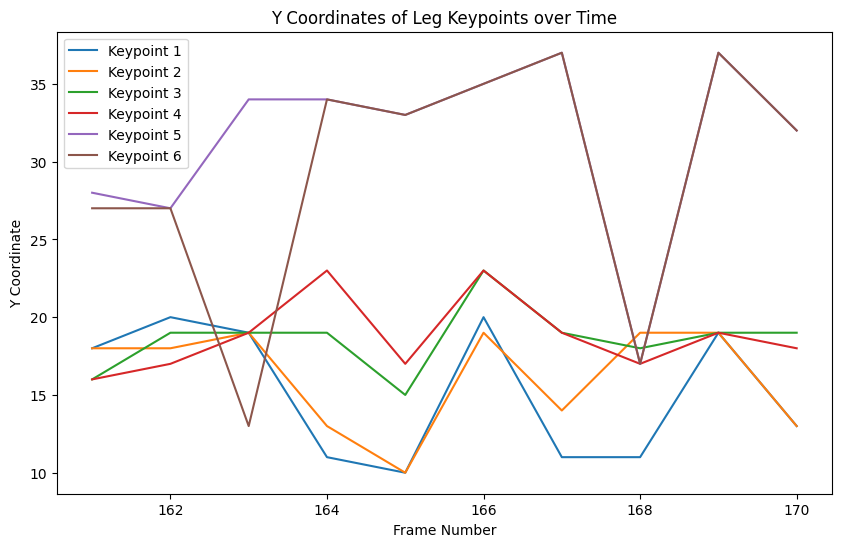

Leg keypoints for frame 171: [array([36., 11.], dtype=float32), array([ 0., 10.], dtype=float32), array([61., 16.], dtype=float32), array([26., 17.], dtype=float32), array([31., 24.], dtype=float32), array([31., 23.], dtype=float32)]
Leg keypoints for frame 172: [array([37.,  8.], dtype=float32), array([38.,  5.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 173: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 17.], dtype=float32), array([61., 16.], dtype=float32), array([55., 32.], dtype=float32), array([55., 32.], dtype=float32)]
Leg keypoints for frame 174: [array([ 2., 17.], dtype=float32), array([ 2., 17.], dtype=float32), array([62., 19.], dtype=float32), array([61., 18.], dtype=float32), array([13., 37.], dtype=float32), array([13., 37.], dtype=float32)]
Leg keypoints for frame 175: [array([ 0., 11.], dtype=float32), 

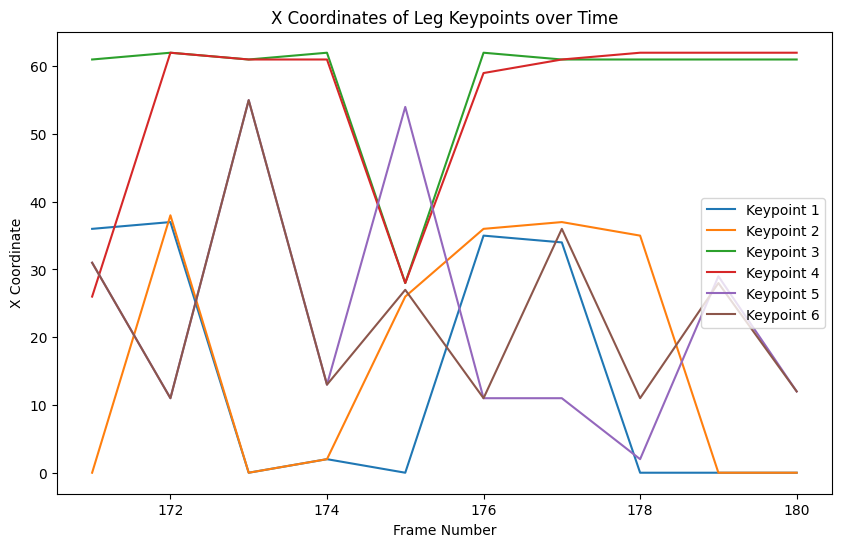

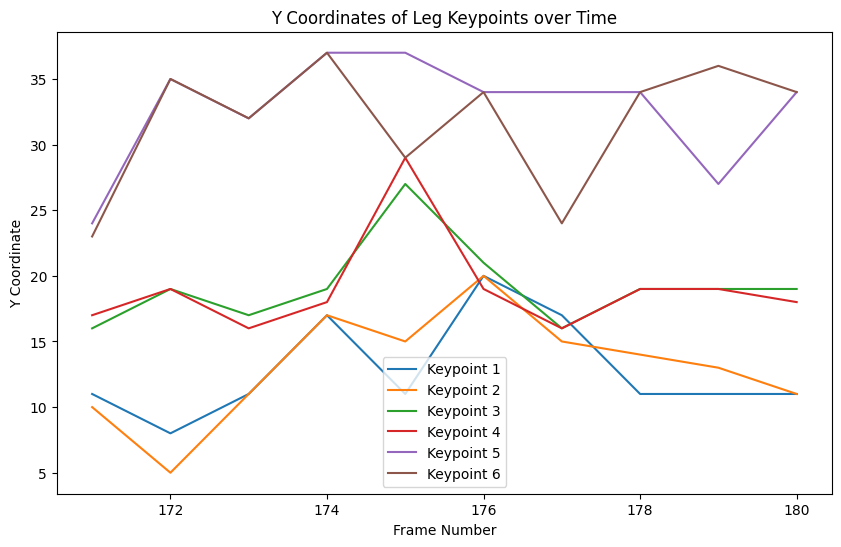

Leg keypoints for frame 181: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([61., 18.], dtype=float32), array([11., 35.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 182: [array([32., 14.], dtype=float32), array([28., 15.], dtype=float32), array([61., 16.], dtype=float32), array([62., 16.], dtype=float32), array([56., 34.], dtype=float32), array([54., 35.], dtype=float32)]
Leg keypoints for frame 183: [array([ 0., 11.], dtype=float32), array([27., 15.], dtype=float32), array([61., 17.], dtype=float32), array([59., 17.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 184: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([54., 34.], dtype=float32), array([54., 34.], dtype=float32)]
Leg keypoints for frame 185: [array([ 0., 11.], dtype=float32), 

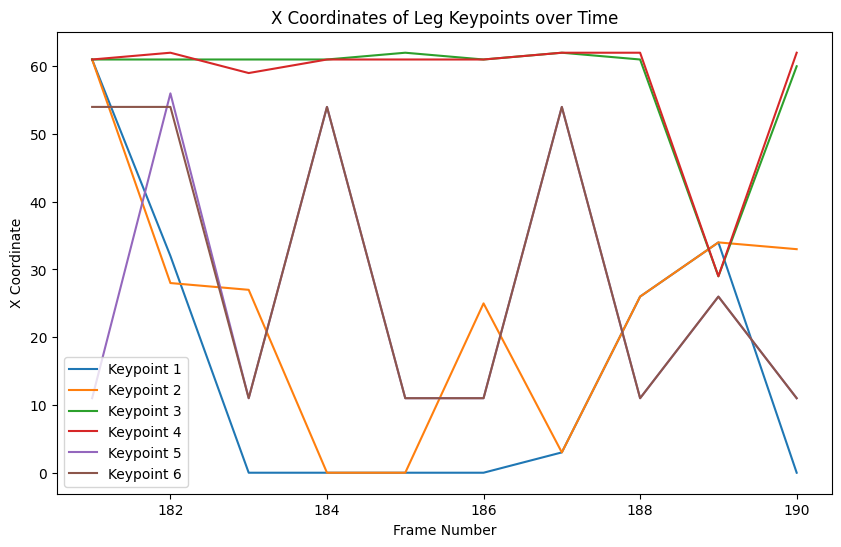

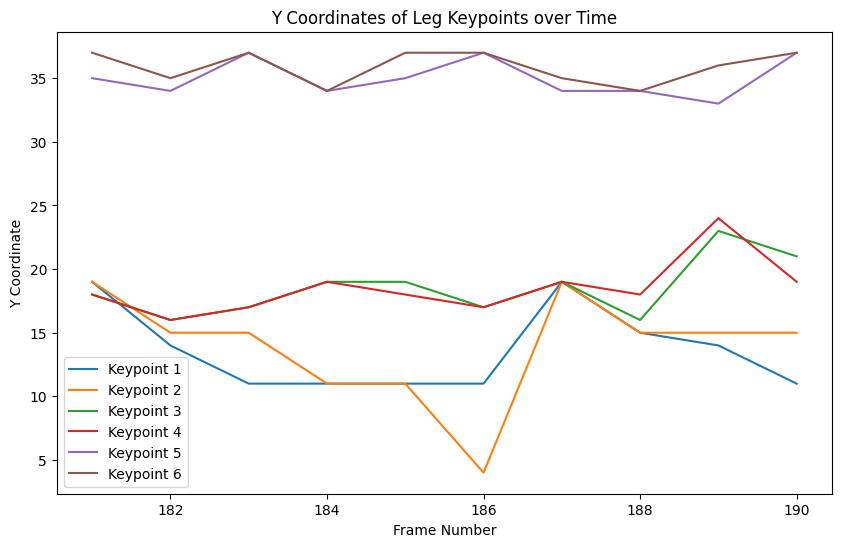

Leg keypoints for frame 191: [array([ 2., 17.], dtype=float32), array([ 0., 17.], dtype=float32), array([61., 16.], dtype=float32), array([61., 17.], dtype=float32), array([11., 35.], dtype=float32), array([12., 35.], dtype=float32)]
Leg keypoints for frame 192: [array([36., 11.], dtype=float32), array([31., 15.], dtype=float32), array([29., 23.], dtype=float32), array([29., 23.], dtype=float32), array([31., 20.], dtype=float32), array([29., 23.], dtype=float32)]
Leg keypoints for frame 193: [array([28., 15.], dtype=float32), array([26., 15.], dtype=float32), array([61., 19.], dtype=float32), array([29., 24.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 194: [array([32., 14.], dtype=float32), array([29., 11.], dtype=float32), array([62., 16.], dtype=float32), array([61., 16.], dtype=float32), array([61., 15.], dtype=float32), array([61., 15.], dtype=float32)]
Leg keypoints for frame 195: [array([36., 12.], dtype=float32), 

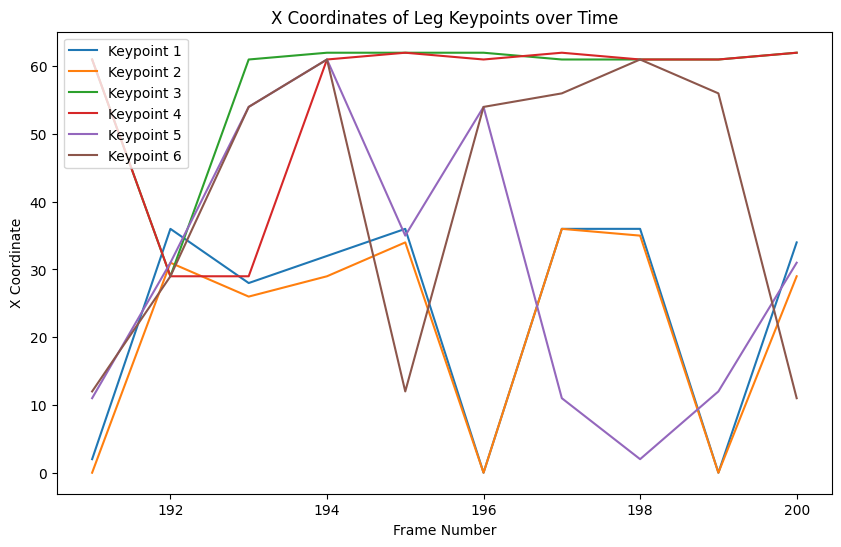

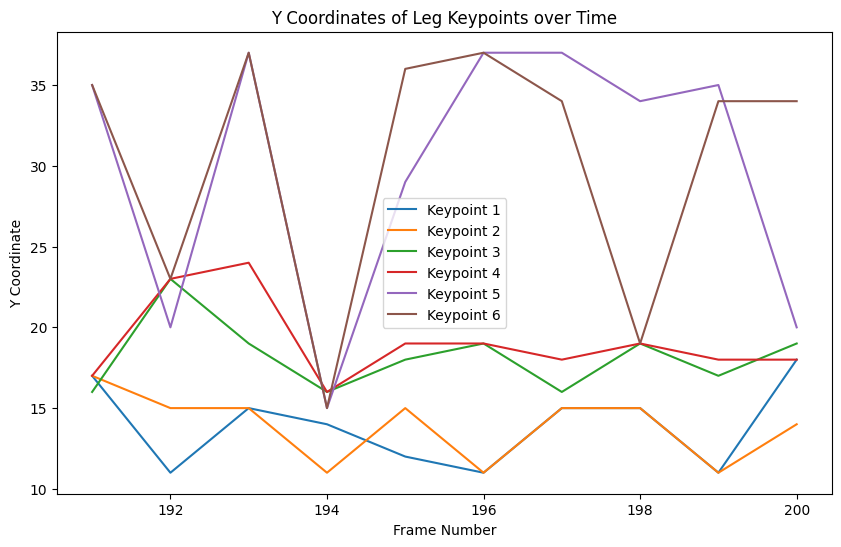

Leg keypoints for frame 201: [array([36., 12.], dtype=float32), array([29., 15.], dtype=float32), array([62., 21.], dtype=float32), array([62., 21.], dtype=float32), array([31., 21.], dtype=float32), array([31., 21.], dtype=float32)]
Leg keypoints for frame 202: [array([38.,  5.], dtype=float32), array([ 0., 34.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 203: [array([ 0., 11.], dtype=float32), array([34., 15.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 204: [array([28., 15.], dtype=float32), array([26., 15.], dtype=float32), array([29., 23.], dtype=float32), array([29., 24.], dtype=float32), array([29., 24.], dtype=float32), array([33., 15.], dtype=float32)]
Leg keypoints for frame 205: [array([ 0., 13.], dtype=float32), 

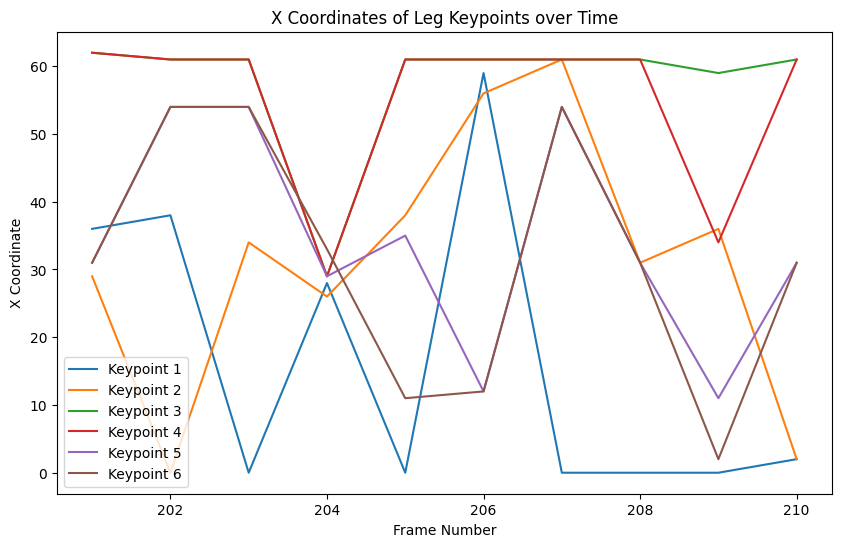

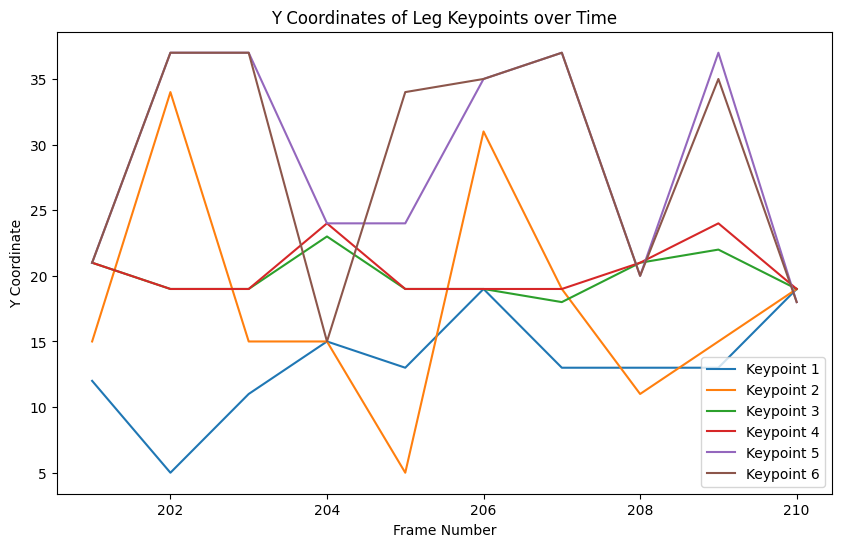

Leg keypoints for frame 211: [array([ 0., 35.], dtype=float32), array([30., 21.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([ 0., 35.], dtype=float32), array([ 0., 35.], dtype=float32)]
Leg keypoints for frame 212: [array([ 0., 13.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([11., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 213: [array([ 0., 10.], dtype=float32), array([33., 15.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([11., 35.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 214: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([29., 27.], dtype=float32), array([29., 26.], dtype=float32), array([12., 34.], dtype=float32), array([12., 34.], dtype=float32)]
Leg keypoints for frame 215: [array([ 3., 17.], dtype=float32), 

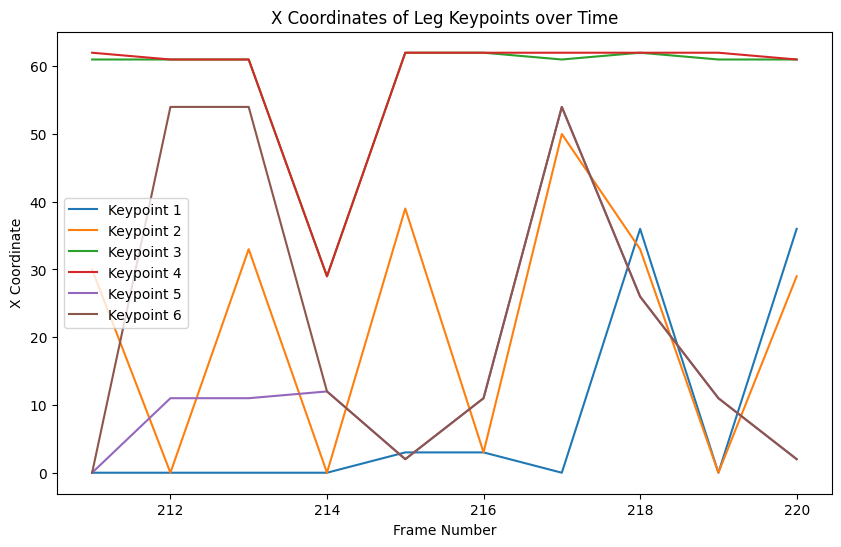

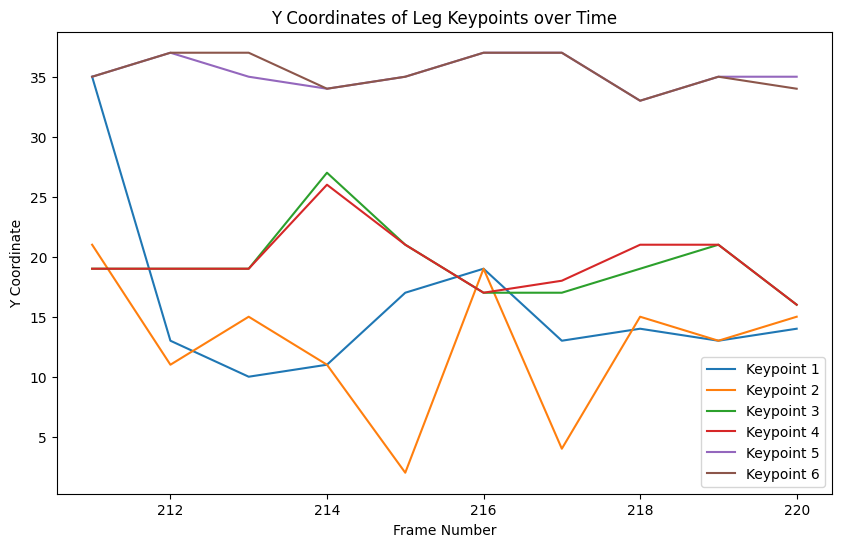

Leg keypoints for frame 221: [array([36.,  8.], dtype=float32), array([36.,  9.], dtype=float32), array([61., 19.], dtype=float32), array([29., 23.], dtype=float32), array([12., 34.], dtype=float32), array([12., 34.], dtype=float32)]
Leg keypoints for frame 222: [array([29., 15.], dtype=float32), array([28., 13.], dtype=float32), array([61., 17.], dtype=float32), array([62., 17.], dtype=float32), array([63., 17.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 223: [array([36., 14.], dtype=float32), array([33., 15.], dtype=float32), array([61., 21.], dtype=float32), array([62., 21.], dtype=float32), array([12., 34.], dtype=float32), array([12., 34.], dtype=float32)]
Leg keypoints for frame 224: [array([ 0., 11.], dtype=float32), array([25.,  0.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([35., 26.], dtype=float32), array([31., 20.], dtype=float32)]
Leg keypoints for frame 225: [array([ 0., 13.], dtype=float32), 

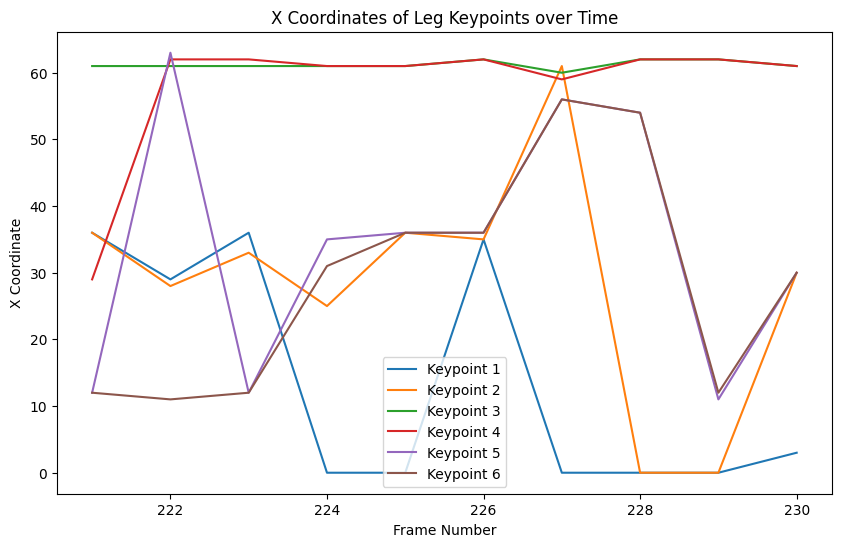

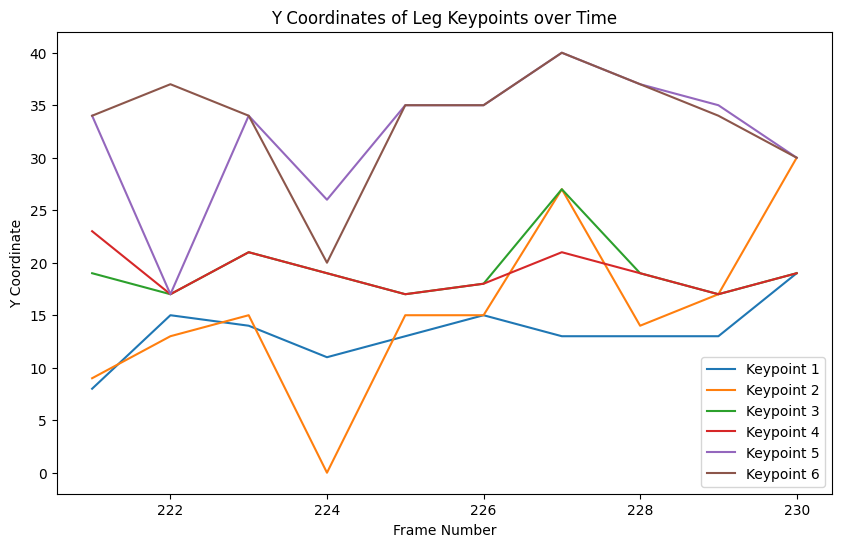

Leg keypoints for frame 231: [array([ 0., 13.], dtype=float32), array([ 0., 35.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([11., 35.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 232: [array([36., 12.], dtype=float32), array([35., 12.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([35., 23.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 233: [array([ 0., 13.], dtype=float32), array([27., 11.], dtype=float32), array([61., 17.], dtype=float32), array([62., 17.], dtype=float32), array([25., 12.], dtype=float32), array([30., 27.], dtype=float32)]
Leg keypoints for frame 234: [array([38., 12.], dtype=float32), array([35., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([11., 34.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 235: [array([ 3., 19.], dtype=float32), 

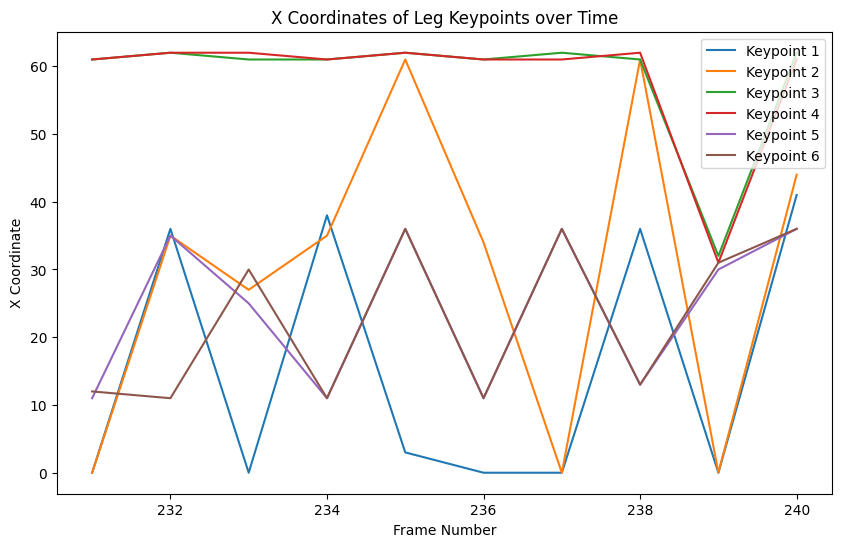

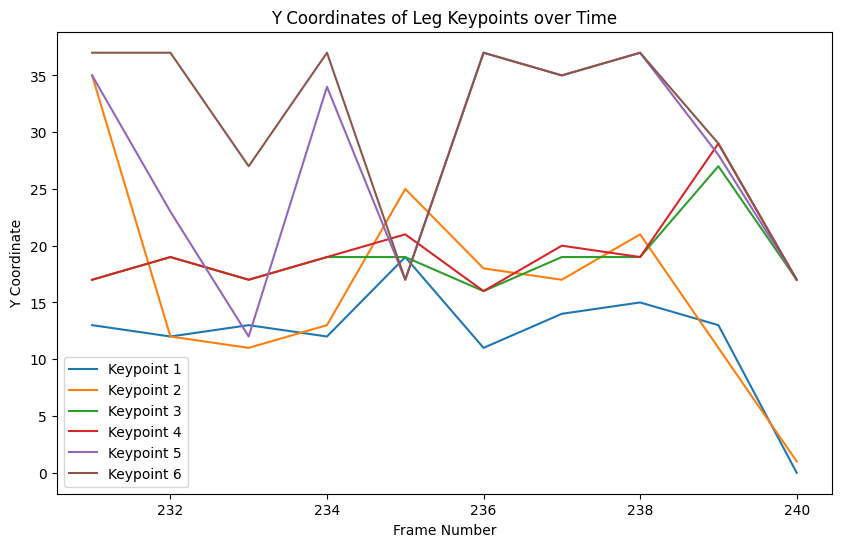

Leg keypoints for frame 241: [array([40.,  2.], dtype=float32), array([25.,  5.], dtype=float32), array([61., 17.], dtype=float32), array([27., 21.], dtype=float32), array([30., 24.], dtype=float32), array([28., 33.], dtype=float32)]
Leg keypoints for frame 242: [array([40.,  2.], dtype=float32), array([39.,  4.], dtype=float32), array([61., 16.], dtype=float32), array([62., 16.], dtype=float32), array([36., 21.], dtype=float32), array([34., 22.], dtype=float32)]
Leg keypoints for frame 243: [array([ 0., 13.], dtype=float32), array([ 0., 11.], dtype=float32), array([62., 16.], dtype=float32), array([62., 16.], dtype=float32), array([56., 34.], dtype=float32), array([56., 34.], dtype=float32)]
Leg keypoints for frame 244: [array([36., 12.], dtype=float32), array([27., 11.], dtype=float32), array([62., 18.], dtype=float32), array([62., 18.], dtype=float32), array([29., 28.], dtype=float32), array([29., 28.], dtype=float32)]
Leg keypoints for frame 245: [array([ 0., 13.], dtype=float32), 

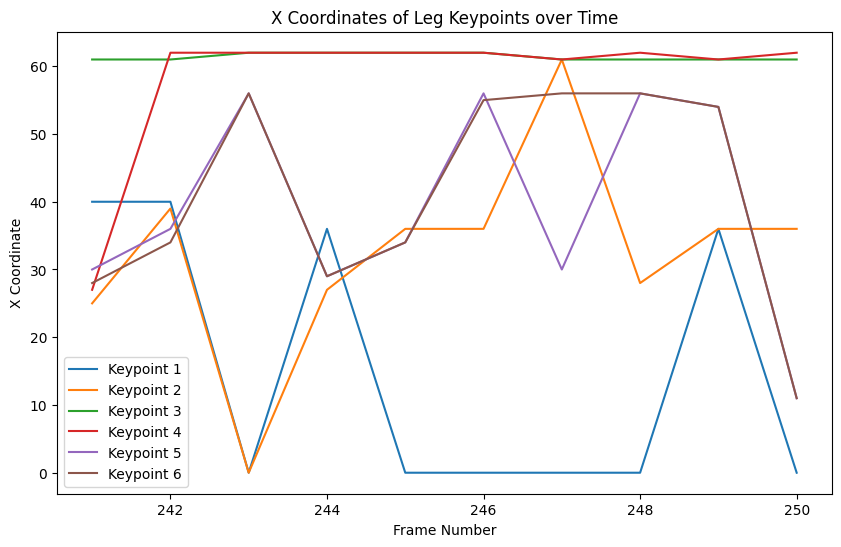

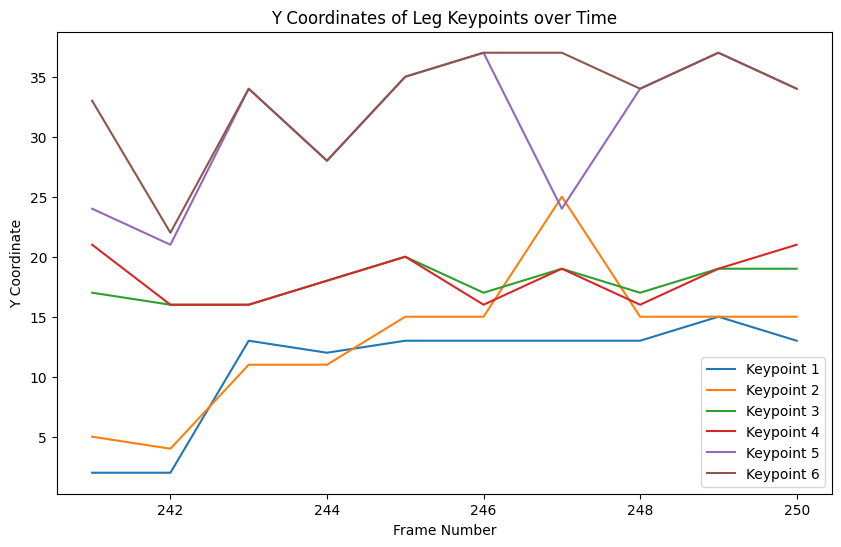

Leg keypoints for frame 251: [array([ 2., 17.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([62., 18.], dtype=float32), array([30., 28.], dtype=float32), array([30., 28.], dtype=float32)]
Leg keypoints for frame 252: [array([38., 14.], dtype=float32), array([36., 15.], dtype=float32), array([62., 21.], dtype=float32), array([62., 22.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 253: [array([ 0., 13.], dtype=float32), array([ 0., 17.], dtype=float32), array([62., 18.], dtype=float32), array([62., 17.], dtype=float32), array([56., 37.], dtype=float32), array([56., 37.], dtype=float32)]
Leg keypoints for frame 254: [array([ 0., 13.], dtype=float32), array([ 0., 17.], dtype=float32), array([61., 21.], dtype=float32), array([61., 21.], dtype=float32), array([11., 35.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 255: [array([ 0., 13.], dtype=float32), 

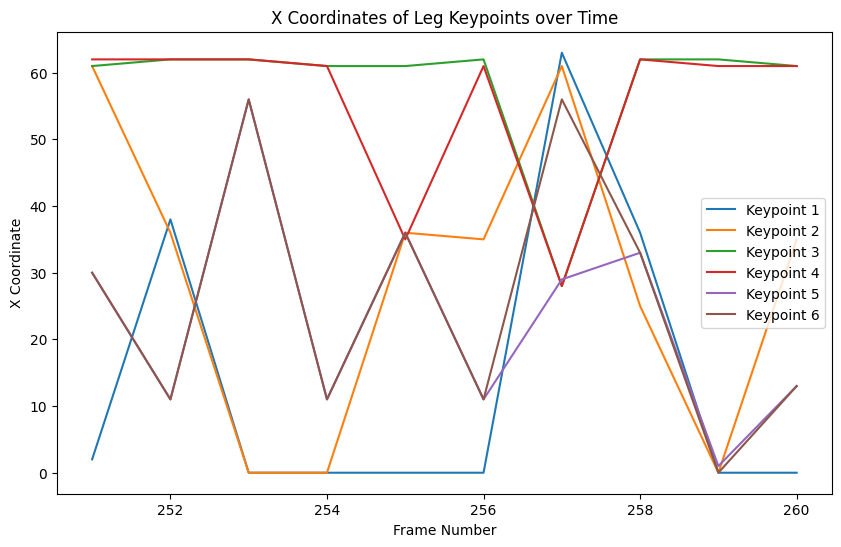

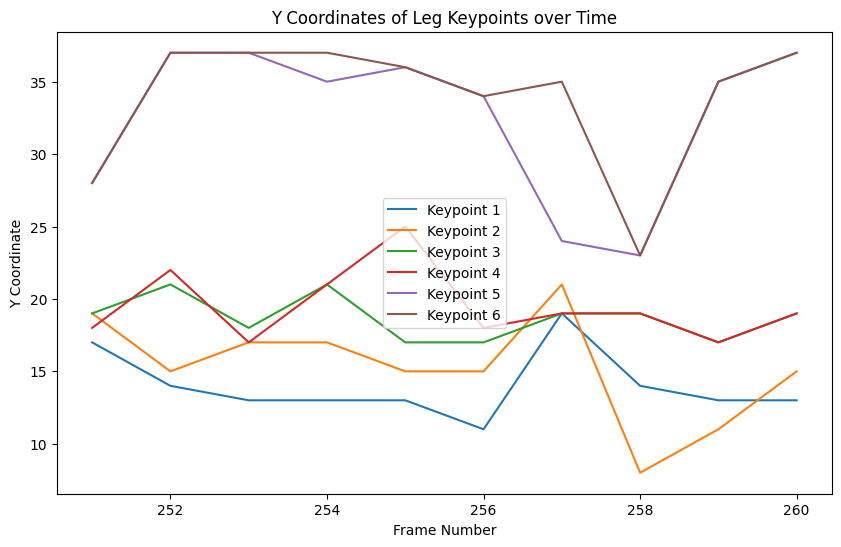

Leg keypoints for frame 261: [array([ 0., 11.], dtype=float32), array([ 0., 14.], dtype=float32), array([62., 17.], dtype=float32), array([62., 20.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 262: [array([60., 31.], dtype=float32), array([61., 31.], dtype=float32), array([31., 27.], dtype=float32), array([30., 27.], dtype=float32), array([11., 34.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 263: [array([ 0., 13.], dtype=float32), array([ 0., 11.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([36., 20.], dtype=float32), array([35., 20.], dtype=float32)]
Leg keypoints for frame 264: [array([36., 12.], dtype=float32), array([36., 13.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([ 2., 35.], dtype=float32), array([ 2., 35.], dtype=float32)]
Leg keypoints for frame 265: [array([ 0., 13.], dtype=float32), 

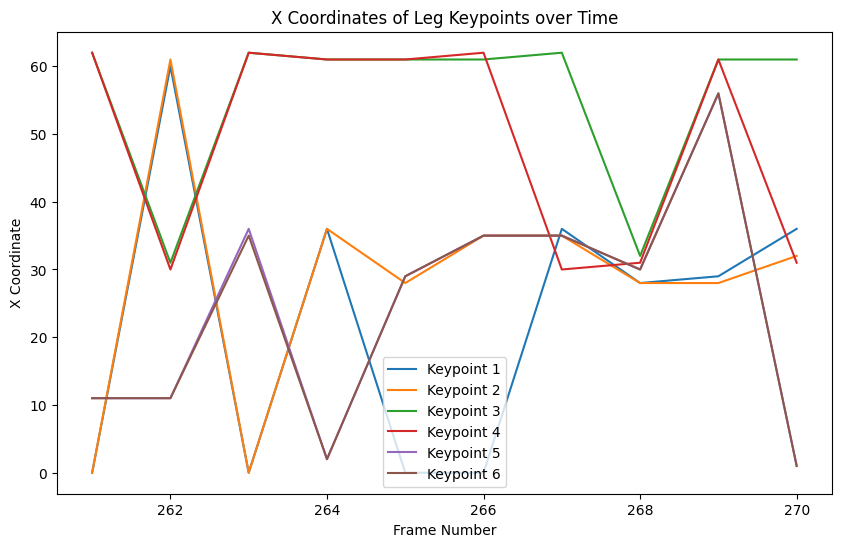

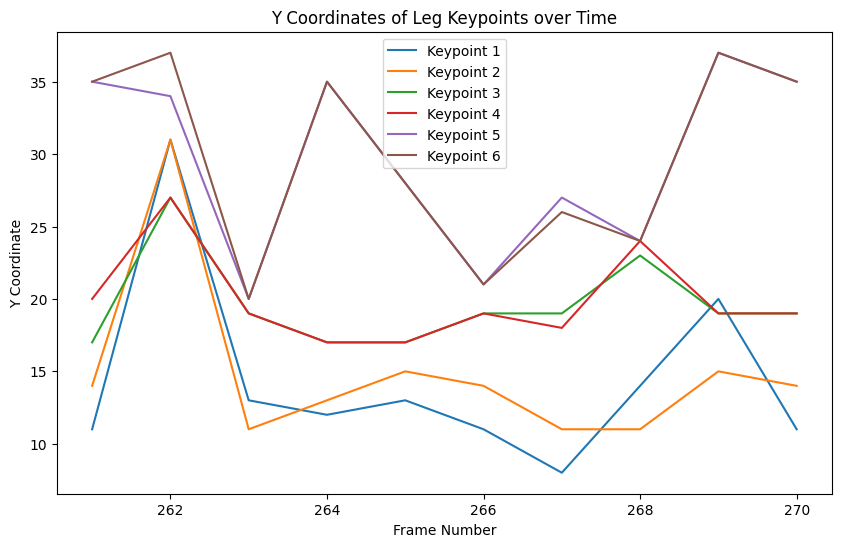

Leg keypoints for frame 271: [array([ 0., 14.], dtype=float32), array([ 0., 17.], dtype=float32), array([62., 19.], dtype=float32), array([61., 21.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 272: [array([ 0., 13.], dtype=float32), array([ 0., 15.], dtype=float32), array([61., 18.], dtype=float32), array([61., 20.], dtype=float32), array([31., 24.], dtype=float32), array([31., 24.], dtype=float32)]
Leg keypoints for frame 273: [array([ 0., 11.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([62., 16.], dtype=float32), array([12., 37.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 274: [array([37., 11.], dtype=float32), array([29., 11.], dtype=float32), array([37., 26.], dtype=float32), array([30., 23.], dtype=float32), array([37., 36.], dtype=float32), array([36., 37.], dtype=float32)]
Leg keypoints for frame 275: [array([ 3., 19.], dtype=float32), 

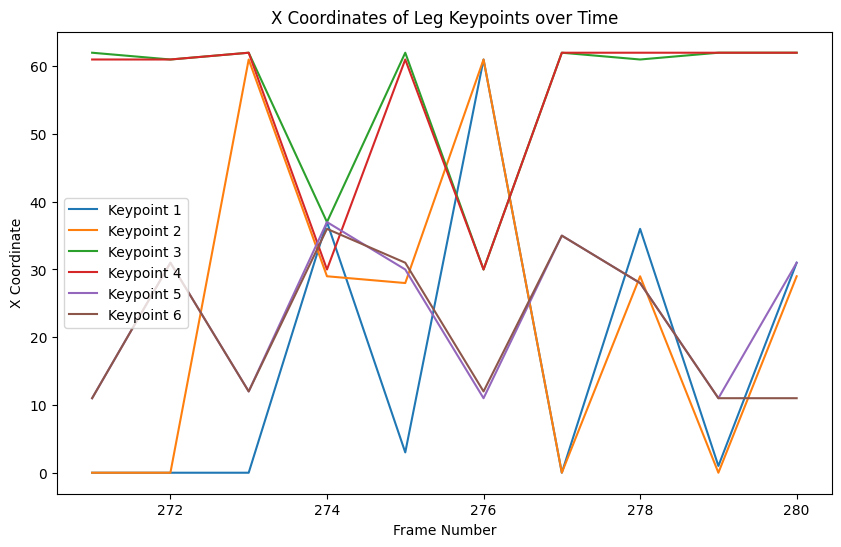

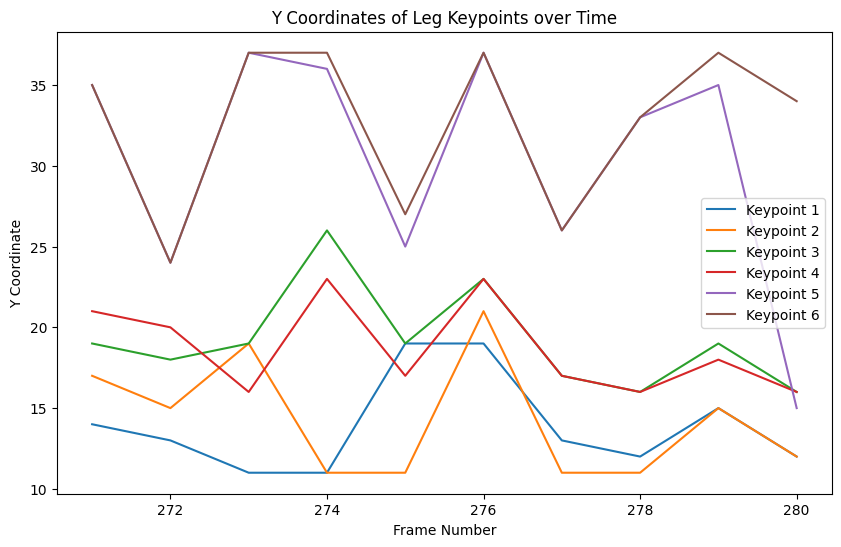

Leg keypoints for frame 281: [array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([34., 33.], dtype=float32), array([34., 32.], dtype=float32)]
Leg keypoints for frame 282: [array([ 0., 13.], dtype=float32), array([28., 10.], dtype=float32), array([61., 17.], dtype=float32), array([62., 20.], dtype=float32), array([52., 37.], dtype=float32), array([52., 37.], dtype=float32)]
Leg keypoints for frame 283: [array([36.,  8.], dtype=float32), array([28.,  5.], dtype=float32), array([63., 16.], dtype=float32), array([61., 18.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 284: [array([ 0., 13.], dtype=float32), array([61., 20.], dtype=float32), array([62., 17.], dtype=float32), array([61., 15.], dtype=float32), array([30., 25.], dtype=float32), array([30., 23.], dtype=float32)]
Leg keypoints for frame 285: [array([36., 12.], dtype=float32), 

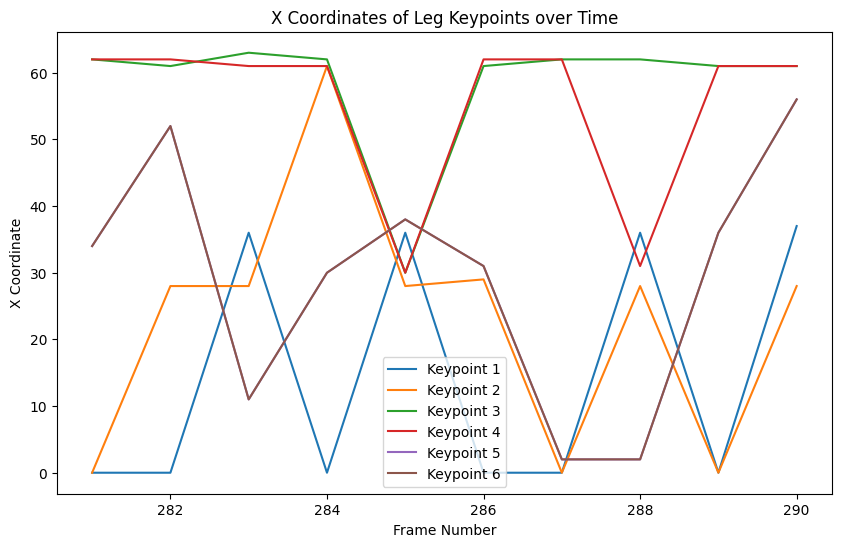

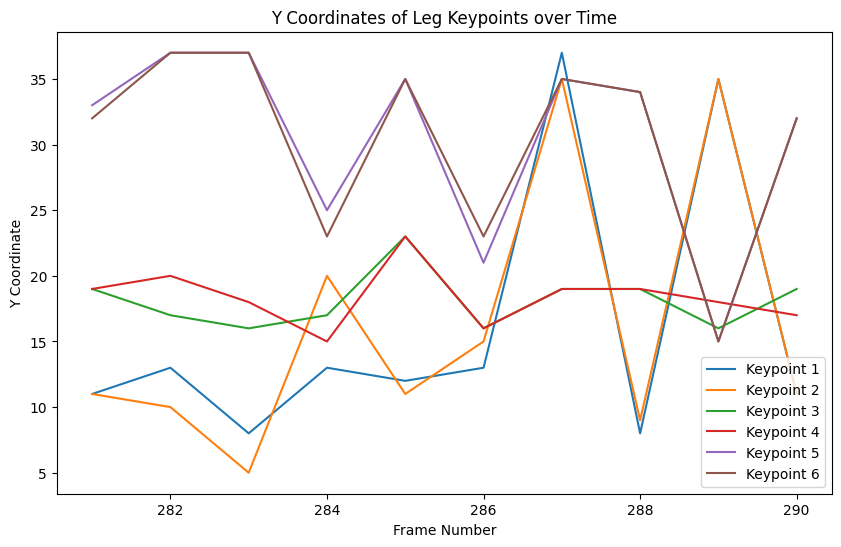

Leg keypoints for frame 291: [array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([31., 23.], dtype=float32), array([31., 24.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 292: [array([36., 14.], dtype=float32), array([29., 11.], dtype=float32), array([61., 18.], dtype=float32), array([30., 22.], dtype=float32), array([52., 37.], dtype=float32), array([52., 37.], dtype=float32)]
Leg keypoints for frame 293: [array([ 0., 13.], dtype=float32), array([ 0., 15.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 294: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([30., 23.], dtype=float32), array([30., 23.], dtype=float32), array([30., 27.], dtype=float32), array([30., 27.], dtype=float32)]
Leg keypoints for frame 295: [array([28., 15.], dtype=float32), 

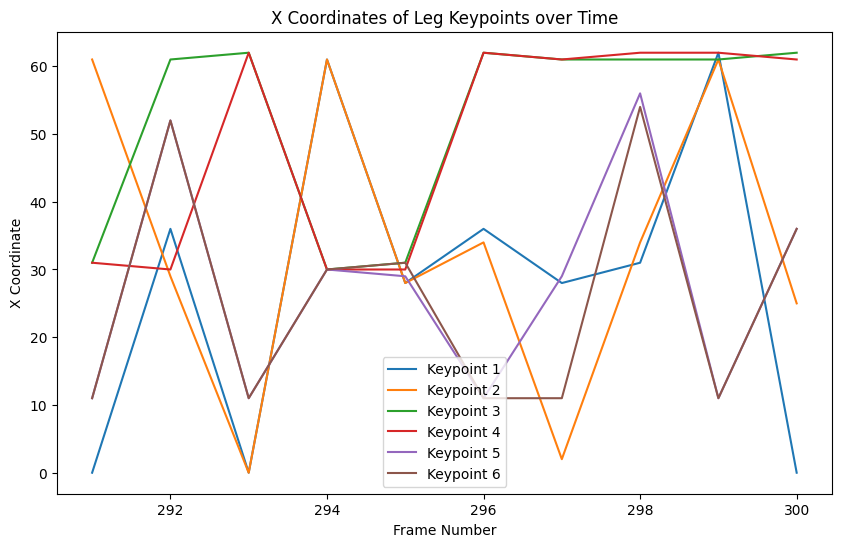

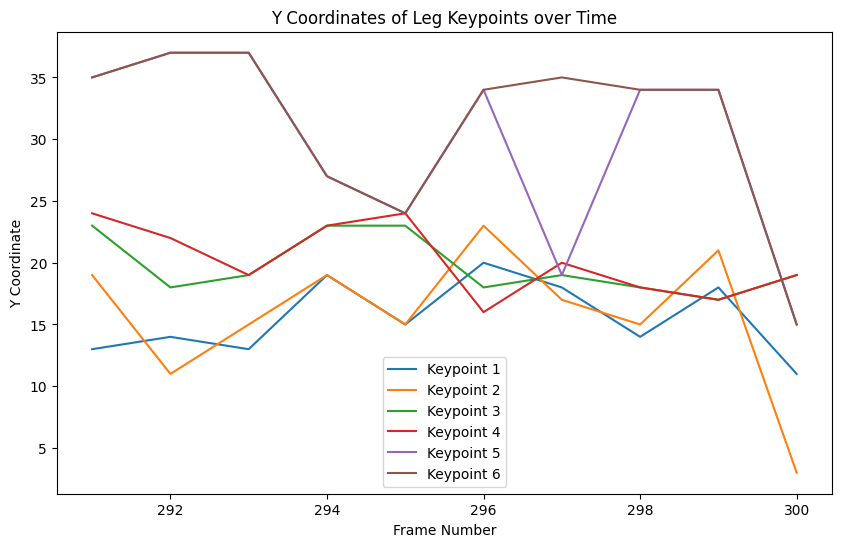

Leg keypoints for frame 301: [array([36., 13.], dtype=float32), array([35., 15.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([11., 35.], dtype=float32), array([11., 36.], dtype=float32)]
Leg keypoints for frame 302: [array([36.,  9.], dtype=float32), array([36.,  9.], dtype=float32), array([61., 21.], dtype=float32), array([61., 21.], dtype=float32), array([35., 26.], dtype=float32), array([35., 26.], dtype=float32)]
Leg keypoints for frame 303: [array([37., 12.], dtype=float32), array([28., 11.], dtype=float32), array([61., 17.], dtype=float32), array([30., 23.], dtype=float32), array([31., 21.], dtype=float32), array([31., 21.], dtype=float32)]
Leg keypoints for frame 304: [array([36., 12.], dtype=float32), array([28., 13.], dtype=float32), array([61., 17.], dtype=float32), array([62., 17.], dtype=float32), array([31., 24.], dtype=float32), array([31., 24.], dtype=float32)]
Leg keypoints for frame 305: [array([ 2., 19.], dtype=float32), 

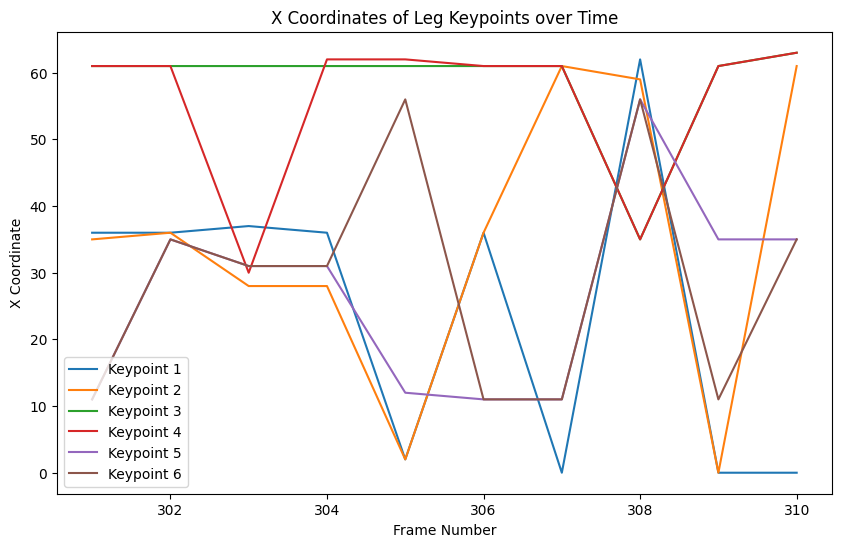

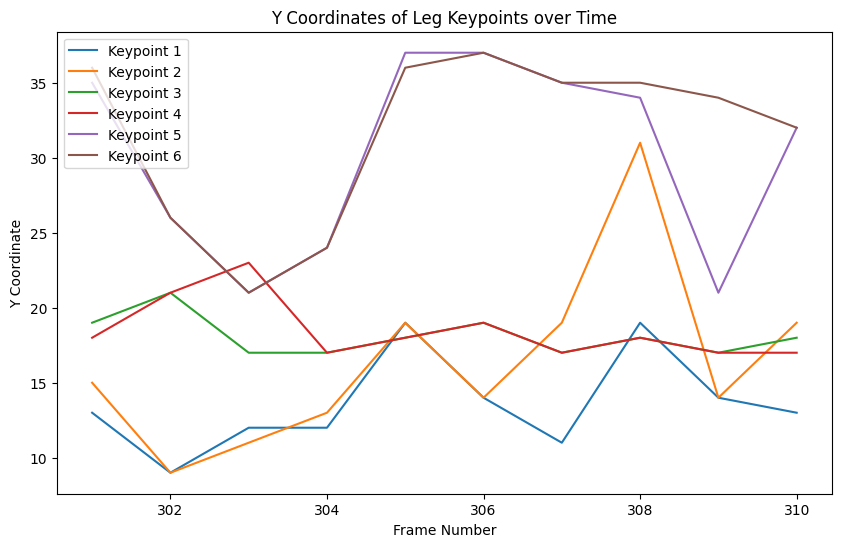

Leg keypoints for frame 311: [array([35., 15.], dtype=float32), array([36., 15.], dtype=float32), array([62., 19.], dtype=float32), array([62., 17.], dtype=float32), array([35., 32.], dtype=float32), array([35., 32.], dtype=float32)]
Leg keypoints for frame 312: [array([ 0., 14.], dtype=float32), array([61., 21.], dtype=float32), array([61., 21.], dtype=float32), array([61., 19.], dtype=float32), array([29., 27.], dtype=float32), array([29., 27.], dtype=float32)]
Leg keypoints for frame 313: [array([ 0., 13.], dtype=float32), array([ 0., 16.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([33., 20.], dtype=float32), array([33., 20.], dtype=float32)]
Leg keypoints for frame 314: [array([ 0., 13.], dtype=float32), array([ 0., 17.], dtype=float32), array([62., 21.], dtype=float32), array([62., 21.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 315: [array([ 0., 13.], dtype=float32), 

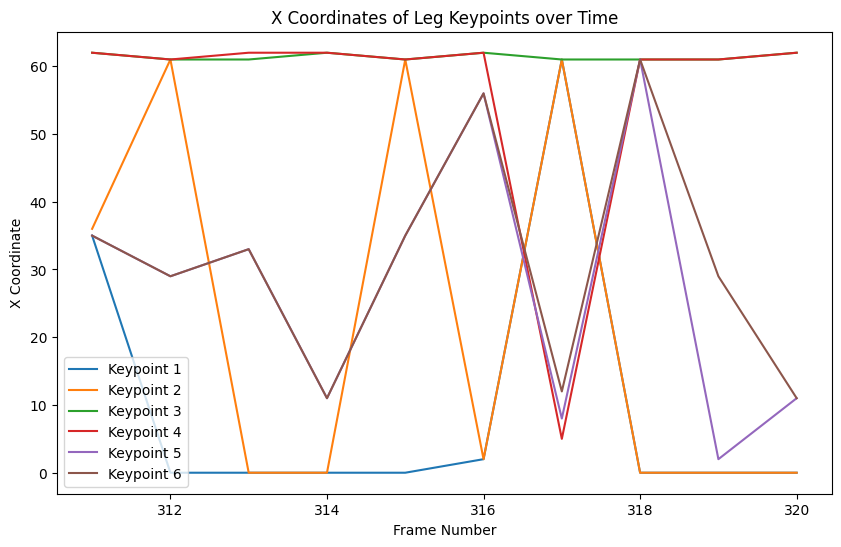

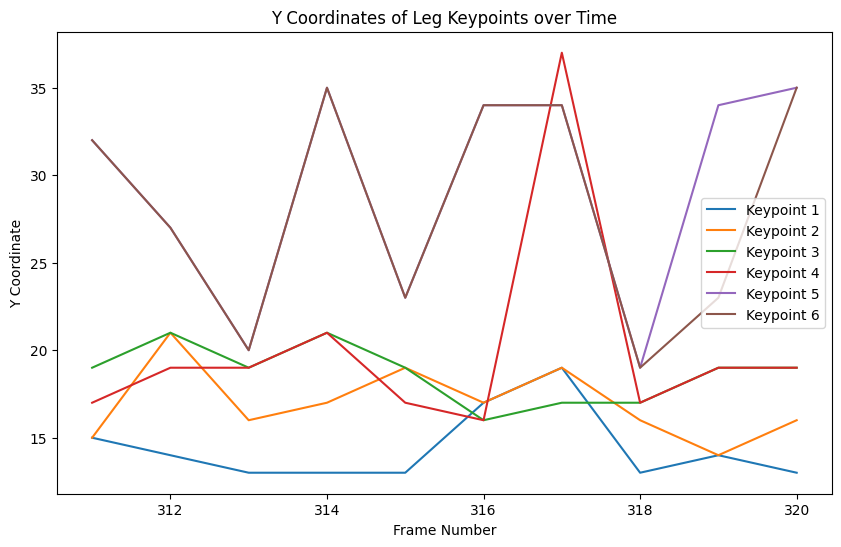

Leg keypoints for frame 321: [array([ 3., 19.], dtype=float32), array([ 0., 19.], dtype=float32), array([62., 19.], dtype=float32), array([62., 18.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 322: [array([ 0., 14.], dtype=float32), array([ 0., 15.], dtype=float32), array([62., 17.], dtype=float32), array([61., 17.], dtype=float32), array([56., 32.], dtype=float32), array([56., 32.], dtype=float32)]
Leg keypoints for frame 323: [array([26.,  9.], dtype=float32), array([26.,  9.], dtype=float32), array([62., 17.], dtype=float32), array([62., 17.], dtype=float32), array([12., 35.], dtype=float32), array([56., 34.], dtype=float32)]
Leg keypoints for frame 324: [array([35., 14.], dtype=float32), array([37., 12.], dtype=float32), array([62., 19.], dtype=float32), array([62., 18.], dtype=float32), array([35., 21.], dtype=float32), array([35., 21.], dtype=float32)]
Leg keypoints for frame 325: [array([ 0., 11.], dtype=float32), 

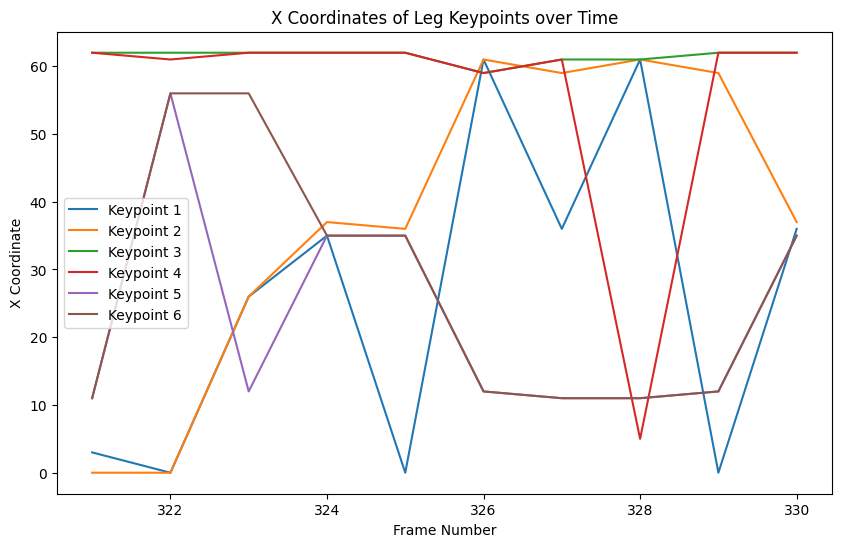

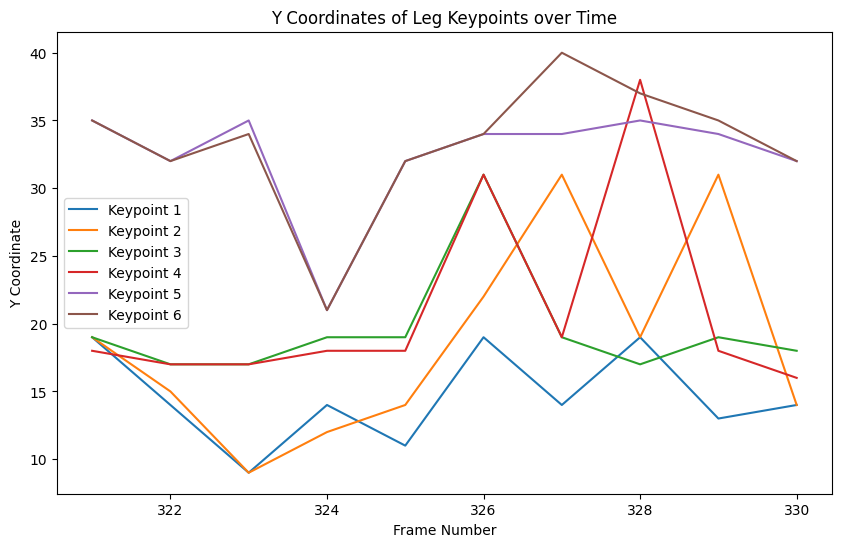

Leg keypoints for frame 331: [array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([61., 16.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32)]
Leg keypoints for frame 332: [array([ 0., 13.], dtype=float32), array([ 0., 13.], dtype=float32), array([ 2., 34.], dtype=float32), array([10., 37.], dtype=float32), array([12., 36.], dtype=float32), array([13., 37.], dtype=float32)]
Leg keypoints for frame 333: [array([61., 19.], dtype=float32), array([61., 21.], dtype=float32), array([62., 19.], dtype=float32), array([59., 19.], dtype=float32), array([11., 35.], dtype=float32), array([11., 36.], dtype=float32)]
Leg keypoints for frame 334: [array([61., 19.], dtype=float32), array([61., 22.], dtype=float32), array([57., 34.], dtype=float32), array([57., 34.], dtype=float32), array([11., 34.], dtype=float32), array([12., 35.], dtype=float32)]
Leg keypoints for frame 335: [array([ 0., 11.], dtype=float32), 

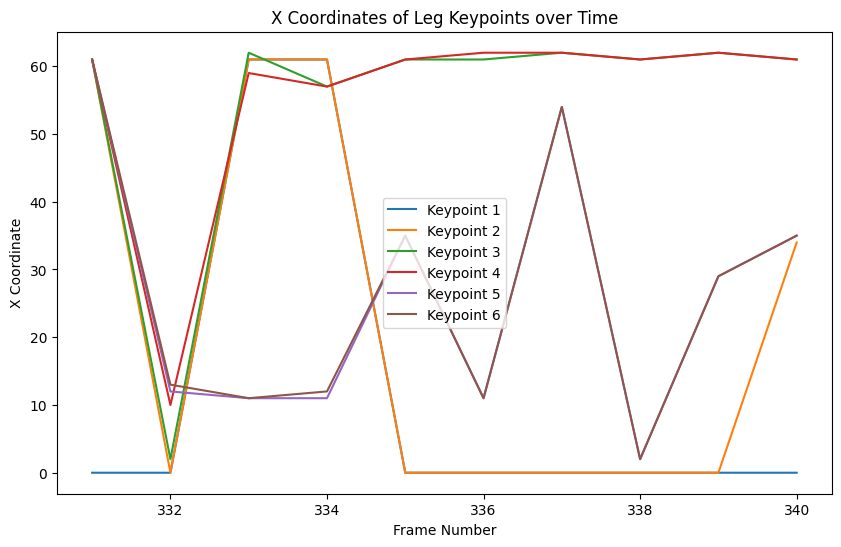

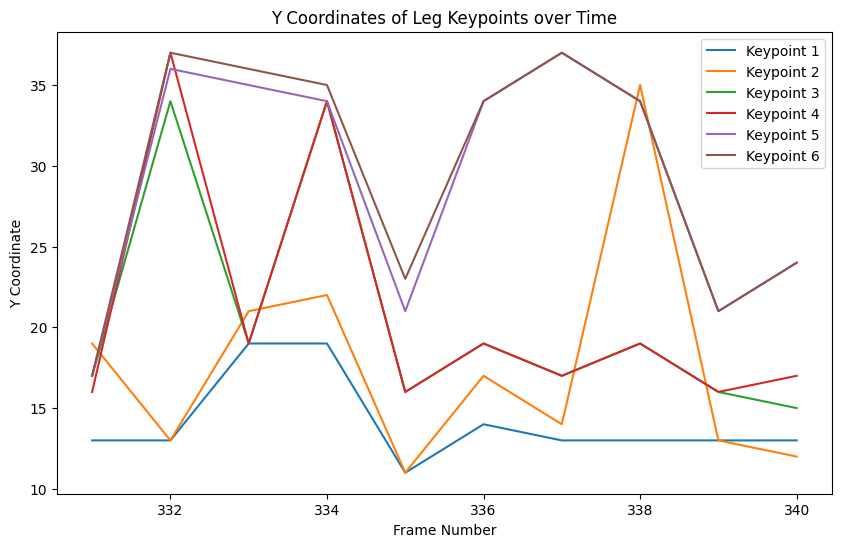

Leg keypoints for frame 341: [array([61., 15.], dtype=float32), array([61., 19.], dtype=float32), array([28., 25.], dtype=float32), array([28., 24.], dtype=float32), array([31., 18.], dtype=float32), array([31., 18.], dtype=float32)]
Leg keypoints for frame 342: [array([ 0., 13.], dtype=float32), array([61., 24.], dtype=float32), array([61., 21.], dtype=float32), array([34., 21.], dtype=float32), array([35., 21.], dtype=float32), array([35., 21.], dtype=float32)]
Leg keypoints for frame 343: [array([34., 20.], dtype=float32), array([38., 11.], dtype=float32), array([34., 21.], dtype=float32), array([34., 21.], dtype=float32), array([34., 21.], dtype=float32), array([34., 21.], dtype=float32)]
Leg keypoints for frame 344: [array([36., 20.], dtype=float32), array([37., 17.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([40., 11.], dtype=float32), array([40., 11.], dtype=float32)]
Leg keypoints for frame 345: [array([61., 19.], dtype=float32), 

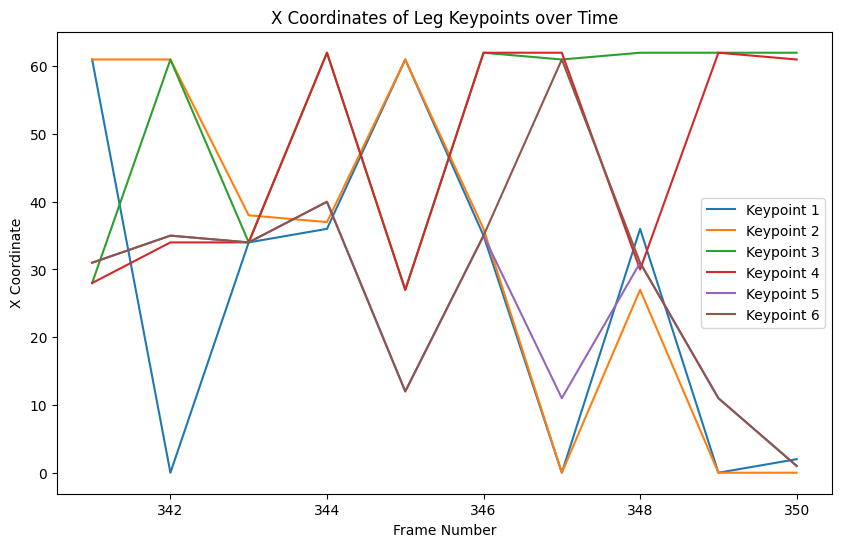

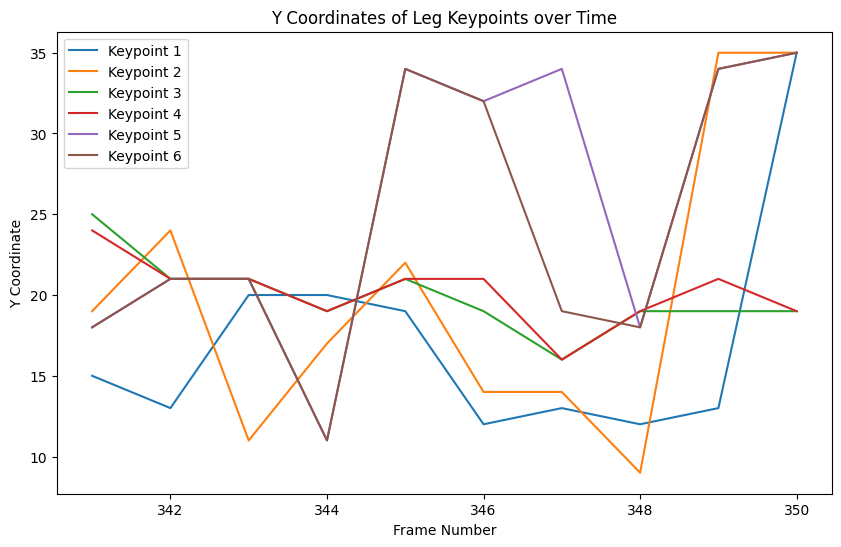

Leg keypoints for frame 351: [array([29., 15.], dtype=float32), array([29., 15.], dtype=float32), array([30., 23.], dtype=float32), array([30., 23.], dtype=float32), array([28., 30.], dtype=float32), array([28., 30.], dtype=float32)]
Leg keypoints for frame 352: [array([28., 12.], dtype=float32), array([29., 14.], dtype=float32), array([30., 21.], dtype=float32), array([30., 21.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 353: [array([ 3., 19.], dtype=float32), array([ 2., 19.], dtype=float32), array([61., 18.], dtype=float32), array([30., 24.], dtype=float32), array([29., 24.], dtype=float32), array([29., 25.], dtype=float32)]
Leg keypoints for frame 354: [array([36., 11.], dtype=float32), array([29., 11.], dtype=float32), array([61., 16.], dtype=float32), array([61., 17.], dtype=float32), array([31., 21.], dtype=float32), array([61., 16.], dtype=float32)]
Leg keypoints for frame 355: [array([32., 14.], dtype=float32), 

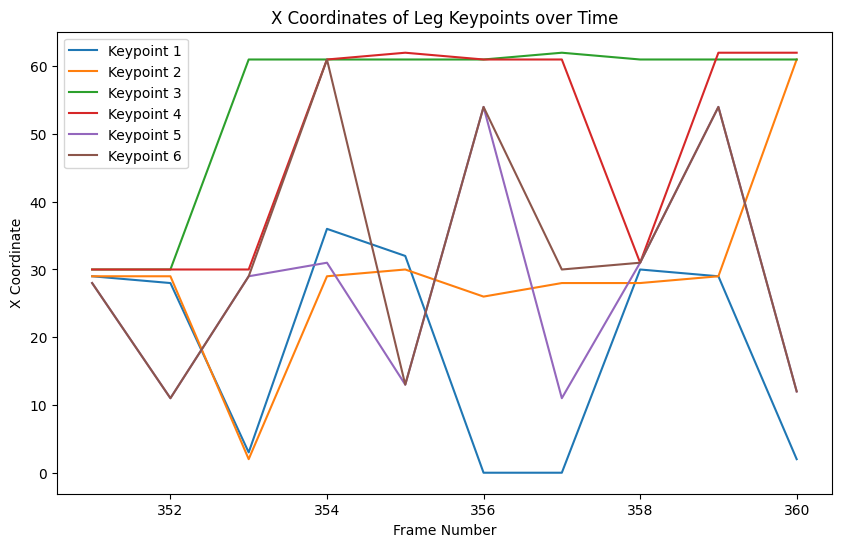

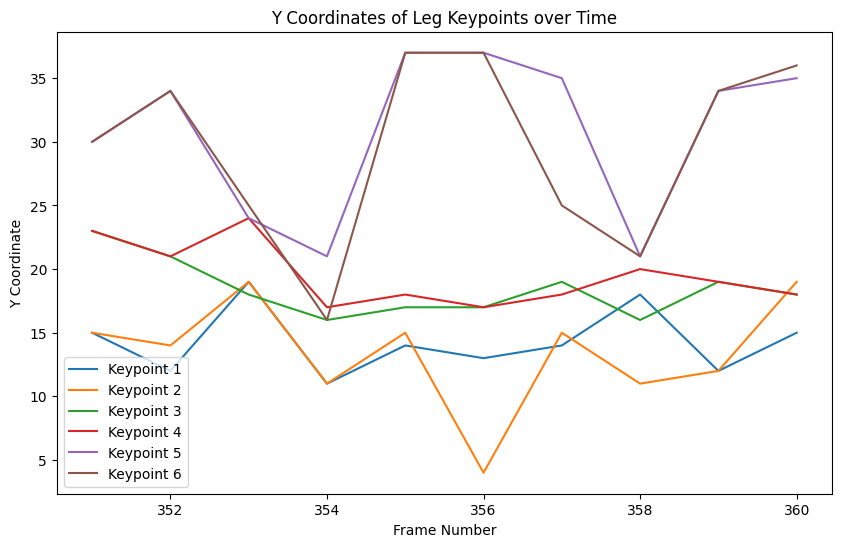

Leg keypoints for frame 361: [array([32., 14.], dtype=float32), array([30., 15.], dtype=float32), array([62., 19.], dtype=float32), array([62., 18.], dtype=float32), array([11., 34.], dtype=float32), array([56., 34.], dtype=float32)]
Leg keypoints for frame 362: [array([30., 17.], dtype=float32), array([29., 18.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([29., 27.], dtype=float32), array([29., 27.], dtype=float32)]
Leg keypoints for frame 363: [array([28., 12.], dtype=float32), array([28., 12.], dtype=float32), array([62., 19.], dtype=float32), array([30., 23.], dtype=float32), array([54., 35.], dtype=float32), array([54., 35.], dtype=float32)]
Leg keypoints for frame 364: [array([ 0., 13.], dtype=float32), array([30., 14.], dtype=float32), array([62., 19.], dtype=float32), array([62., 21.], dtype=float32), array([52., 37.], dtype=float32), array([52., 37.], dtype=float32)]
Leg keypoints for frame 365: [array([ 0., 13.], dtype=float32), 

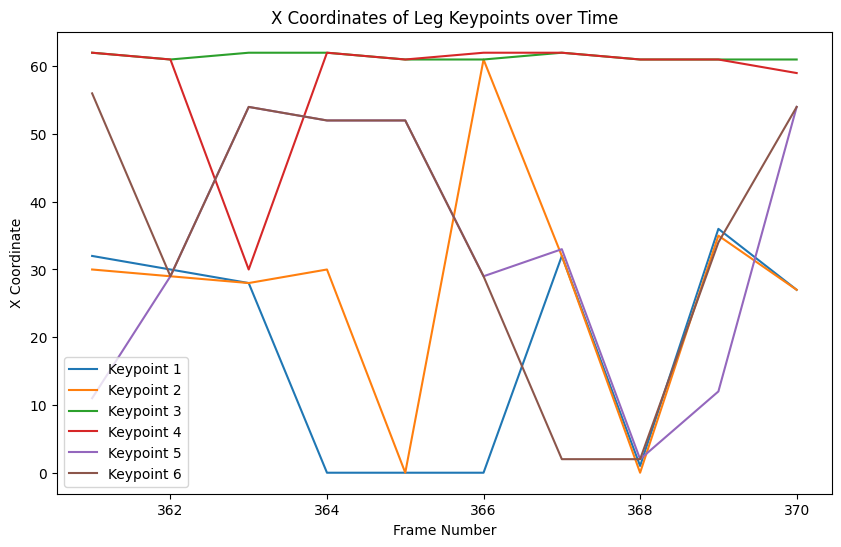

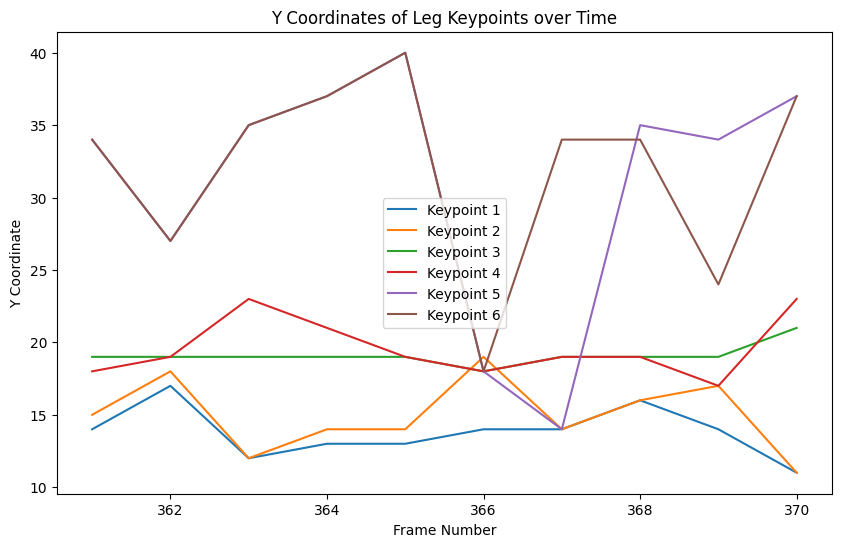

Leg keypoints for frame 371: [array([36., 15.], dtype=float32), array([36., 15.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([36., 27.], dtype=float32), array([36., 27.], dtype=float32)]
Leg keypoints for frame 372: [array([ 0., 13.], dtype=float32), array([61., 22.], dtype=float32), array([63., 17.], dtype=float32), array([62., 15.], dtype=float32), array([ 2., 35.], dtype=float32), array([ 2., 35.], dtype=float32)]
Leg keypoints for frame 373: [array([ 0., 13.], dtype=float32), array([ 0., 14.], dtype=float32), array([36., 19.], dtype=float32), array([35., 19.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 374: [array([32., 15.], dtype=float32), array([30., 15.], dtype=float32), array([62., 19.], dtype=float32), array([30., 23.], dtype=float32), array([26., 33.], dtype=float32), array([26., 33.], dtype=float32)]
Leg keypoints for frame 375: [array([35., 23.], dtype=float32), 

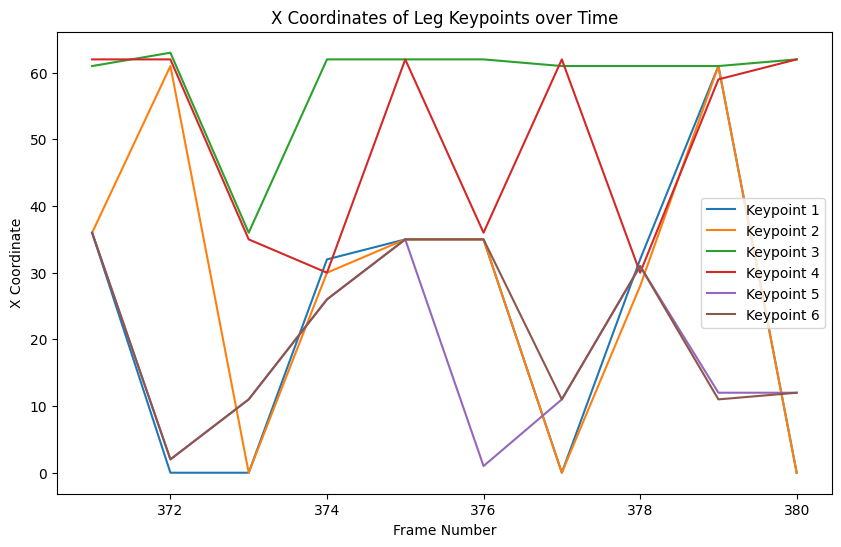

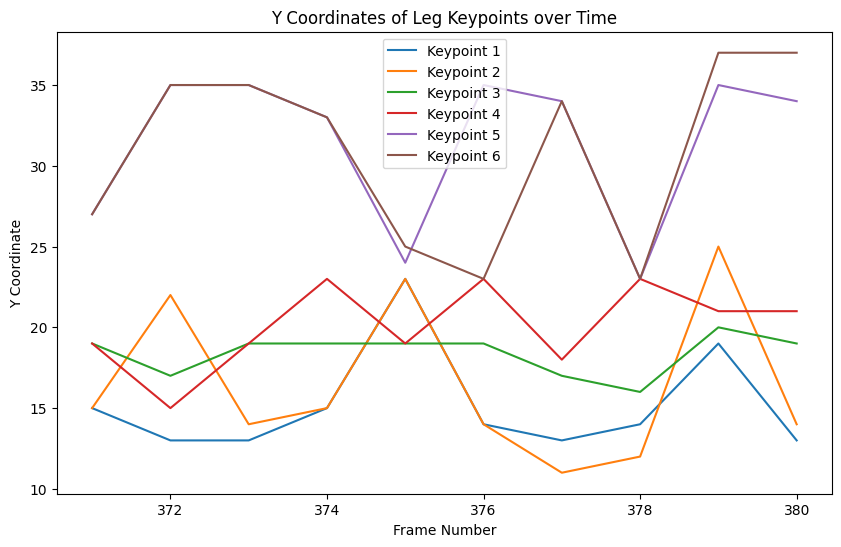

Leg keypoints for frame 381: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([59., 31.], dtype=float32), array([59., 31.], dtype=float32), array([ 2., 35.], dtype=float32), array([ 2., 35.], dtype=float32)]
Leg keypoints for frame 382: [array([30., 17.], dtype=float32), array([30., 15.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([30., 23.], dtype=float32), array([30., 23.], dtype=float32)]
Leg keypoints for frame 383: [array([ 2., 15.], dtype=float32), array([61., 25.], dtype=float32), array([61., 18.], dtype=float32), array([62., 18.], dtype=float32), array([11., 35.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 384: [array([ 0., 13.], dtype=float32), array([ 0., 15.], dtype=float32), array([61., 16.], dtype=float32), array([61., 17.], dtype=float32), array([35., 23.], dtype=float32), array([35., 23.], dtype=float32)]
Leg keypoints for frame 385: [array([28., 12.], dtype=float32), 

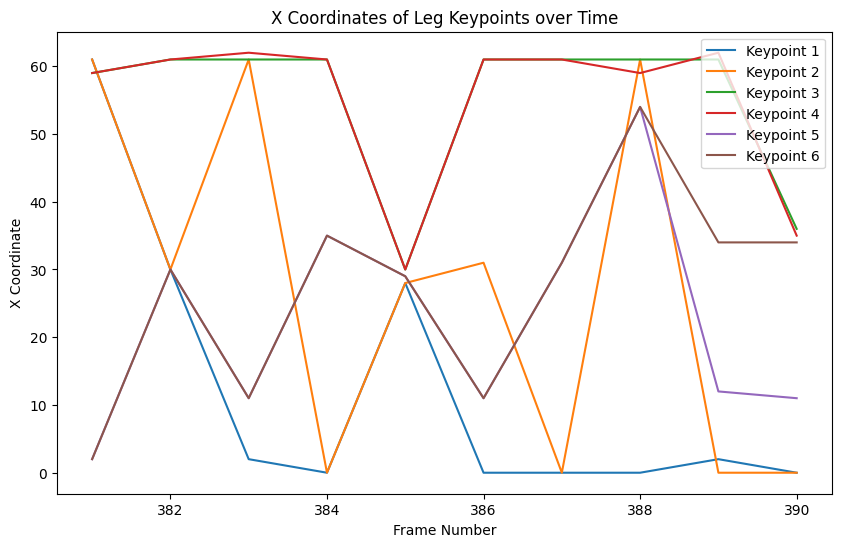

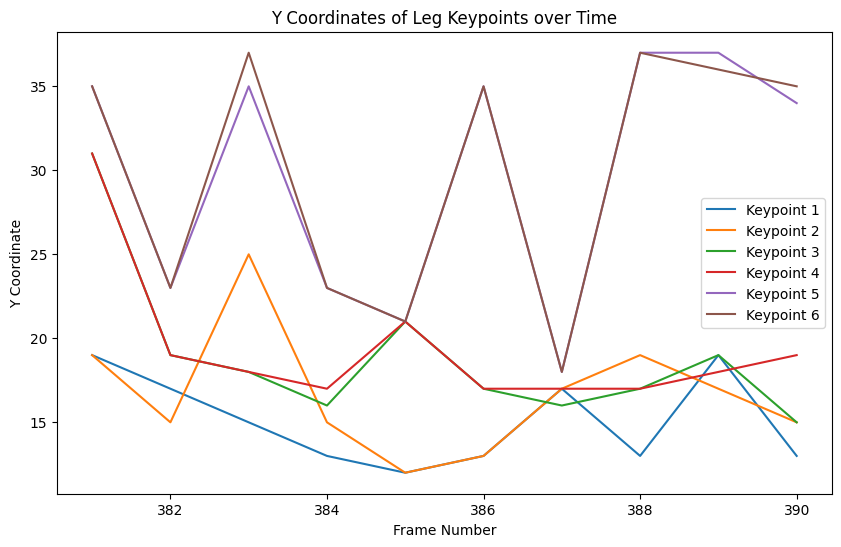

Leg keypoints for frame 391: [array([36., 15.], dtype=float32), array([34., 17.], dtype=float32), array([62., 19.], dtype=float32), array([62., 20.], dtype=float32), array([56., 34.], dtype=float32), array([56., 34.], dtype=float32)]
Leg keypoints for frame 392: [array([ 0., 11.], dtype=float32), array([ 0., 14.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 393: [array([ 0., 13.], dtype=float32), array([29., 11.], dtype=float32), array([62., 19.], dtype=float32), array([61., 19.], dtype=float32), array([35., 20.], dtype=float32), array([ 2., 34.], dtype=float32)]
Leg keypoints for frame 394: [array([ 0., 13.], dtype=float32), array([27.,  8.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([11., 33.], dtype=float32), array([11., 33.], dtype=float32)]
Leg keypoints for frame 395: [array([ 0., 15.], dtype=float32), 

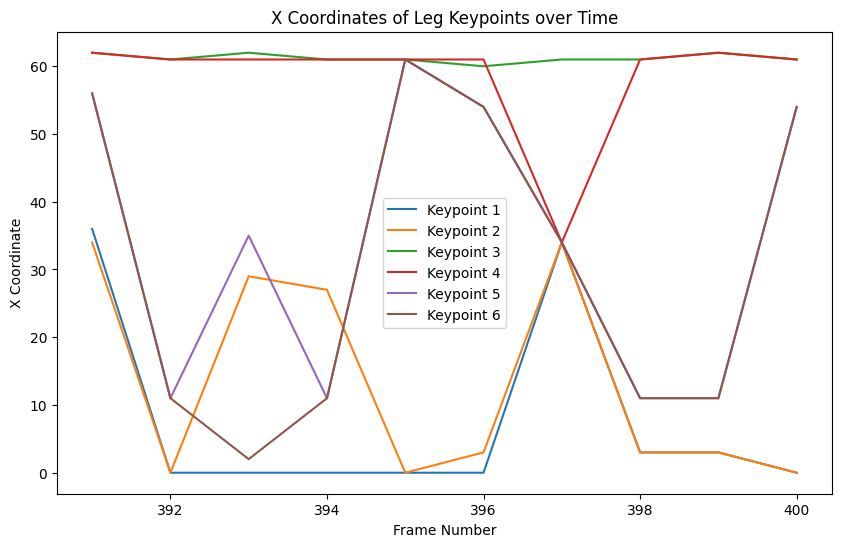

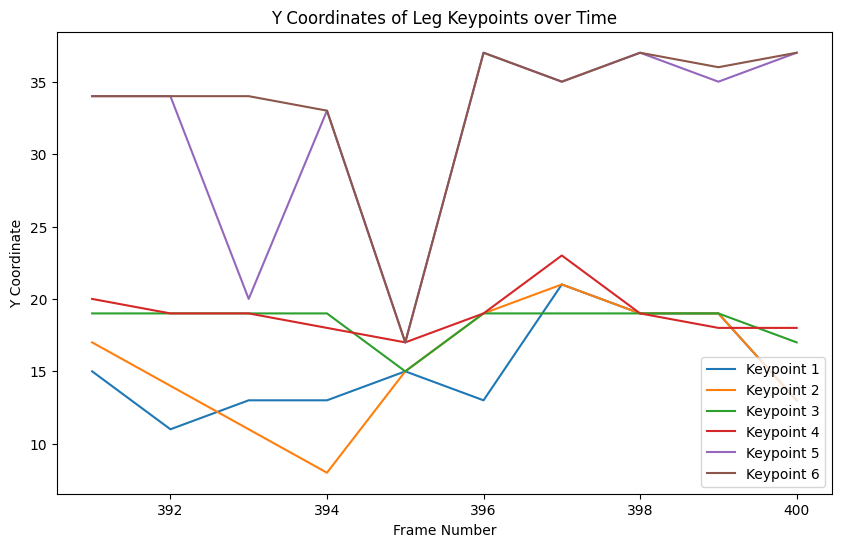

Leg keypoints for frame 401: [array([36., 11.], dtype=float32), array([31., 14.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([10., 32.], dtype=float32), array([10., 32.], dtype=float32)]
Leg keypoints for frame 402: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([28., 21.], dtype=float32), array([28., 20.], dtype=float32), array([11., 35.], dtype=float32), array([52., 37.], dtype=float32)]
Leg keypoints for frame 403: [array([ 0., 13.], dtype=float32), array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 404: [array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([59., 23.], dtype=float32), array([10., 33.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 405: [array([ 0., 14.], dtype=float32), 

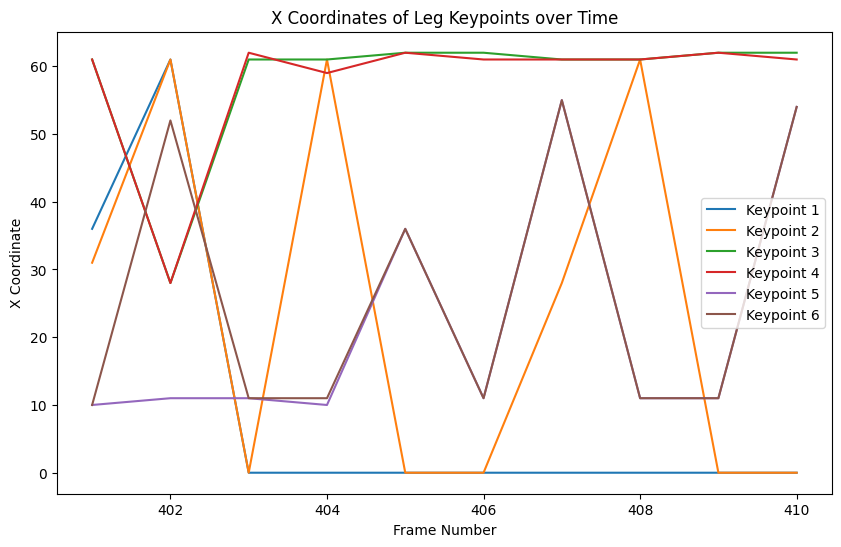

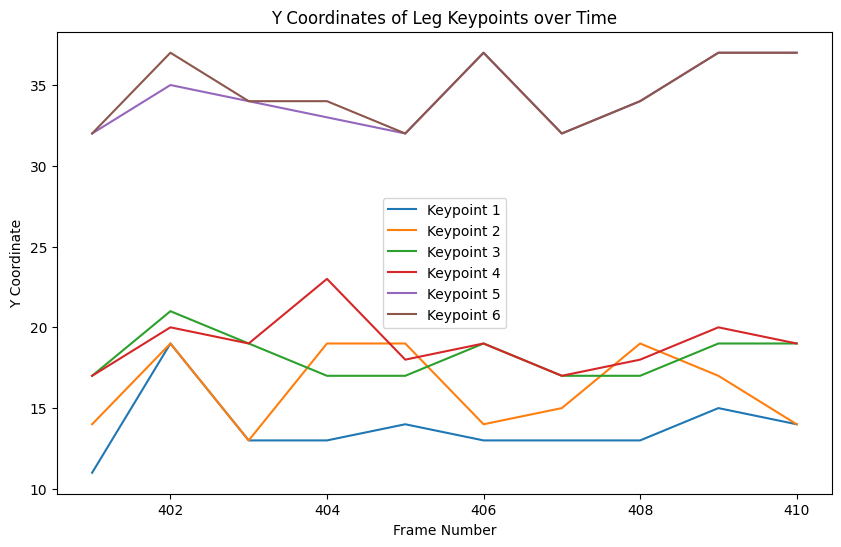

Leg keypoints for frame 411: [array([ 0., 13.], dtype=float32), array([ 0., 17.], dtype=float32), array([61., 15.], dtype=float32), array([62., 15.], dtype=float32), array([11., 35.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 412: [array([ 3., 19.], dtype=float32), array([ 2., 19.], dtype=float32), array([61., 17.], dtype=float32), array([62., 17.], dtype=float32), array([56., 32.], dtype=float32), array([56., 32.], dtype=float32)]
Leg keypoints for frame 413: [array([ 2., 17.], dtype=float32), array([ 2., 17.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 414: [array([30., 15.], dtype=float32), array([30., 15.], dtype=float32), array([61., 15.], dtype=float32), array([61., 16.], dtype=float32), array([34., 21.], dtype=float32), array([34., 21.], dtype=float32)]
Leg keypoints for frame 415: [array([ 0., 17.], dtype=float32), 

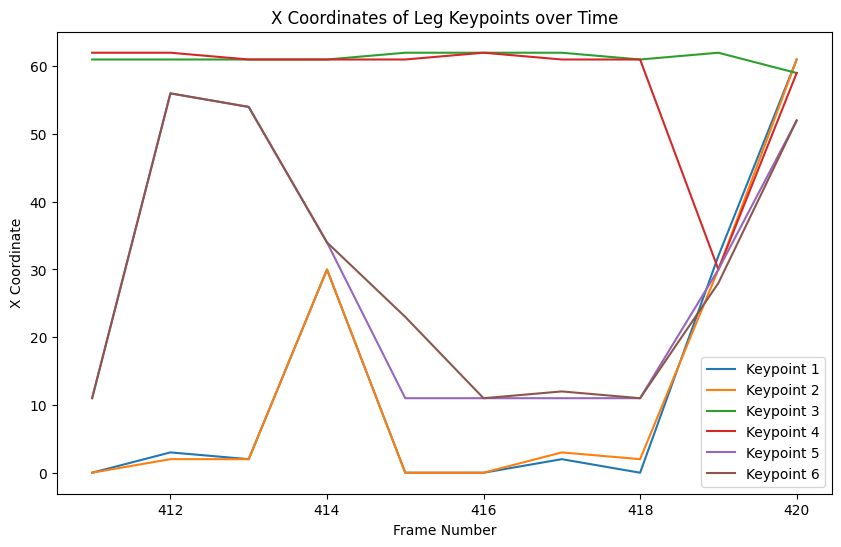

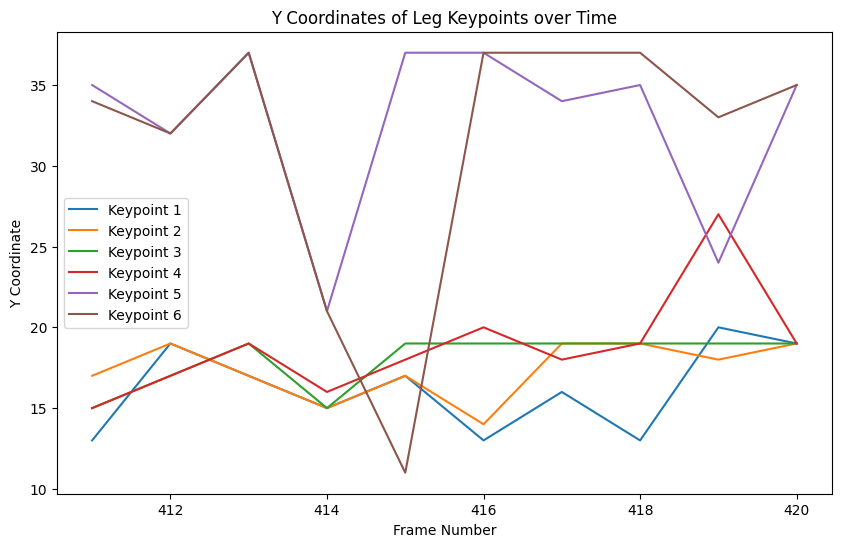

Leg keypoints for frame 421: [array([ 0., 13.], dtype=float32), array([ 0., 15.], dtype=float32), array([62., 17.], dtype=float32), array([62., 18.], dtype=float32), array([10., 32.], dtype=float32), array([10., 32.], dtype=float32)]
Leg keypoints for frame 422: [array([ 0., 13.], dtype=float32), array([26., 15.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([31., 20.], dtype=float32), array([31., 20.], dtype=float32)]
Leg keypoints for frame 423: [array([ 2., 19.], dtype=float32), array([61., 21.], dtype=float32), array([61., 20.], dtype=float32), array([59., 20.], dtype=float32), array([51., 35.], dtype=float32), array([51., 35.], dtype=float32)]
Leg keypoints for frame 424: [array([ 0., 11.], dtype=float32), array([ 0., 13.], dtype=float32), array([61., 17.], dtype=float32), array([62., 18.], dtype=float32), array([12., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 425: [array([ 0., 14.], dtype=float32), 

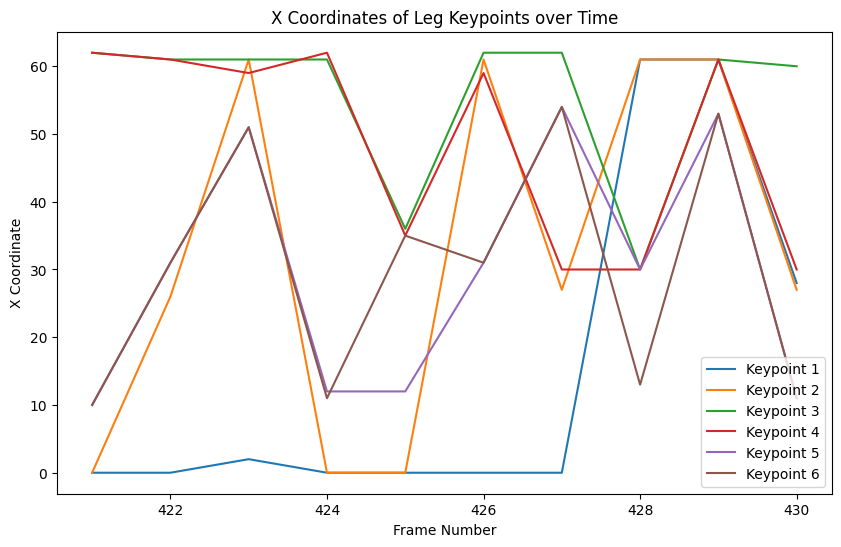

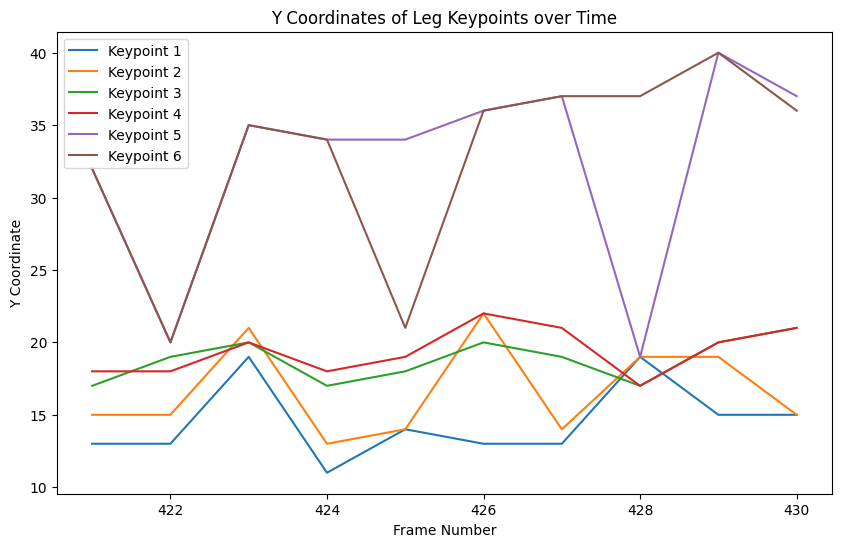

Leg keypoints for frame 431: [array([ 0., 13.], dtype=float32), array([ 0., 14.], dtype=float32), array([61., 16.], dtype=float32), array([63., 15.], dtype=float32), array([29., 17.], dtype=float32), array([29., 17.], dtype=float32)]
Leg keypoints for frame 432: [array([61., 19.], dtype=float32), array([61., 21.], dtype=float32), array([30., 17.], dtype=float32), array([30., 21.], dtype=float32), array([54., 37.], dtype=float32), array([52., 37.], dtype=float32)]
Leg keypoints for frame 433: [array([37., 11.], dtype=float32), array([37., 11.], dtype=float32), array([61., 17.], dtype=float32), array([59., 17.], dtype=float32), array([56., 32.], dtype=float32), array([56., 32.], dtype=float32)]
Leg keypoints for frame 434: [array([37.,  5.], dtype=float32), array([61., 31.], dtype=float32), array([30., 23.], dtype=float32), array([29., 24.], dtype=float32), array([11., 35.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 435: [array([ 0., 13.], dtype=float32), 

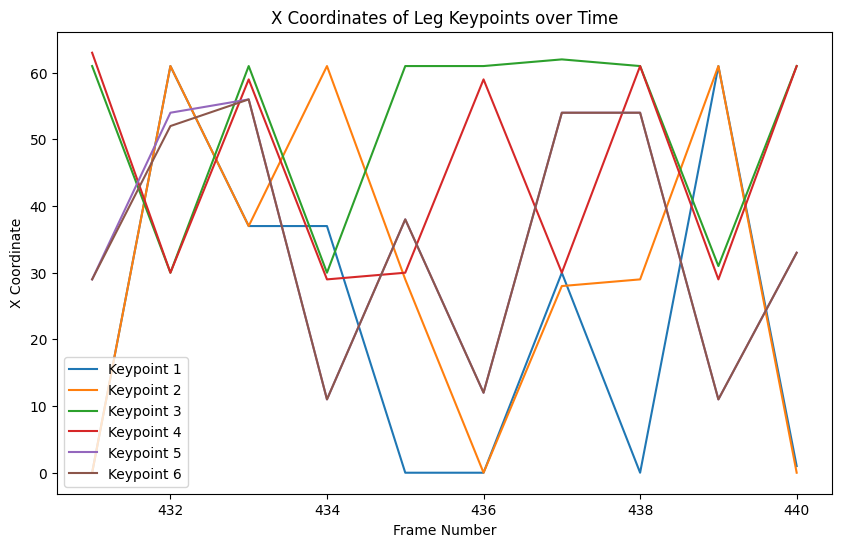

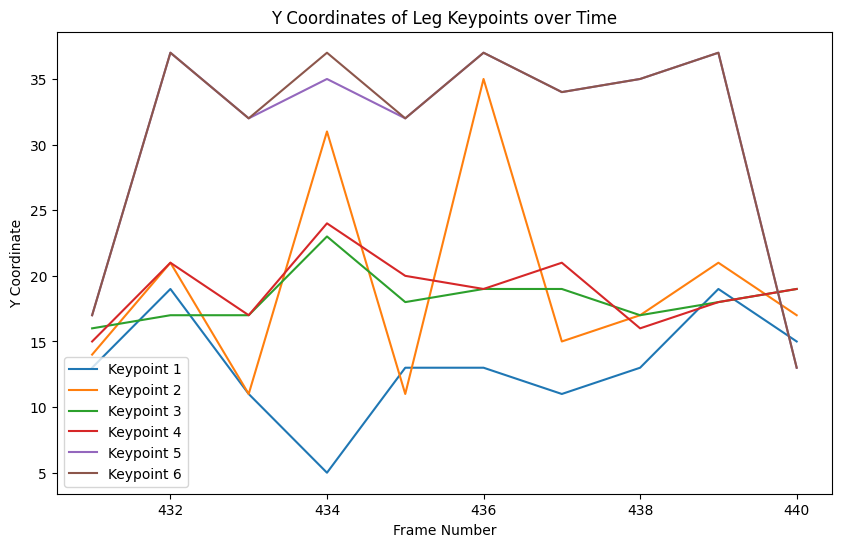

Leg keypoints for frame 441: [array([36.,  8.], dtype=float32), array([35.,  8.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([31., 20.], dtype=float32), array([31., 20.], dtype=float32)]
Leg keypoints for frame 442: [array([ 0., 13.], dtype=float32), array([61., 21.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 443: [array([ 2., 19.], dtype=float32), array([ 2., 19.], dtype=float32), array([61., 19.], dtype=float32), array([59., 17.], dtype=float32), array([12., 37.], dtype=float32), array([13., 37.], dtype=float32)]
Leg keypoints for frame 444: [array([ 0., 13.], dtype=float32), array([35., 11.], dtype=float32), array([30., 21.], dtype=float32), array([30., 21.], dtype=float32), array([54., 35.], dtype=float32), array([54., 35.], dtype=float32)]
Leg keypoints for frame 445: [array([ 3., 19.], dtype=float32), 

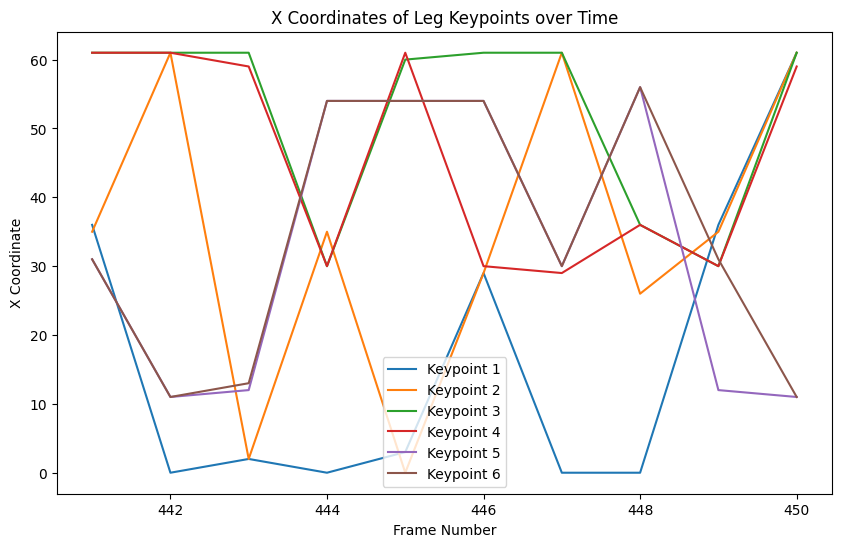

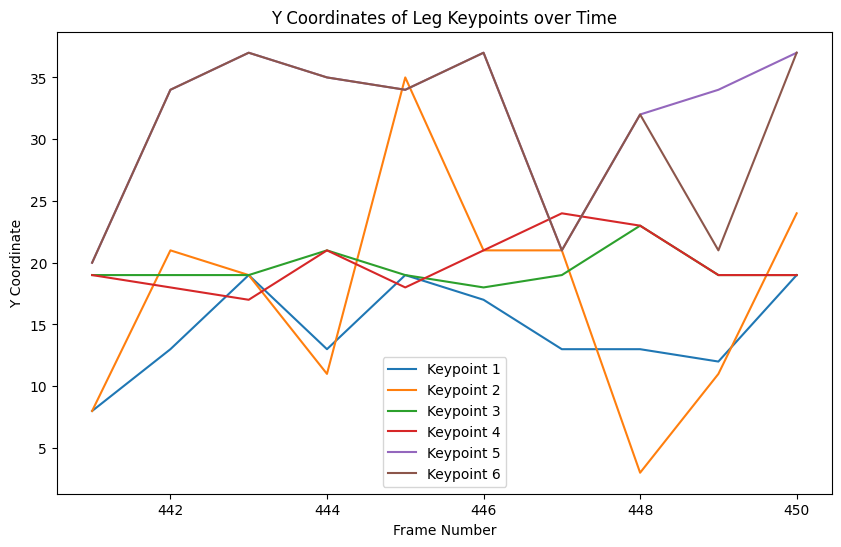

Leg keypoints for frame 451: [array([ 2., 19.], dtype=float32), array([ 2., 19.], dtype=float32), array([60., 21.], dtype=float32), array([60., 20.], dtype=float32), array([54., 34.], dtype=float32), array([54., 34.], dtype=float32)]
Leg keypoints for frame 452: [array([ 0., 11.], dtype=float32), array([ 0., 14.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([52., 37.], dtype=float32), array([52., 37.], dtype=float32)]
Leg keypoints for frame 453: [array([ 0., 13.], dtype=float32), array([25.,  0.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([35., 23.], dtype=float32), array([35., 23.], dtype=float32)]
Leg keypoints for frame 454: [array([ 2., 15.], dtype=float32), array([ 0., 17.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 455: [array([61., 19.], dtype=float32), 

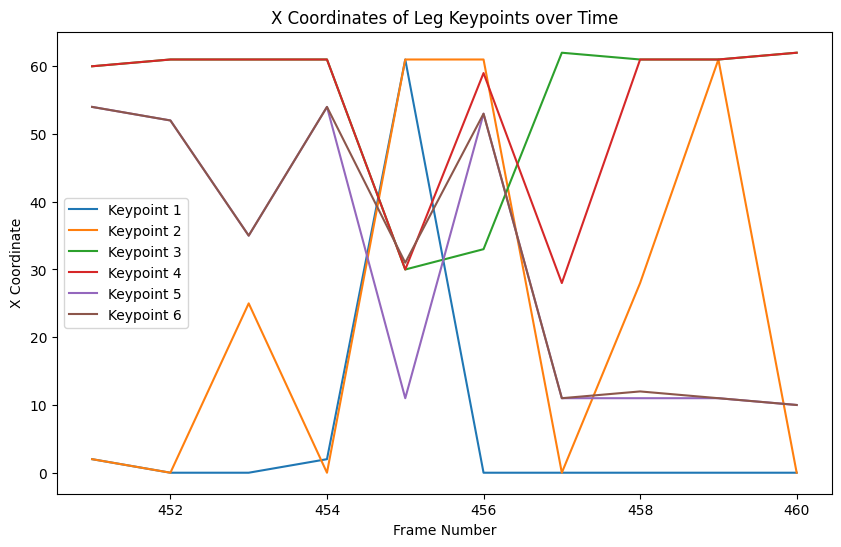

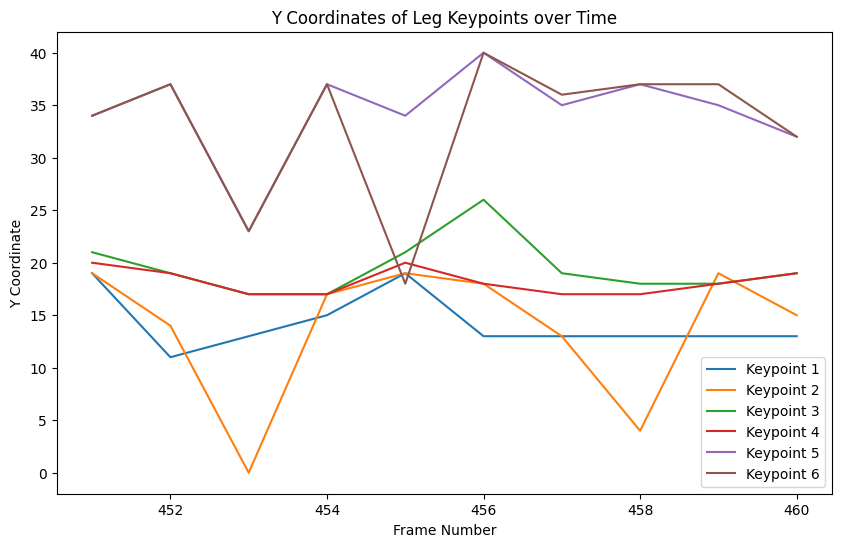

Leg keypoints for frame 461: [array([ 3., 19.], dtype=float32), array([ 3., 19.], dtype=float32), array([61., 19.], dtype=float32), array([62., 18.], dtype=float32), array([30., 21.], dtype=float32), array([30., 21.], dtype=float32)]
Leg keypoints for frame 462: [array([59., 27.], dtype=float32), array([59., 28.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([12., 34.], dtype=float32), array([12., 34.], dtype=float32)]
Leg keypoints for frame 463: [array([ 0., 13.], dtype=float32), array([35., 15.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([12., 35.], dtype=float32), array([34., 35.], dtype=float32)]
Leg keypoints for frame 464: [array([ 0., 13.], dtype=float32), array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 465: [array([ 0., 13.], dtype=float32), 

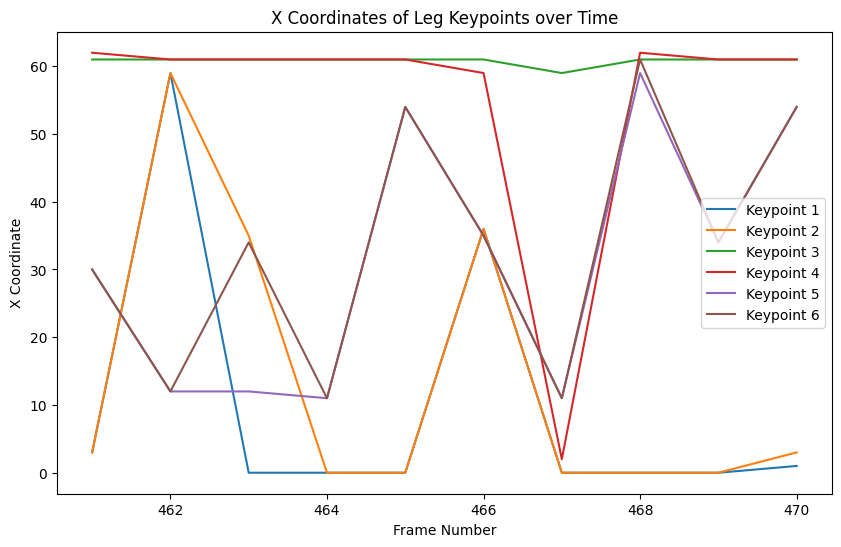

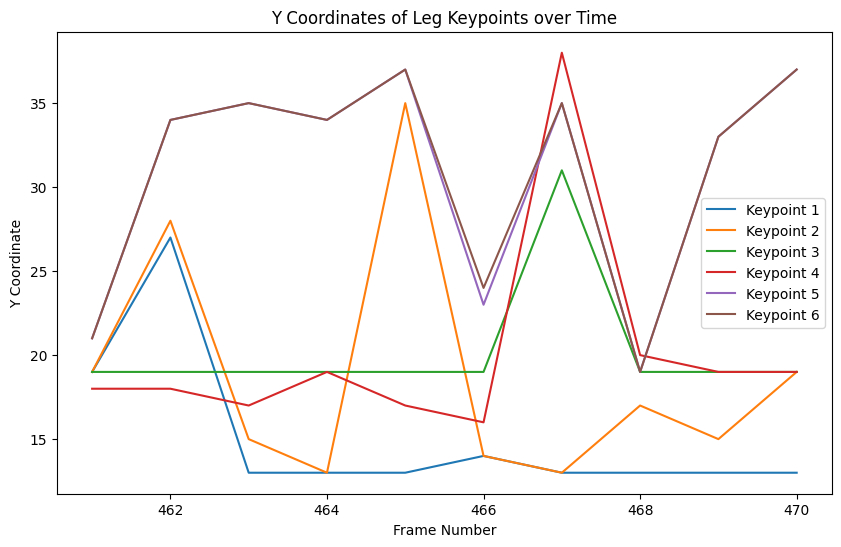

Leg keypoints for frame 471: [array([ 0., 13.], dtype=float32), array([26.,  1.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([35., 32.], dtype=float32), array([35., 32.], dtype=float32)]
Leg keypoints for frame 472: [array([ 1., 15.], dtype=float32), array([ 0., 15.], dtype=float32), array([61., 16.], dtype=float32), array([61., 17.], dtype=float32), array([12., 34.], dtype=float32), array([35., 24.], dtype=float32)]
Leg keypoints for frame 473: [array([ 0., 13.], dtype=float32), array([ 0., 16.], dtype=float32), array([61., 19.], dtype=float32), array([34., 21.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 474: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 20.], dtype=float32), array([26., 17.], dtype=float32), array([11., 35.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 475: [array([ 0., 13.], dtype=float32), 

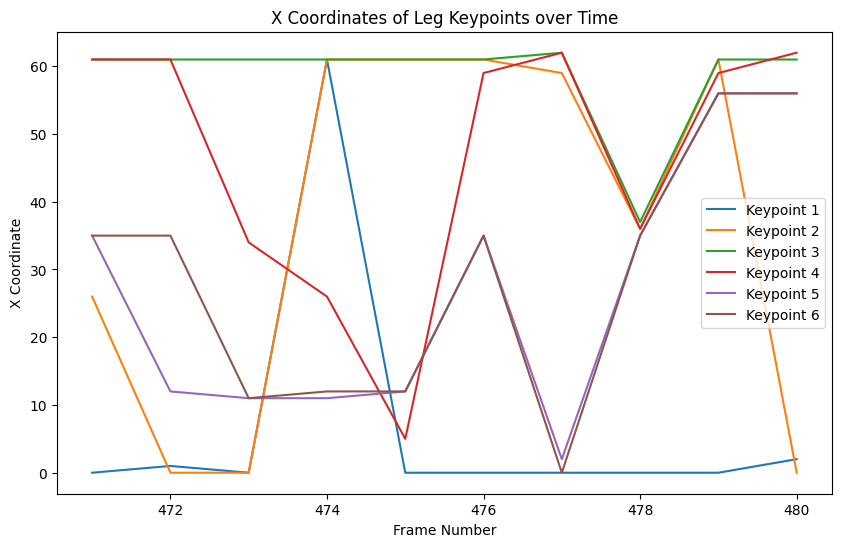

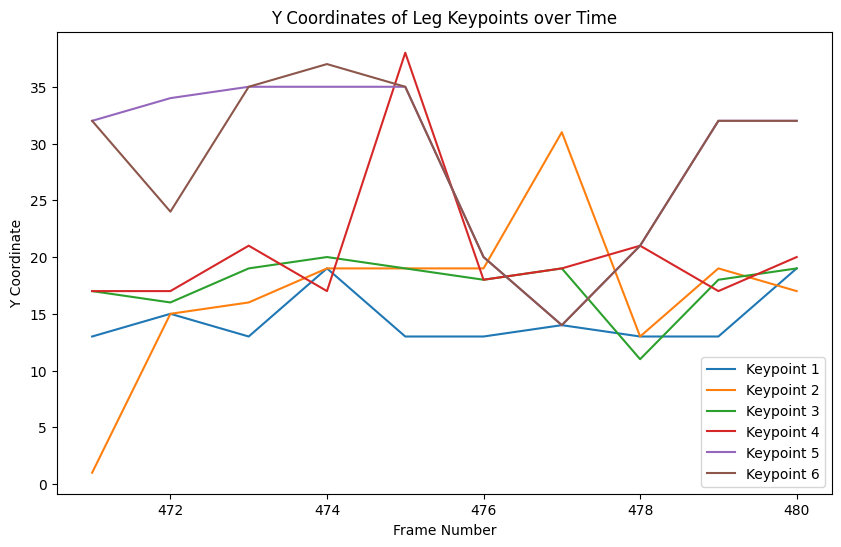

Leg keypoints for frame 481: [array([36., 16.], dtype=float32), array([35., 16.], dtype=float32), array([62., 17.], dtype=float32), array([31., 23.], dtype=float32), array([36., 35.], dtype=float32), array([36., 35.], dtype=float32)]
Leg keypoints for frame 482: [array([ 0., 14.], dtype=float32), array([ 0., 14.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([12., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 483: [array([ 0., 13.], dtype=float32), array([ 0., 15.], dtype=float32), array([61., 17.], dtype=float32), array([61., 17.], dtype=float32), array([54., 35.], dtype=float32), array([54., 35.], dtype=float32)]
Leg keypoints for frame 484: [array([34., 20.], dtype=float32), array([34., 21.], dtype=float32), array([33., 23.], dtype=float32), array([59., 21.], dtype=float32), array([35., 32.], dtype=float32), array([35., 32.], dtype=float32)]
Leg keypoints for frame 485: [array([ 0., 13.], dtype=float32), 

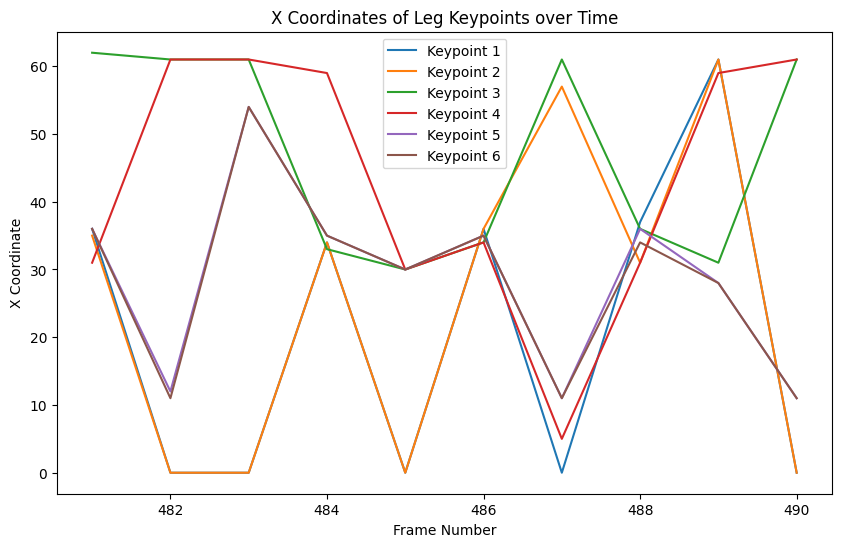

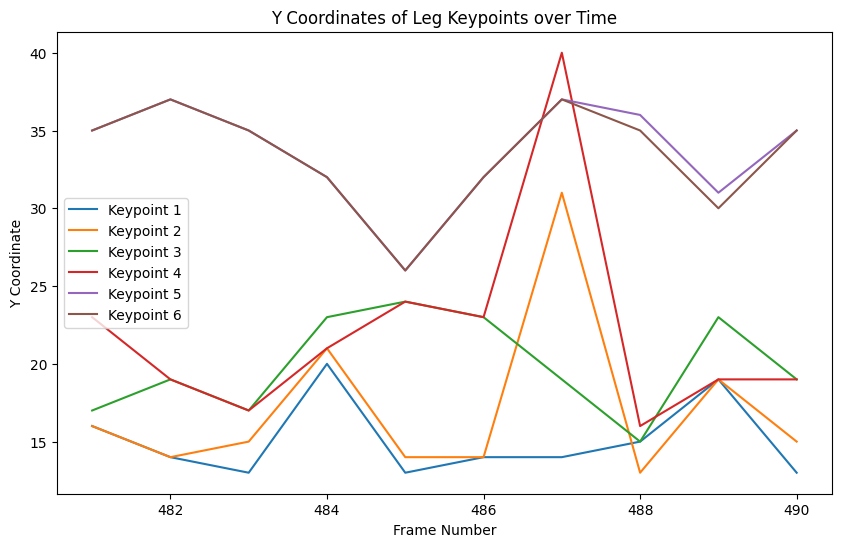

Leg keypoints for frame 491: [array([ 2., 15.], dtype=float32), array([ 0., 16.], dtype=float32), array([61., 19.], dtype=float32), array([62., 19.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 492: [array([ 0., 13.], dtype=float32), array([32., 11.], dtype=float32), array([34., 23.], dtype=float32), array([34., 23.], dtype=float32), array([36., 32.], dtype=float32), array([36., 35.], dtype=float32)]
Leg keypoints for frame 493: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([61., 18.], dtype=float32), array([10., 34.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 494: [array([ 2., 15.], dtype=float32), array([ 0., 15.], dtype=float32), array([29., 20.], dtype=float32), array([ 5., 41.], dtype=float32), array([11., 35.], dtype=float32), array([11., 35.], dtype=float32)]
Leg keypoints for frame 495: [array([ 0., 13.], dtype=float32), 

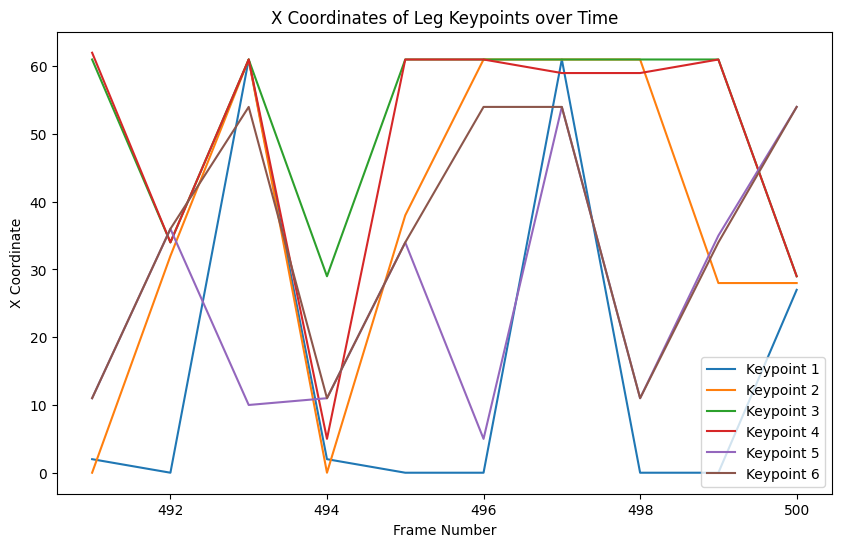

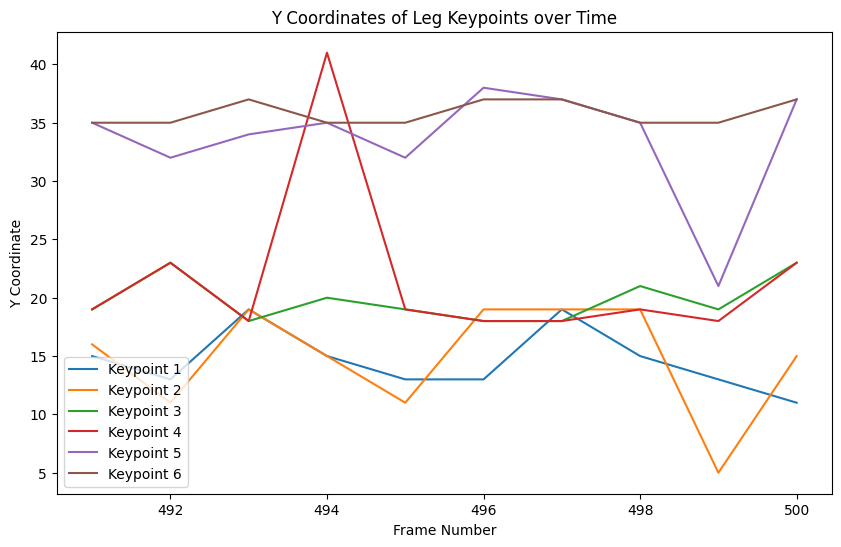

Leg keypoints for frame 501: [array([ 0., 13.], dtype=float32), array([ 0., 14.], dtype=float32), array([61., 21.], dtype=float32), array([61., 21.], dtype=float32), array([12., 38.], dtype=float32), array([12., 38.], dtype=float32)]
Leg keypoints for frame 502: [array([30., 15.], dtype=float32), array([28., 13.], dtype=float32), array([30., 25.], dtype=float32), array([30., 25.], dtype=float32), array([31., 24.], dtype=float32), array([31., 24.], dtype=float32)]
Leg keypoints for frame 503: [array([36.,  9.], dtype=float32), array([30.,  8.], dtype=float32), array([61., 18.], dtype=float32), array([30., 21.], dtype=float32), array([12., 37.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 504: [array([36., 20.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([36., 21.], dtype=float32), array([12., 37.], dtype=float32), array([12., 37.], dtype=float32)]
Leg keypoints for frame 505: [array([61., 19.], dtype=float32), 

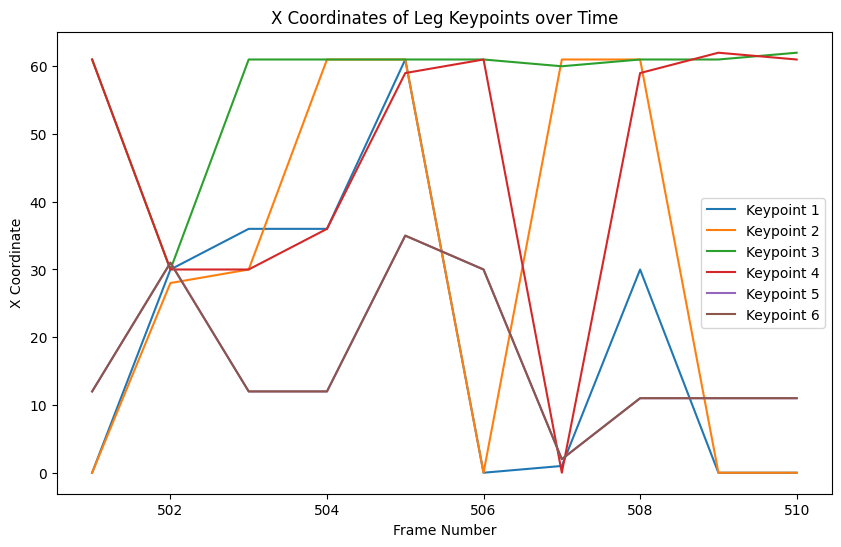

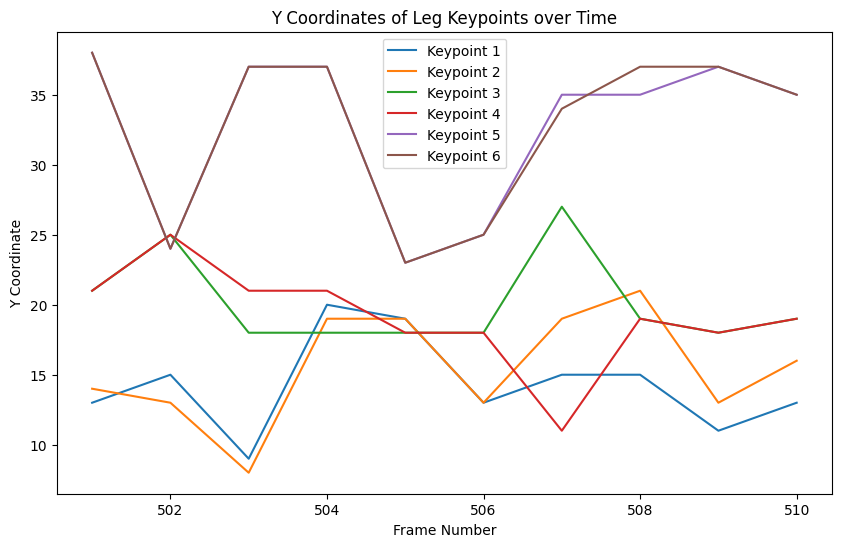

Leg keypoints for frame 511: [array([61., 19.], dtype=float32), array([61., 21.], dtype=float32), array([36., 23.], dtype=float32), array([35., 23.], dtype=float32), array([12., 34.], dtype=float32), array([14., 37.], dtype=float32)]
Leg keypoints for frame 512: [array([61., 15.], dtype=float32), array([61., 18.], dtype=float32), array([61., 17.], dtype=float32), array([30., 23.], dtype=float32), array([31., 22.], dtype=float32), array([27., 32.], dtype=float32)]
Leg keypoints for frame 513: [array([32., 12.], dtype=float32), array([30., 12.], dtype=float32), array([30., 21.], dtype=float32), array([30., 21.], dtype=float32), array([33., 11.], dtype=float32), array([33., 11.], dtype=float32)]
Leg keypoints for frame 514: [array([ 0., 11.], dtype=float32), array([59., 28.], dtype=float32), array([34., 23.], dtype=float32), array([34., 23.], dtype=float32), array([35., 25.], dtype=float32), array([35., 25.], dtype=float32)]
Leg keypoints for frame 515: [array([30., 15.], dtype=float32), 

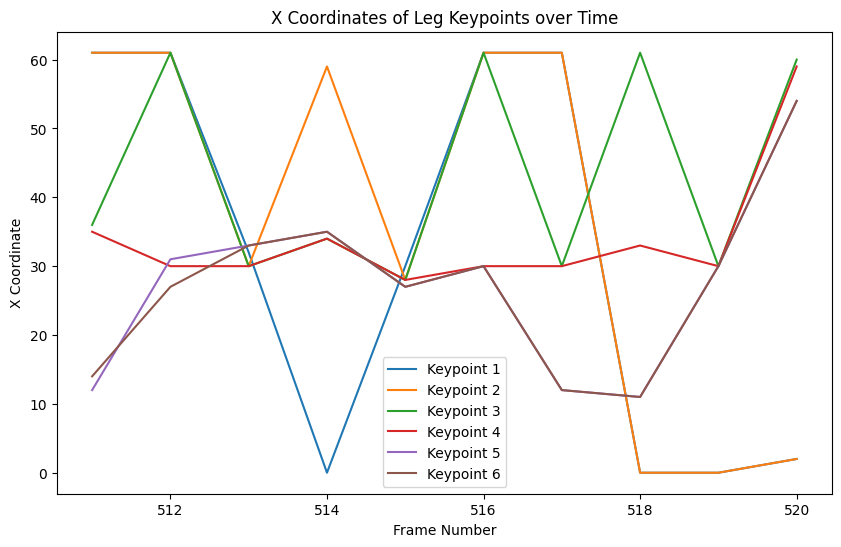

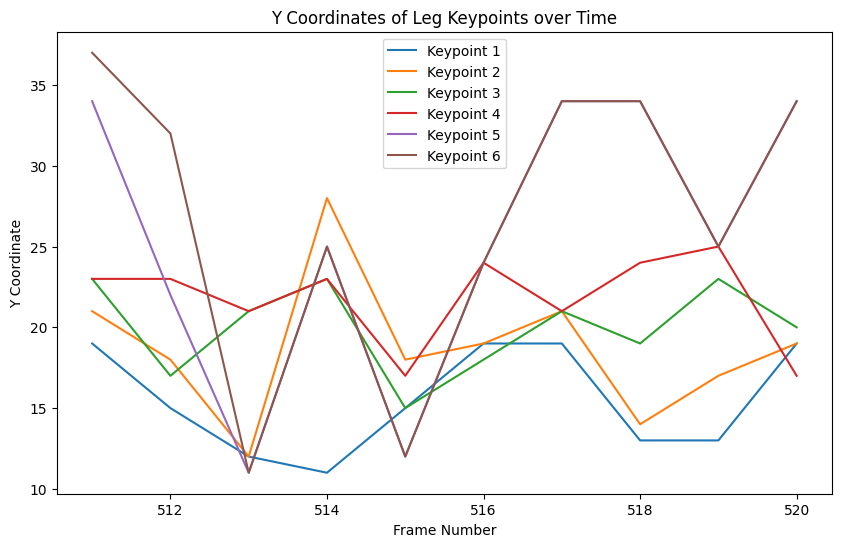

Leg keypoints for frame 521: [array([ 0., 13.], dtype=float32), array([61., 21.], dtype=float32), array([30., 23.], dtype=float32), array([30., 23.], dtype=float32), array([27., 33.], dtype=float32), array([27., 33.], dtype=float32)]
Leg keypoints for frame 522: [array([ 2., 19.], dtype=float32), array([ 0., 19.], dtype=float32), array([61., 18.], dtype=float32), array([10., 34.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 523: [array([ 1., 15.], dtype=float32), array([28., 25.], dtype=float32), array([30., 23.], dtype=float32), array([30., 25.], dtype=float32), array([11., 35.], dtype=float32), array([12., 35.], dtype=float32)]
Leg keypoints for frame 524: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([36., 21.], dtype=float32), array([59., 18.], dtype=float32), array([11., 35.], dtype=float32), array([ 2., 35.], dtype=float32)]
Leg keypoints for frame 525: [array([ 0., 13.], dtype=float32), 

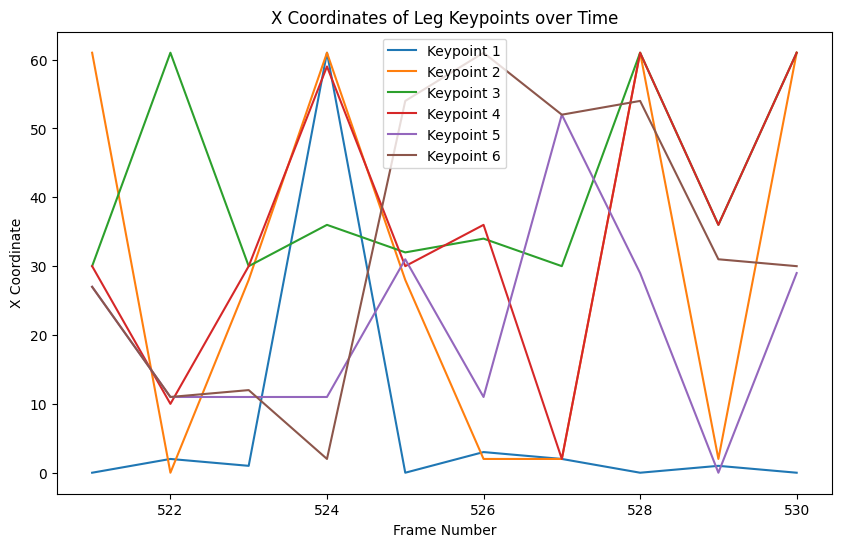

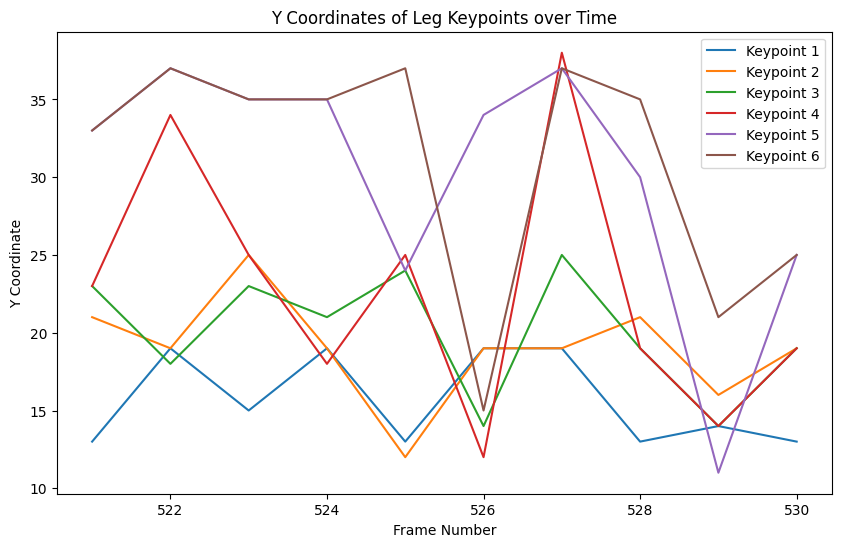

Leg keypoints for frame 531: [array([36., 11.], dtype=float32), array([36., 11.], dtype=float32), array([61., 19.], dtype=float32), array([59., 19.], dtype=float32), array([40.,  8.], dtype=float32), array([40.,  8.], dtype=float32)]
Leg keypoints for frame 532: [array([ 3., 19.], dtype=float32), array([59., 28.], dtype=float32), array([36., 12.], dtype=float32), array([36., 13.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 533: [array([ 0., 14.], dtype=float32), array([ 0., 15.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([61., 15.], dtype=float32), array([61., 15.], dtype=float32)]
Leg keypoints for frame 534: [array([ 1., 14.], dtype=float32), array([61., 19.], dtype=float32), array([61., 17.], dtype=float32), array([62., 19.], dtype=float32), array([31., 23.], dtype=float32), array([31., 23.], dtype=float32)]
Leg keypoints for frame 535: [array([30., 15.], dtype=float32), 

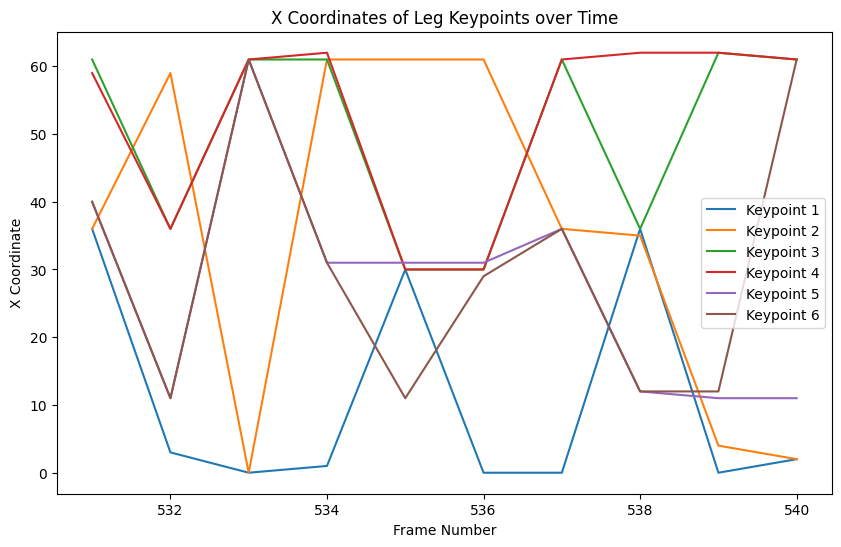

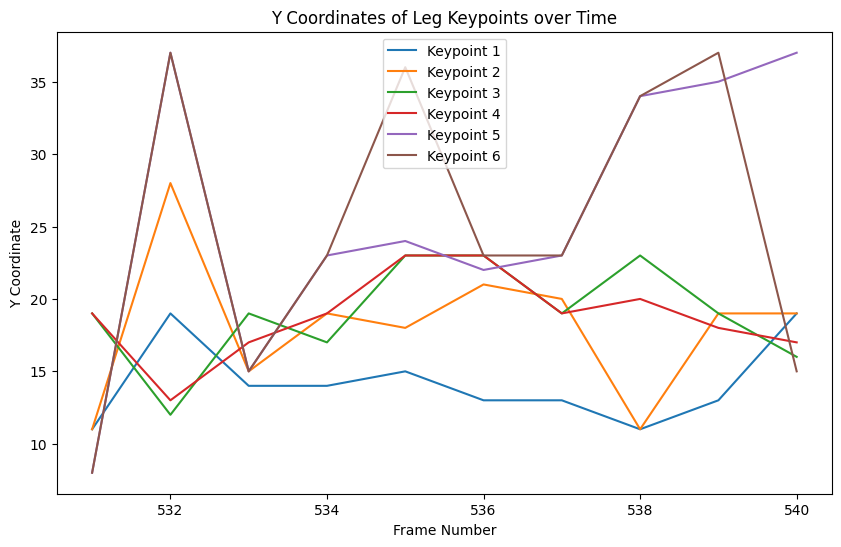

Leg keypoints for frame 541: [array([ 2., 15.], dtype=float32), array([ 2., 15.], dtype=float32), array([61., 17.], dtype=float32), array([61., 16.], dtype=float32), array([56., 34.], dtype=float32), array([56., 34.], dtype=float32)]
Leg keypoints for frame 542: [array([ 0., 13.], dtype=float32), array([31., 17.], dtype=float32), array([33., 23.], dtype=float32), array([33., 23.], dtype=float32), array([12., 34.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 543: [array([36., 14.], dtype=float32), array([36., 15.], dtype=float32), array([61., 19.], dtype=float32), array([59., 19.], dtype=float32), array([39., 14.], dtype=float32), array([39., 14.], dtype=float32)]
Leg keypoints for frame 544: [array([28., 17.], dtype=float32), array([28., 15.], dtype=float32), array([28., 23.], dtype=float32), array([28., 23.], dtype=float32), array([26., 33.], dtype=float32), array([26., 33.], dtype=float32)]
Leg keypoints for frame 545: [array([ 0., 11.], dtype=float32), 

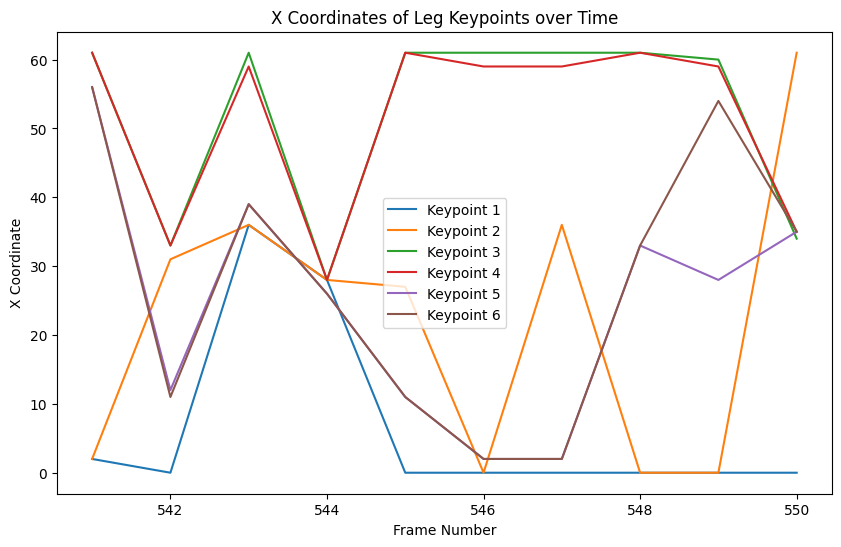

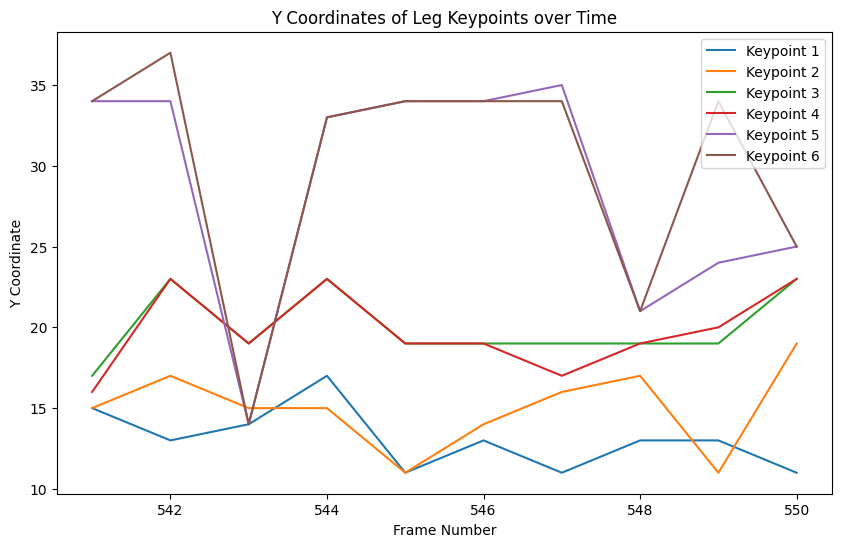

Leg keypoints for frame 551: [array([ 0., 11.], dtype=float32), array([ 0., 13.], dtype=float32), array([ 0., 11.], dtype=float32), array([ 0., 11.], dtype=float32), array([14., 34.], dtype=float32), array([14., 34.], dtype=float32)]
Leg keypoints for frame 552: [array([61., 19.], dtype=float32), array([59., 31.], dtype=float32), array([ 0., 11.], dtype=float32), array([59., 23.], dtype=float32), array([56., 37.], dtype=float32), array([ 0., 13.], dtype=float32)]
Leg keypoints for frame 553: [array([36., 17.], dtype=float32), array([36., 17.], dtype=float32), array([34., 18.], dtype=float32), array([28., 21.], dtype=float32), array([34., 20.], dtype=float32), array([34., 20.], dtype=float32)]
Leg keypoints for frame 554: [array([ 0., 11.], dtype=float32), array([ 0., 13.], dtype=float32), array([ 0., 11.], dtype=float32), array([ 6., 40.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 555: [array([ 0., 10.], dtype=float32), 

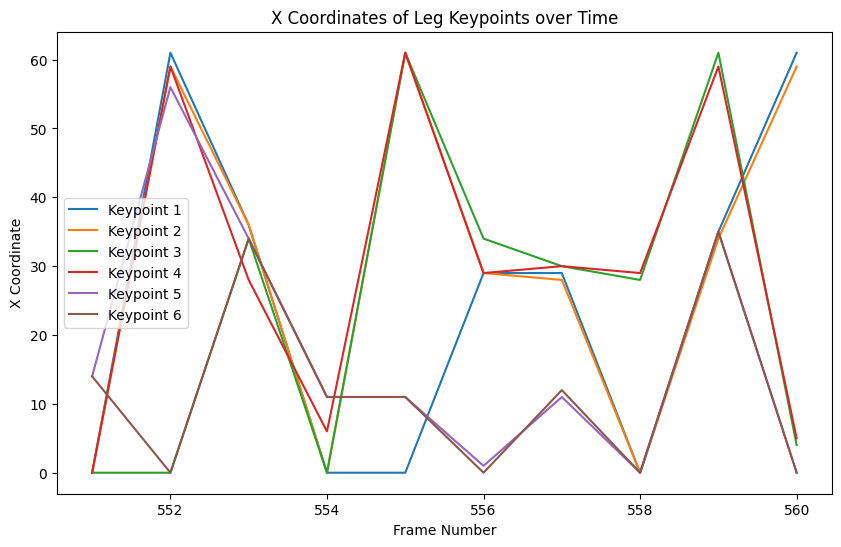

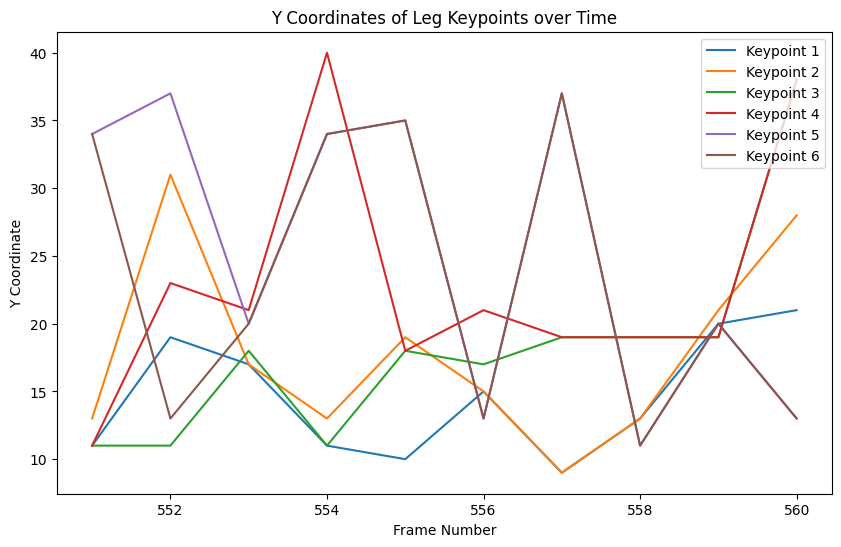

Leg keypoints for frame 561: [array([40., 11.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([ 2., 34.], dtype=float32), array([ 2., 34.], dtype=float32)]
Leg keypoints for frame 562: [array([35., 17.], dtype=float32), array([34., 17.], dtype=float32), array([35., 18.], dtype=float32), array([35., 18.], dtype=float32), array([34., 20.], dtype=float32), array([34., 20.], dtype=float32)]
Leg keypoints for frame 563: [array([61., 19.], dtype=float32), array([61., 24.], dtype=float32), array([61., 19.], dtype=float32), array([59., 18.], dtype=float32), array([11., 37.], dtype=float32), array([11., 37.], dtype=float32)]
Leg keypoints for frame 564: [array([35., 15.], dtype=float32), array([37., 15.], dtype=float32), array([61., 19.], dtype=float32), array([34., 23.], dtype=float32), array([36., 32.], dtype=float32), array([36., 32.], dtype=float32)]
Leg keypoints for frame 565: [array([27., 18.], dtype=float32), 

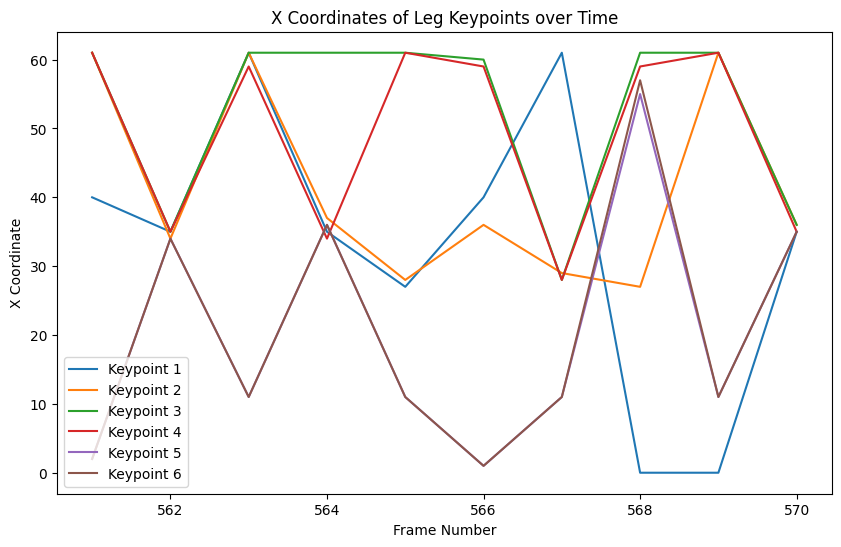

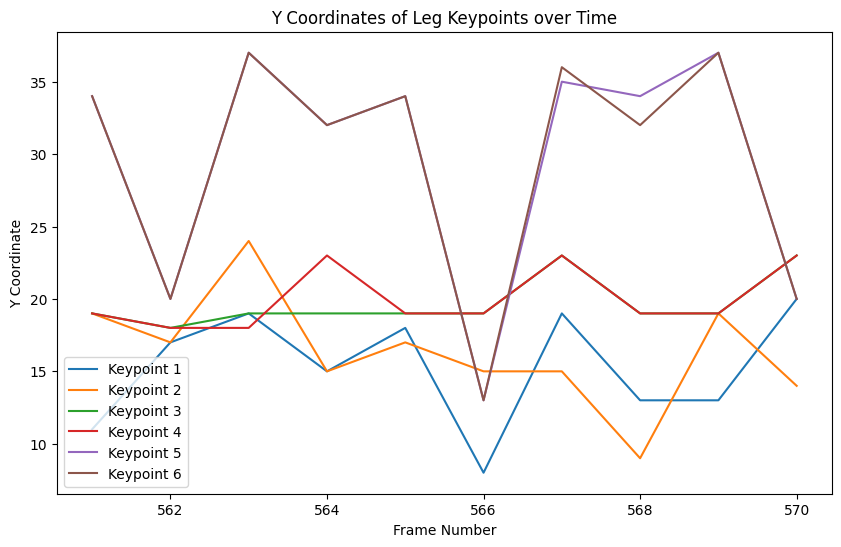

Leg keypoints for frame 571: [array([ 0., 11.], dtype=float32), array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([34., 20.], dtype=float32), array([34., 20.], dtype=float32)]
Leg keypoints for frame 572: [array([ 0., 11.], dtype=float32), array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([34., 24.], dtype=float32), array([34., 24.], dtype=float32)]
Leg keypoints for frame 573: [array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([35., 21.], dtype=float32), array([35., 23.], dtype=float32), array([35., 23.], dtype=float32)]
Leg keypoints for frame 574: [array([ 0., 13.], dtype=float32), array([ 0., 13.], dtype=float32), array([61., 18.], dtype=float32), array([59., 17.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 575: [array([ 0., 11.], dtype=float32), 

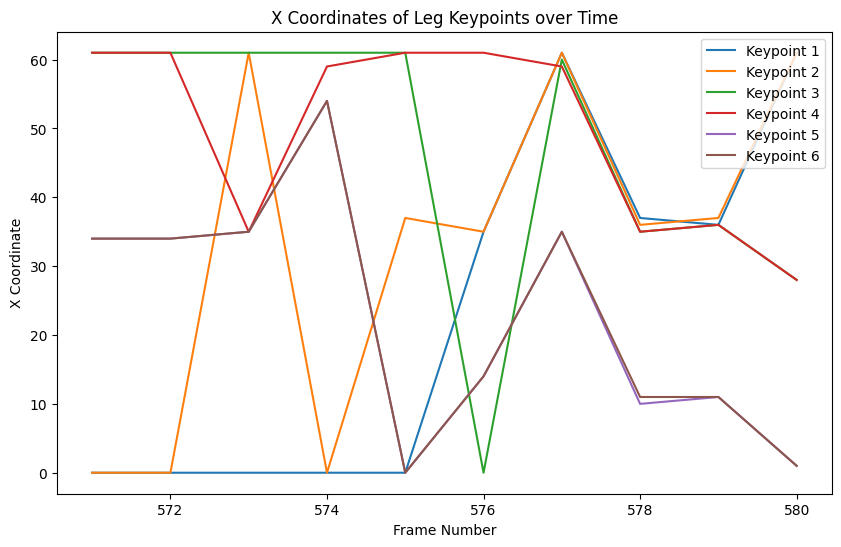

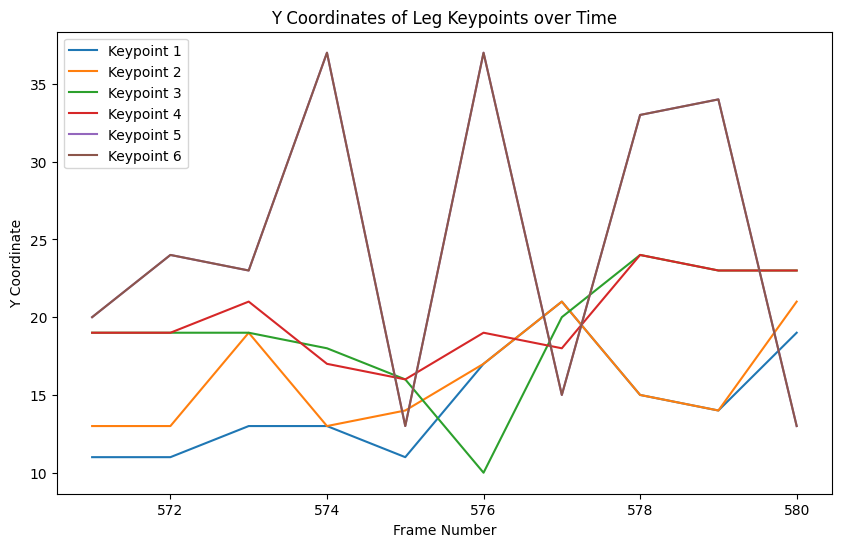

Leg keypoints for frame 581: [array([ 0., 13.], dtype=float32), array([ 0., 11.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([35., 17.], dtype=float32), array([35., 17.], dtype=float32)]
Leg keypoints for frame 582: [array([ 0., 13.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 18.], dtype=float32), array([ 9., 29.], dtype=float32), array([ 9., 29.], dtype=float32)]
Leg keypoints for frame 583: [array([ 3., 19.], dtype=float32), array([61., 31.], dtype=float32), array([32., 17.], dtype=float32), array([32., 17.], dtype=float32), array([11., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 584: [array([61., 19.], dtype=float32), array([ 3., 35.], dtype=float32), array([ 4., 37.], dtype=float32), array([ 4., 37.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32)]
Leg keypoints for frame 585: [array([61., 19.], dtype=float32), 

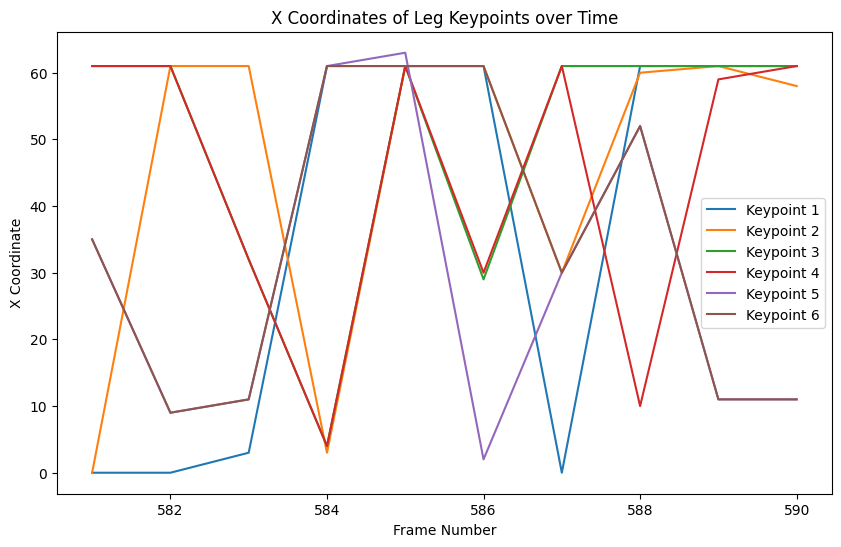

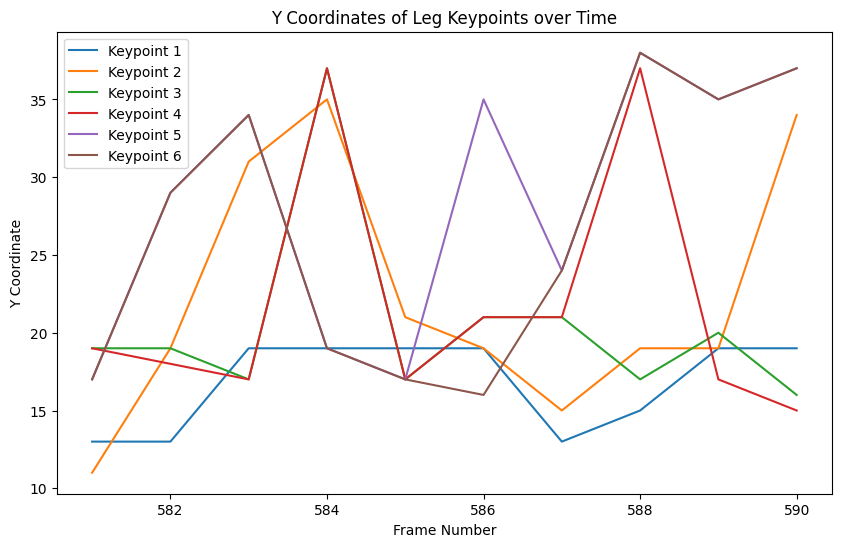

Leg keypoints for frame 591: [array([28., 20.], dtype=float32), array([27., 20.], dtype=float32), array([61., 19.], dtype=float32), array([59., 21.], dtype=float32), array([54., 37.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 592: [array([32., 14.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([12., 34.], dtype=float32), array([11., 34.], dtype=float32)]
Leg keypoints for frame 593: [array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([34., 18.], dtype=float32), array([34., 18.], dtype=float32), array([12., 35.], dtype=float32), array([11., 38.], dtype=float32)]
Leg keypoints for frame 594: [array([61., 19.], dtype=float32), array([59., 34.], dtype=float32), array([61., 15.], dtype=float32), array([61., 15.], dtype=float32), array([54., 34.], dtype=float32), array([54., 37.], dtype=float32)]
Leg keypoints for frame 595: [array([ 0., 13.], dtype=float32), 

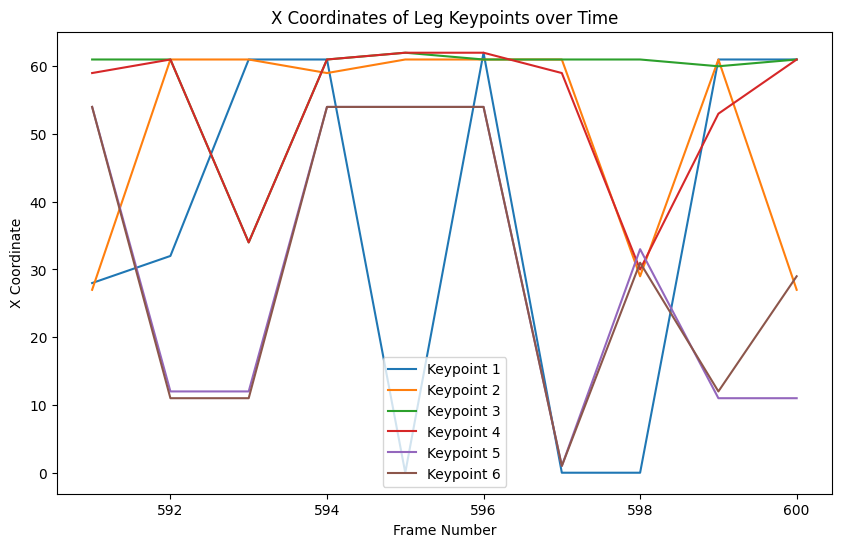

In [ ]:
def main():
    # Load the models
    box_model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    backbone_choice = "tph_a4_256x192"
    model = torch.hub.load('yangsenius/TransPose:main', backbone_choice, pretrained=True)
    model.eval()

    # Define the dataset directory
    dataset_dir = "/content/drive/MyDrive/Project/Image_Dataset/participant00/speed_0.3/left_corner_1/gait_depth_registered"

    # Load images from the dataset directory
    images = load_images_from_dir(dataset_dir)

    # Define the target size for resizing images
    target_size = (256, 192)  # Define the desired size for the input image

    # Lists to store data for plotting
    keypoints_data = []
    frame_numbers = []

    for i, image_bgr in enumerate(images):
        # Preprocess the image
        image_bgr = cv2.resize(image_bgr, target_size)
        img_dimensions = target_size
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        # Convert depth frame to normal image
        depth_image = convert_depth_to_image(image_rgb)

        # Transform the image for input to the model
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        image_tensor = transform(depth_image).unsqueeze(0)

        # Make predictions with the model
        with torch.no_grad():
            output = model(image_tensor)
            preds, _ = get_max_preds(output.clone().cpu().numpy())

        # Get leg keypoints
        if len(preds) > 0:
            leg_keypoints = extract_leg_keypoints(preds[0])
            print(f"Leg keypoints for frame {i+1}: {leg_keypoints}")

            # Check if there are enough keypoints for further processing
            if len(leg_keypoints) >= 6:  # Assuming at least 6 keypoints are required for leg movement analysis
                # Store data for plotting
                keypoints_data.append(leg_keypoints)
                frame_numbers.append(i + 1)  # Increment frame number

        # Plot data every 10, 50, and 100 frames
        if (i + 1) % 10 == 0 or (i + 1) % 50 == 0 or (i + 1) % 100 == 0:
            plot_keypoints_data(frame_numbers, keypoints_data)
            # Clear the keypoints data after plotting
            keypoints_data = []
            frame_numbers = []

    # Plot any remaining data
    if keypoints_data:
        plot_keypoints_data(frame_numbers, keypoints_data)

def plot_keypoints_data(frame_numbers, keypoints_data):
    # Extract x and y coordinates for each keypoint
    x_coords = [[kp[0] for kp in keypoints] for keypoints in keypoints_data]
    y_coords = [[kp[1] for kp in keypoints] for keypoints in keypoints_data]

    # Plot x and y coordinates for each keypoint
    plt.figure(figsize=(10, 6))
    for i in range(len(x_coords[0])):
        plt.plot(frame_numbers, [coords[i] for coords in x_coords], label=f"Keypoint {i+1}")
    plt.xlabel("Frame Number")
    plt.ylabel("X Coordinate")
    plt.title("X Coordinates of Leg Keypoints over Time")
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    for i in range(len(y_coords[0])):
        plt.plot(frame_numbers, [coords[i] for coords in y_coords], label=f"Keypoint {i+1}")
    plt.xlabel("Frame Number")
    plt.ylabel("Y Coordinate")
    plt.title("Y Coordinates of Leg Keypoints over Time")
    plt.legend()
    plt.show()

if __name__ == "__main__":
    main()


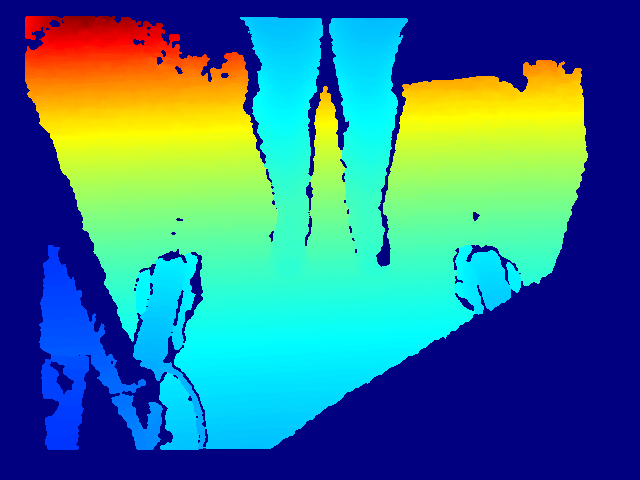

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

def convert_depth_to_image(depth_frame):
    # Normalize depth values
    depth_frame_normalized = cv2.normalize(depth_frame, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    # Apply a colormap for better visualization
    depth_image_colored = cv2.applyColorMap(depth_frame_normalized, cv2.COLORMAP_JET)
    return depth_image_colored

# Load depth image from file
depth_frame = cv2.imread('/content/drive/MyDrive/Project/RRRRgait_depth_registered_00004_1594736879_624156229.png', cv2.IMREAD_UNCHANGED)  # Replace 'path_to_depth_image.png' with your actual file path

# Check if the image was loaded successfully
if depth_frame is None:
    print("Error: Unable to load depth image.")
else:
    # Convert depth image to colored image
    depth_image = convert_depth_to_image(depth_frame)

    # Display the resulting depth image
    cv2_imshow(depth_image)


In [ ]:
def extract_leg_keypoints(all_keypoints):
    """
    Extract keypoints related to the legs from the full body keypoints.
    """
    leg_keypoints = []
    for idx in COCO_LEG_KEYPOINT_INDEXES:
        if idx < len(all_keypoints):
            leg_keypoints.append(all_keypoints[idx])
        else:
            leg_keypoints.append(None)
    return leg_keypoints

def main():
    # Load the models
    box_model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    backbone_choice = "tph_a4_256x192"
    model = torch.hub.load('yangsenius/TransPose:main', backbone_choice, pretrained=True)
    model.eval()

    # Define the dataset directory
    dataset_dir = "/content/drive/MyDrive/Project/Image_Dataset/participant00/speed_0.3/left_corner_1/gait_depth_registered"

    # Load images from the dataset directory
    images = load_images_from_dir(dataset_dir)

    # Define the target size for resizing images
    target_size = (256, 192)  # Define the desired size for the input image

    # Lists to store data for saving to CSV
    keypoints_data = []
    frame_numbers = []

    for i, image_bgr in enumerate(images):
        # Preprocess the image
        image_bgr = cv2.resize(image_bgr, target_size)
        img_dimensions = target_size
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        # Convert depth frame to normal image
        depth_image = convert_depth_to_image(image_rgb)

        # Transform the image for input to the model
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        image_tensor = transform(depth_image).unsqueeze(0)

        # Make predictions with the model
        with torch.no_grad():
            output = model(image_tensor)
            preds, _ = get_max_preds(output.clone().cpu().numpy())

        # Get leg keypoints
        if len(preds) > 0:
            leg_keypoints = extract_leg_keypoints(preds[0])
            print(f"Leg keypoints for frame {i+1}: {leg_keypoints}")

            # Check if there are enough keypoints for further processing
            if len(leg_keypoints) >= 6:  # Assuming at least 6 keypoints are required for leg movement analysis
                # Store data for saving to CSV
                keypoints_data.append(leg_keypoints)
                frame_numbers.append(i + 1)  # Increment frame number

    # Save keypoints to CSV
    save_keypoints_to_csv(frame_numbers, keypoints_data)

def save_keypoints_to_csv(frame_numbers, keypoints_data):
    # Specify the file path to save the CSV
    csv_file_path = "/content/drive/MyDrive/Project/leg_keypoints/leg_keypoints_all.csv"

    # Write the keypoints data to the CSV file
    with open(csv_file_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        # Write the header row
        header_row = ["Frame Number"]
        for i in range(1, len(keypoints_data[0]) + 1):
            header_row.extend([f"Keypoint {i} X", f"Keypoint {i} Y"])
        writer.writerow(header_row)
        # Write the keypoints data
        for frame_num, keypoints in zip(frame_numbers, keypoints_data):
            keypoints_row = [frame_num]
            for kp in keypoints:
                if kp is not None:
                    keypoints_row.extend(kp)
                else:
                    keypoints_row.extend([0, 0])  # If a keypoint is None, fill with zeros
            writer.writerow(keypoints_row)
    print("Keypoints saved to CSV successfully!")

if __name__ == "__main__":
    main()


Using cache found in /root/.cache/torch/hub/yangsenius_TransPose_main


>>Load pretrained weights from url: https://github.com/yangsenius/TransPose/releases/download/Hub/tp_h_48_256x192_enc4_d96_h192_mh1.pth
Successfully loaded model  (on cpu) with pretrained weights!
Leg keypoints for frame 1: [array([59., 22.], dtype=float32), array([61., 22.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([28., 20.], dtype=float32), array([28., 20.], dtype=float32)]
Leg keypoints for frame 2: [array([36., 11.], dtype=float32), array([37., 12.], dtype=float32), array([62., 19.], dtype=float32), array([62., 19.], dtype=float32), array([34., 18.], dtype=float32), array([ 3., 19.], dtype=float32)]
Leg keypoints for frame 3: [array([40., 11.], dtype=float32), array([33., 12.], dtype=float32), array([61., 19.], dtype=float32), array([61., 19.], dtype=float32), array([ 2., 34.], dtype=float32), array([ 2., 37.], dtype=float32)]
Leg keypoints for frame 4: [array([59., 31.], dtype=float32), array([59., 28.], dtype=float32), array([60.,

In [ ]:
def calculate_angle(p1, p2, p3):
    """
    Calculate the angle between three points.
    """
    v1 = np.array(p1) - np.array(p2)
    v2 = np.array(p3) - np.array(p2)
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    cosine_theta = dot_product / (norm_v1 * norm_v2)
    angle = np.arccos(np.clip(cosine_theta, -1.0, 1.0))
    return np.degrees(angle)


In [ ]:
def estimate_knee_adduction(knee_point, hip_point, ankle_point):
    """
    Estimate knee adduction angle.
    """
    return calculate_angle(hip_point, knee_point, ankle_point)

In [ ]:
# Read key points data from CSV file
csv_file_path = "/content/drive/MyDrive/Project/leg_keypoints/leg_keypoints_all.csv"
leg_keypoints = []
with open(csv_file_path, mode='r') as file:
    reader = csv.reader(file)
    next(reader)  # Skip header row
    for row in reader:
        frame_number = int(row[0])
        keypoints = [[float(row[i]), float(row[i+1])] for i in range(1, len(row), 2)]
        leg_keypoints.append(keypoints)

In [ ]:
for i, keypoints in enumerate(leg_keypoints):
    hip_point, knee_point, ankle_point = keypoints[0], keypoints[1], keypoints[2]
    adduction_angle = estimate_knee_adduction(knee_point, hip_point, ankle_point)
    print(f"Frame {i+1}: Knee Adduction Angle: {adduction_angle} degrees")

Frame 1: Knee Adduction Angle: 108.43494882292202 degrees
Frame 2: Knee Adduction Angle: 150.64224645720873 degrees
Frame 3: Knee Adduction Angle: 22.166345822082455 degrees
Frame 4: Knee Adduction Angle: 173.65980825409005 degrees
Frame 5: Knee Adduction Angle: nan degrees
Frame 6: Knee Adduction Angle: 49.02199017702011 degrees
Frame 7: Knee Adduction Angle: 146.30993247402023 degrees
Frame 8: Knee Adduction Angle: nan degrees
Frame 9: Knee Adduction Angle: nan degrees
Frame 10: Knee Adduction Angle: 158.96248897457818 degrees
Frame 11: Knee Adduction Angle: nan degrees
Frame 12: Knee Adduction Angle: 1.8603909437914135 degrees
Frame 13: Knee Adduction Angle: 18.434948822922017 degrees
Frame 14: Knee Adduction Angle: nan degrees
Frame 15: Knee Adduction Angle: 0.0 degrees
Frame 16: Knee Adduction Angle: nan degrees
Frame 17: Knee Adduction Angle: 26.565051177077994 degrees
Frame 18: Knee Adduction Angle: nan degrees
Frame 19: Knee Adduction Angle: nan degrees
Frame 20: Knee Adduction

<ipython-input-17-36701a8ae116>:13: RuntimeWarning: invalid value encountered in scalar divide
  cosine_theta = dot_product / (norm_v1 * norm_v2)


In [ ]:
def calculate_angle(p1, p2, p3):
    """
    Calculate the angle between three points.
    """
    v1 = np.array(p1) - np.array(p2)
    v2 = np.array(p3) - np.array(p2)
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    cosine_theta = dot_product / (norm_v1 * norm_v2)
    angle = np.arccos(np.clip(cosine_theta, -1.0, 1.0))
    return np.degrees(angle)

In [ ]:
def estimate_knee_flexion_moment(knee_angle):
    """
    Estimate knee flexion moment using a simplified biomechanical model.
    """
    # Example biomechanical model (replace with your actual model)
    thigh_length = 0.4  # Length of the thigh segment (meters)
    body_mass = 70  # Total body mass (kg)
    g = 9.81  # Acceleration due to gravity (m/s^2)

    # Calculate knee flexion moment
    knee_flexion_moment = body_mass * g * thigh_length * np.sin(np.radians(knee_angle))  # Example equation (replace with your actual equation)

    return knee_flexion_moment


In [ ]:
# Read key points data from CSV file
csv_file_path = "/content/drive/MyDrive/Project/leg_keypoints/leg_keypoints_all.csv"
leg_keypoints = []
with open(csv_file_path, mode='r') as file:
    reader = csv.reader(file)
    next(reader)  # Skip header row
    for row in reader:
        frame_number = int(row[0])
        keypoints = [[float(row[i]), float(row[i+1])] for i in range(1, len(row), 2)]
        leg_keypoints.append(keypoints)

In [ ]:
for i, keypoints in enumerate(leg_keypoints):
    hip_point, knee_point, ankle_point = keypoints[0], keypoints[1], keypoints[2]
    adduction_angle = estimate_knee_adduction(knee_point, hip_point, ankle_point)
    flexion_moment = estimate_knee_flexion_moment(adduction_angle)
    print(f"Frame {i+1}: Knee Adduction Angle: {adduction_angle} degrees, Knee Flexion Moment: {flexion_moment} Nm")

Frame 1: Knee Adduction Angle: 108.43494882292202 degrees, Knee Flexion Moment: 260.5843283085151 Nm
Frame 2: Knee Adduction Angle: 150.64224645720873 degrees, Knee Flexion Moment: 134.66495730227132 Nm
Frame 3: Knee Adduction Angle: 22.166345822082455 degrees, Knee Flexion Moment: 103.63590900727752 Nm
Frame 4: Knee Adduction Angle: 173.65980825409005 degrees, Knee Flexion Moment: 30.333331582239065 Nm
Frame 5: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm
Frame 6: Knee Adduction Angle: 49.02199017702011 degrees, Knee Flexion Moment: 207.37277558010047 Nm
Frame 7: Knee Adduction Angle: 146.30993247402023 degrees, Knee Flexion Moment: 152.36504989914596 Nm
Frame 8: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm
Frame 9: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm
Frame 10: Knee Adduction Angle: 158.96248897457818 degrees, Knee Flexion Moment: 98.60437350456016 Nm
Frame 11: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm

<ipython-input-18-21b9a4e0d90d>:13: RuntimeWarning: invalid value encountered in scalar divide
  cosine_theta = dot_product / (norm_v1 * norm_v2)


Frame 566: Knee Adduction Angle: 69.71744091108339 degrees, Knee Flexion Moment: 257.64832893838087 Nm
Frame 567: Knee Adduction Angle: 90.0 degrees, Knee Flexion Moment: 274.68 Nm
Frame 568: Knee Adduction Angle: 155.18349064448455 degrees, Knee Flexion Moment: 115.28694109775994 Nm
Frame 569: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm
Frame 570: Knee Adduction Angle: 9.462322208025574 degrees, Knee Flexion Moment: 45.15711383303534 Nm
Frame 571: Knee Adduction Angle: 95.61758059012683 degrees, Knee Flexion Moment: 273.36082481905595 Nm
Frame 572: Knee Adduction Angle: 95.61758059012683 degrees, Knee Flexion Moment: 273.36082481905595 Nm
Frame 573: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm
Frame 574: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm
Frame 575: Knee Adduction Angle: 179.87182173617654 degrees, Knee Flexion Moment: 0.6144951065906321 Nm
Frame 576: Knee Adduction Angle: nan degrees, Knee Flexion Moment: nan Nm
Frame 5